# Problem Statement  
To predict the cost required to ship the sculptures to customers based on the information provided in the dataset.

# How will the company profit from this solution?
For the transport company having these kind of solution will help in many ways.
1. They can prioritize transports based on how reputated the artist is and how big the client is, because they don't want to mess with good paying clients.
1. They can do batch transports of the sculptures whcih are intended to go at same nearby location which will make the delivery cost less.
1. The company can't keep track which factor is making the cost vary more.
1. The cost is overall cost that company had to incur in order to ship the product. It's not something they can know before hand. There is no specific formula calculator the cost.
1. That's why they want a Data Scientist to look into past data and try to build some models which will predict the cost for future shipments.
1. So that accordingly they can ask the customers price that is profitable to them. 
1. If model is not in place then there maybe a chance of the company asking lower price for shipment while the actual cost of shipment for delivery was much higher. Thus they have a high chance of making lots of losses

## Dataset Desciption  
The dataset folder contains the following files:  
train.csv: *6500 x 20*  
test.csv: *3500 x 19*  

### Columns Provided in the Dataset  
1. Customer Id
1. Artist Name
1. Artist Reputation
1. Height
1. Width
1. Material
1. Price of Sculpture
1. Base Shipping Price
1. International
1. Express Shipment
1. Installation Included
1. Transport
1. Fragile
1. Customer Information
1. Remote Location
1. Scheduled Date
1. Delivery Date
1. Customer Location
1. Cost

In [6]:
# Importing Necessary Libraries
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
pd.options.display.max_columns = None
import seaborn as sns
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")
from tqdm import tqdm

In [7]:
# Read the dataset
train_data = pd.read_csv('/content/dataset/train.csv')
test_data =  pd.read_csv('/content/dataset/test.csv')

### Basic EDA

# Identifying the number of features or columns

## Know all the names of the columns¶


In [ ]:
train_data.columns

Index(['Artist Reputation', 'Height', 'Width', 'Weight', 'Material',
       'Price Of Sculpture', 'Base Shipping Price', 'International',
       'Express Shipment', 'Installation Included', 'Transport', 'Fragile',
       'Customer Information', 'Remote Location', 'Scheduled Date',
       'Delivery Date', 'Customer Location', 'Cost'],
      dtype='object')

## Knows more about the data in the columns like data type it contains and total samples of each

In [ ]:
# Check which columns are having categorical, numerical or boolean values
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6500 entries, 0 to 6499
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Customer Id            6500 non-null   object 
 1   Artist Name            6500 non-null   object 
 2   Artist Reputation      5750 non-null   float64
 3   Height                 6125 non-null   float64
 4   Width                  5916 non-null   float64
 5   Weight                 5913 non-null   float64
 6   Material               5736 non-null   object 
 7   Price Of Sculpture     6500 non-null   float64
 8   Base Shipping Price    6500 non-null   float64
 9   International          6500 non-null   object 
 10  Express Shipment       6500 non-null   object 
 11  Installation Included  6500 non-null   object 
 12  Transport              5108 non-null   object 
 13  Fragile                6500 non-null   object 
 14  Customer Information   6500 non-null   object 
 15  Remo

In [ ]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Customer Id            3500 non-null   object 
 1   Artist Name            3500 non-null   object 
 2   Artist Reputation      3278 non-null   float64
 3   Height                 3381 non-null   float64
 4   Width                  3359 non-null   float64
 5   Weight                 3351 non-null   float64
 6   Material               3500 non-null   object 
 7   Price Of Sculpture     3500 non-null   float64
 8   Base Shipping Price    3500 non-null   float64
 9   International          3500 non-null   object 
 10  Express Shipment       3500 non-null   object 
 11  Installation Included  3500 non-null   object 
 12  Transport              3268 non-null   object 
 13  Fragile                3500 non-null   object 
 14  Customer Information   3500 non-null   object 
 15  Remo

1. After checking the Dtypes of all the columns 
    1. object - String values
    1. float64 - Numerical values
1. There are more String values than the numerical values in the dataset

# Know more mathematical relations of the dataset like count, min, max values, standarad deviation values, mean and different percentile values

In [ ]:
# For more information on the dataset like the total count in all the columns
# min, max values and more information of the respective columns  
train_data.describe()

,Artist Reputation,Height,Width,Weight,Price Of Sculpture,Base Shipping Price,Cost
count,5750.000000,6125.000000,5916.000000,5.913000e+03,6500.00000,6500.000000,6.500000e+03
mean,0.461850,21.766204,9.617647,4.006948e+05,1192.42009,37.407174,1.713920e+04
std,0.265781,11.968192,5.417000,2.678081e+06,8819.61675,26.873519,2.406579e+05
min,0.000000,3.000000,2.000000,3.000000e+00,3.00000,10.000000,-8.801727e+05
25%,0.240000,12.000000,6.000000,5.030000e+02,5.23000,16.700000,1.884400e+02
50%,0.450000,20.000000,8.000000,3.102000e+03,8.02500,23.505000,3.820650e+02
75%,0.680000,30.000000,12.000000,3.645600e+04,89.47000,57.905000,1.156115e+03
max,1.000000,73.000000,50.000000,1.179279e+08,382385.67000,99.980000,1.114343e+07


In [ ]:
test_data.describe()

,Artist Reputation,Height,Width,Weight,Price Of Sculpture,Base Shipping Price
count,3278.000000,3381.000000,3359.000000,3.351000e+03,3500.000000,3500.000000
mean,0.463279,21.275067,9.371837,3.749665e+05,1059.608646,36.352909
std,0.272287,11.689805,5.231695,2.517256e+06,7409.348267,26.299318
min,0.000000,3.000000,2.000000,4.000000e+00,3.000000,10.000000
25%,0.230000,12.000000,6.000000,4.895000e+02,5.160000,16.870000
50%,0.450000,20.000000,8.000000,2.929000e+03,7.120000,23.055000
75%,0.680000,29.000000,12.000000,3.340650e+04,81.195000,55.742500
max,1.000000,65.000000,48.000000,6.459500e+07,227254.240000,99.980000


## Get the total number of samples in the dataset using the len() function

In [ ]:
print('train data length: ',len(train_data))
print('test data length: ',len(test_data))

train data length:  6500
test data length:  3500


## Get unique values

In [ ]:
for x in train_data.columns:
    print(x,':',len(train_data[x].unique()))

Customer Id : 6500
Artist Name : 6449
Artist Reputation : 102
Height : 66
Width : 41
Weight : 4411
Material : 8
Price Of Sculpture : 3424
Base Shipping Price : 3732
International : 2
Express Shipment : 2
Installation Included : 2
Transport : 4
Fragile : 2
Customer Information : 2
Remote Location : 3
Scheduled Date : 1660
Delivery Date : 1664
Customer Location : 6500
Cost : 6356


In [ ]:
for x in test_data.columns:
    print(x,':',len(test_data[x].unique()))

Customer Id : 3500
Artist Name : 3482
Artist Reputation : 102
Height : 61
Width : 39
Weight : 2701
Material : 7
Price Of Sculpture : 2054
Base Shipping Price : 2434
International : 2
Express Shipment : 2
Installation Included : 2
Transport : 4
Fragile : 2
Customer Information : 2
Remote Location : 2
Scheduled Date : 1479
Delivery Date : 1472
Customer Location : 3500




## By the observation gather from the train_data.info(), we can know this columns are missing values in the train dataset

    1. Artist reputation
    2. Height
    3. Width
    4. Weight
    5. Transport
    6. Material
    7. Remote Location

## By the observation gather from the test_data.info(), we can know this columns are missing values in the test dataset

    1. Artist Reputation
    2. Height
    3. Width
    4. Weight
    5. Transport



## Counting the total number of missing values¶


In [ ]:
# Check for missing values in all the columnns of the dataset
train_data.isnull().sum()

Customer Id                 0
Artist Name                 0
Artist Reputation         750
Height                    375
Width                     584
Weight                    587
Material                  764
Price Of Sculpture          0
Base Shipping Price         0
International               0
Express Shipment            0
Installation Included       0
Transport                1392
Fragile                     0
Customer Information        0
Remote Location           771
Scheduled Date              0
Delivery Date               0
Customer Location           0
Cost                        0
dtype: int64

In [ ]:
# Check for missing values in all the columnns of the dataset
test_data.isnull().sum()

Customer Id                0
Artist Name                0
Artist Reputation        222
Height                   119
Width                    141
Weight                   149
Material                   0
Price Of Sculpture         0
Base Shipping Price        0
International              0
Express Shipment           0
Installation Included      0
Transport                232
Fragile                    0
Customer Information       0
Remote Location            0
Scheduled Date             0
Delivery Date              0
Customer Location          0
dtype: int64

In [ ]:
categorical_list = []
var_list = []
# looping on whole dataset for geting list of categorical data column name
for x in train_data.columns:
  if train_data[x].dtype == 'object':
    categorical_list.append(x)
  elif train_data[x].dtype == 'int64':
    var_list.append(x)
  elif train_data[x].dtype == 'float64':
    var_list.append(x)


print('Categorical data',categorical_list)
print('Numerical data', var_list)

Categorical data ['Customer Id', 'Artist Name', 'Material', 'International', 'Express Shipment', 'Installation Included', 'Transport', 'Fragile', 'Customer Information', 'Remote Location', 'Scheduled Date', 'Delivery Date', 'Customer Location']
Numerical data ['Artist Reputation', 'Height', 'Width', 'Weight', 'Price Of Sculpture', 'Base Shipping Price', 'Cost']



## Check for categorical columns in the dataset

#### By observing the train_data.info() cell, we can biforcate the datatype for which the object is the values which indicates those are the categorical columns. This dataset has more categorical columns than numerical values

    1. Customer Id
    2. Artist Name
    3. Material
    4. International
    5. Express Shipment
    6. Installation included
    7. Transport
    8. Fragile
    9. Customer Information
    10. Remote Information
    11. Scheduled Date
    12. Delivery Date
    13. Customer Location



# Correlation Matrix


## Why?
#### A correlation matrix is a table showing correlation coefficients between variables.

### There are three broad reasons for computing a correlation matrix:

  1. To summarize a large amount of data where the goal is to see patterns. In our example above, the observable pattern is that all the variables highly correlate with each other.
  2. To input into other analyses. For example, people commonly use correlation matrixes as inputs for exploratory factor analysis, confirmatory factor analysis, structural equation models, and linear regression when excluding missing values pairwise.
  3. As a diagnostic when checking other analyses. For example, with linear regression, a high amount of correlations suggests that the linear regression estimates will be unreliable.

In [ ]:
# Using pandas
corr = train_data.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,Artist Reputation,Height,Width,Weight,Price Of Sculpture,Base Shipping Price,Cost
Artist Reputation,1.00,-0.00,-0.01,0.02,0.05,-0.01,0.07
Height,-0.00,1.00,0.77,0.23,0.20,0.35,0.11
Width,-0.01,0.77,1.00,0.33,0.29,0.33,0.16
Weight,0.02,0.23,0.33,1.00,0.89,0.15,0.42
Price Of Sculpture,0.05,0.20,0.29,0.89,1.00,0.13,0.48
Base Shipping Price,-0.01,0.35,0.33,0.15,0.13,1.00,0.05
Cost,0.07,0.11,0.16,0.42,0.48,0.05,1.00


## From above correlation matrix:
1. Artist Reputation and all other numerical variables have almost no correlation.

2. Height and Width are strongly correlated.

3. Weight and Price of Sculpture are strongly correlated.

4. Cost has weak correlation with Weight and Prie of Sculpture.

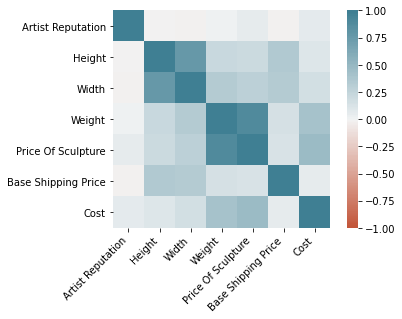

In [ ]:
# Using seaborn
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

# Chi-square Test



1. The Chi Square statistic is commonly used for testing relationships between categorical variables.

2. The null hypothesis of the Chi-Square test is that no relationship exists on the categorical variables in the population; they are independent.

3. Example: Is there any significant relationship between gender and education qualification?

4. The Chi-Square statistic is most commonly used to evaluate Tests of Independence when using a crosstabulation.

5. Crosstabulation presents the distributions of two categorical variables simultaneously, with the intersections of the categories of the variables appearing in the cells of the table. that is values of one variable represents the row and other's value represents the column.

6. Formula: x^2 = Summation of( (observed value - Expected value)^2/Expected value )

7. The Chi-Square statistic is based on the difference between what is actually observed in the data and what would be expected if there was truly no relationship between the variables.

8. This statistic can be evaluated by comparing the actual value against a critical value found in a Chi-Square distribution (where degrees of freedom is calculated as of rows – 1 x columns – 1), but it is easier to simply examine the p-value.

9. To make a conclusion about the hypothesis with 95% confidence. Significance(p value of the Chi-square statistic) should be less than 0.05.

    1. Alpha level = 0.05(i.e 5%) 95% confidence about conclusion and 5% risk of not making a correct conclusion.

    2. Interpret the key results for Chi-Square Test for Association

        Determine whether the association between the variables is statistically significant.

        Examine the differences between expected counts and observed counts to determine which variable levels may have the most impact on association.


In [ ]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2

def perform_chi_square_test(var_1,var_2):
    
    #Contingency Table
    contingency_table = pd.crosstab(train_data[var_1],train_data[var_2])
    
    #Observed Values
    observed_values = contingency_table.values
    
    #Expected Values
    b = chi2_contingency(contingency_table)
    expected_values = b[3]
    
    #Degree of Freedom
    no_of_rows = len(contingency_table.iloc[0:,0])
    no_of_columns = len(contingency_table.iloc[0,0:])
    degree_f=(no_of_rows-1)*(no_of_columns-1)
    print("Degree of Freedom: ",degree_f)
    
    #Significance Level 5%
    alpha = 0.05
    print('Significance level: ',alpha)
    
    #chi-square statistic
    chi_square = sum([(o-e)**2./e for o,e in zip(observed_values,expected_values)])
    chi_square_statistic = chi_square[0]+chi_square[1]
    print("chi-square statistic: ",chi_square_statistic)
    
    #critical_value
    critical_value=chi2.ppf(q=1-alpha,df=degree_f)
    print('critical_value:',critical_value)
    
    #p-value
    p_value = 1-chi2.cdf(x=chi_square_statistic,df=degree_f)

    print('p-value:',p_value)
          
    if chi_square_statistic>=critical_value:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")

    if p_value<=alpha:
        print("Reject H0,There is a relationship between 2 categorical variables")
    else:
        print("Retain H0,There is no relationship between 2 categorical variables")

In [ ]:
# looping on whole dataset for performing chi-square test
for x in tqdm(categorical_list):
    for i in categorical_list:
        if i != x:
            print('chi-square test on: ',x,' ',i,'\n')
            perform_chi_square_test(x,i)
            print('-------------------------------------------------------------------\n')

  0%|          | 0/13 [00:00<?, ?it/s]

chi-square test on:  Customer Id   Artist Name 

Degree of Freedom:  41905552
Significance level:  0.05
chi-square statistic:  12997.999999999767
critical_value: 41920611.509491675
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Customer Id   Material 

Degree of Freedom:  34410
Significance level:  0.05
chi-square statistic:  9780.000000000084
critical_value: 34842.6378000954
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Customer Id   International 

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  6499.9999999995
critical_value: 6687.657867435159
p-value: 0.4941683590487659
Retain H0,Th

  8%|▊         | 1/13 [00:18<03:43, 18.58s/it]

chi-square statistic:  12997.99999999973
critical_value: 42252119.94376706
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Artist Name   Customer Id 

Degree of Freedom:  41905552
Significance level:  0.05
chi-square statistic:  12997.999999999802
critical_value: 41920611.509491675
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Artist Name   Material 

Degree of Freedom:  34146
Significance level:  0.05
chi-square statistic:  9705.98935889295
critical_value: 34576.97931228599
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical var

 15%|█▌        | 2/13 [00:35<03:19, 18.14s/it]

chi-square statistic:  12997.999999999844
critical_value: 41920611.509491675
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Material   Customer Id 

Degree of Freedom:  34410
Significance level:  0.05
chi-square statistic:  11.817577445179253
critical_value: 34842.6378000954
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Material   Artist Name 

Degree of Freedom:  34146
Significance level:  0.05
chi-square statistic:  11.576331360946746
critical_value: 34576.97931228599
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variabl

 23%|██▎       | 3/13 [00:40<02:22, 14.23s/it]

Degree of Freedom:  34410
Significance level:  0.05
chi-square statistic:  12.218217493944875
critical_value: 34842.6378000954
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  International   Customer Id 

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  2.4602496219608545
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  International   Artist Name 

Degree of Freedom:  6448
Significance level:  0.05
chi-square statistic:  1.0274802049371217
critical_value: 6635.920591949084
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retai

 31%|███       | 4/13 [00:46<01:45, 11.68s/it]

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  2.4602496219608545
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Express Shipment   Customer Id 

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  0.9782359679266897
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Express Shipment   Artist Name 

Degree of Freedom:  6448
Significance level:  0.05
chi-square statistic:  2.5336144710827826
critical_value: 6635.920591949084
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables

 38%|███▊      | 5/13 [00:52<01:18,  9.85s/it]

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  2.5336144710827826
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Installation Included   Customer Id 

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  2.175336873096639
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Installation Included   Artist Name 

Degree of Freedom:  6448
Significance level:  0.05
chi-square statistic:  1.3197139938712972
critical_value: 6635.920591949084
p-value: 1.0
Retain H0,There is no relationship between 2 categorical 

 46%|████▌     | 6/13 [00:57<01:00,  8.59s/it]

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  3.030959752321981
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Transport   Customer Id 

Degree of Freedom:  10214
Significance level:  0.05
chi-square statistic:  2.949612403100775
critical_value: 10450.224787309298
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Transport   Artist Name 

Degree of Freedom:  10158
Significance level:  0.05
chi-square statistic:  3.2860334992939206
critical_value: 10393.579416858618
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,T

 54%|█████▍    | 7/13 [01:02<00:44,  7.38s/it]

Degree of Freedom:  10214
Significance level:  0.05
chi-square statistic:  4.974226482747608
critical_value: 10450.224787309298
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Fragile   Customer Id 

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  0.38051638893975465
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Fragile   Artist Name 

Degree of Freedom:  6448
Significance level:  0.05
chi-square statistic:  0.38051638893975465
critical_value: 6635.920591949084
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,Ther

 62%|██████▏   | 8/13 [01:07<00:34,  6.84s/it]

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  0.38051638893975465
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Customer Information   Customer Id 

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  0.7066416822819073
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Customer Information   Artist Name 

Degree of Freedom:  6448
Significance level:  0.05
chi-square statistic:  0.7066416822819073
critical_value: 6635.920591949084
p-value: 1.0
Retain H0,There is no relationship between 2 categorical 

 69%|██████▉   | 9/13 [01:13<00:26,  6.57s/it]

Degree of Freedom:  6499
Significance level:  0.05
chi-square statistic:  0.7066416822819073
critical_value: 6687.657867435159
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Remote Location   Customer Id 

Degree of Freedom:  5728
Significance level:  0.05
chi-square statistic:  0.49412276882890727
critical_value: 5905.18280825411
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Remote Location   Artist Name 

Degree of Freedom:  5684
Significance level:  0.05
chi-square statistic:  4.294638476925466
critical_value: 5860.505294489989
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Re

 77%|███████▋  | 10/13 [01:18<00:18,  6.13s/it]

Degree of Freedom:  5728
Significance level:  0.05
chi-square statistic:  0.49412276882890727
critical_value: 5905.18280825411
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Scheduled Date   Customer Id 

Degree of Freedom:  10781841
Significance level:  0.05
chi-square statistic:  2598.0000000000364
critical_value: 10789480.296237782
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Scheduled Date   Artist Name 

Degree of Freedom:  10697232
Significance level:  0.05
chi-square statistic:  3789.6666666666415
critical_value: 10704841.267512009
p-value: 1.0
Retain H0,There is no relationship between 2 categorical var

 85%|████████▍ | 11/13 [01:27<00:13,  6.96s/it]

Degree of Freedom:  10781841
Significance level:  0.05
chi-square statistic:  2598.00000000005
critical_value: 10789480.296237782
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Delivery Date   Customer Id 

Degree of Freedom:  10807837
Significance level:  0.05
chi-square statistic:  2381.3333333333658
critical_value: 10815485.498842983
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Delivery Date   Artist Name 

Degree of Freedom:  10723024
Significance level:  0.05
chi-square statistic:  7797.999999999936
critical_value: 10730642.43393801
p-value: 1.0
Retain H0,There is no relationship between 2 categorical vari

 92%|█████████▏| 12/13 [01:36<00:07,  7.58s/it]

Degree of Freedom:  10807837
Significance level:  0.05
chi-square statistic:  2706.3333333333794
critical_value: 10815485.498842983
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Customer Location   Customer Id 

Degree of Freedom:  42237001
Significance level:  0.05
chi-square statistic:  12997.999999999918
critical_value: 42252119.94376706
p-value: 1.0
Retain H0,There is no relationship between 2 categorical variables
Retain H0,There is no relationship between 2 categorical variables
-------------------------------------------------------------------

chi-square test on:  Customer Location   Artist Name 

Degree of Freedom:  41905552
Significance level:  0.05
chi-square statistic:  12997.99999999969
critical_value: 41920611.509491675
p-value: 1.0
Retain H0,There is no relationship between 2 catego

100%|██████████| 13/13 [01:54<00:00,  8.78s/it]

From above chi-square test:

- correlated variables:

  1. Customer Information and Transport 
  2. Customer Information and Express Shipment
  3. Fragile and Material 
  4. Transport and Express Shipment
  5. Transport and International 


# Variance inflation factor (VIF)

1. The variance inflation factor (VIF) quantifies the extent of correlation between one predictor and the other predictors in a model. 
2. It is used for diagnosing collinearity/multicollinearity. 
3. Higher values signify that it is difficult to impossible to assess accurately the contribution of predictors to a model.

In [ ]:
import statsmodels.api as sm

In [ ]:
# creating a dataframe of just numerical values
train_for_vif = train_data.drop(['Customer Id',
 'Artist Name',
 'Material',
 'International',
 'Express Shipment',
 'Installation Included',
 'Transport',
 'Fragile',
 'Customer Information',
 'Remote Location',
 'Scheduled Date',
 'Delivery Date',
 'Customer Location',
 'Cost'],axis=1)

# target values
target = train_data['Cost']

# numerical values column names
names = ['Artist Reputation',
 'Height',
 'Width',
 'Weight',
 'Price Of Sculpture',
 'Base Shipping Price']

names

['Artist Reputation',
 'Height',
 'Width',
 'Weight',
 'Price Of Sculpture',
 'Base Shipping Price']

In [ ]:
# droping rows with empty cells
train_for_vif = train_for_vif.dropna()

In [ ]:
# Calculating VIF for each feature.
for i in range(0, len(names)):
  y = train_for_vif.loc[:, train_for_vif.columns == names[i]]
  x = train_for_vif.loc[:,train_for_vif.columns != names[i]]
  model = sm.OLS(y, x)
  results = model.fit()
  rsq = results.rsquared
  vif = round(1/(1-rsq),2)
  print("R Square value of {} columns is {} keeping all other columns as features".format(names[i],(round(rsq, 2))))
  print("Variance inflation Factor of {} columns is {} \n".format(names[i], vif))


R Square value of Artist Reputation columns is 0.61 keeping all other columns as features
Variance inflation Factor of Artist Reputation columns is 2.55 

R Square value of Height columns is 0.9 keeping all other columns as features
Variance inflation Factor of Height columns is 10.47 

R Square value of Width columns is 0.9 keeping all other columns as features
Variance inflation Factor of Width columns is 10.36 

R Square value of Weight columns is 0.84 keeping all other columns as features
Variance inflation Factor of Weight columns is 6.09 

R Square value of Price Of Sculpture columns is 0.83 keeping all other columns as features
Variance inflation Factor of Price Of Sculpture columns is 6.01 

R Square value of Base Shipping Price columns is 0.68 keeping all other columns as features
Variance inflation Factor of Base Shipping Price columns is 3.12 



Observations:

there is colinearity/multicolinearity between 
variables as the VIF value is above 2.5

1. There is high colinearity between height and all other variables.
2. There is high colinearity between Width and all other variables.
3. There is high colinearity between Price Of Sculpture and all other variables.

# ANOVA TEST

### Normality Assumption Check

Before we perform the hypothesis test, we check if the assumptions for the one-way ANOVA hypothesis test are fulfilled. The samples are random and independent samples. Now, we check the normality assumption by plotting a normal probability plot (Q-Q plots) for each grouped variable.

## Homogeneity of variance Assumption Check

### Hypothesis Testing

According to five steps process of hypothesis testing:
H₀: μ₁= μ₂ = μ₃ = … = μ₆
H₁: Not all salary means are equal
α = 0.05
According to F test statistics:

In [ ]:
# perform anova test between two variables.

def perform_anova_test(x,y):
  # two variables of interest
  train_anova = train_data[[x, y]]
  groups = train_anova.groupby(x).count().reset_index()
  # groups.plot(kind='bar',x='major',y='salary')
  print(groups)


  unique_majors = train_anova[x].unique()
  # for major in unique_majors:
  #     stats.probplot(train_anova[train_anova[x] == major][y], dist="norm", plot=plt)
  #     plt.title("Probability Plot - " +  major)
  #     plt.show()


  # calculate ratio of the largest to the smallest sample standard deviation
  ratio = train_anova.groupby(x).std().max() / train_anova.groupby(x).std().min()
  print(ratio)


  # Create ANOVA backbone table
  data = [['Between Groups', '', '', '', '', '', ''], ['Within Groups', '', '', '', '', '', ''], ['Total', '', '', '', '', '', '']] 
  anova_table = pd.DataFrame(data, columns = ['Source of Variation', 'SS', 'df', 'MS', 'F', 'P-value', 'F crit']) 
  anova_table.set_index('Source of Variation', inplace = True)

  # calculate SSTR and update anova table
  x_bar = train_anova[y].mean()
  SSTR = train_anova.groupby(x).count() * (train_anova.groupby(x).mean() - x_bar)**2
  anova_table['SS']['Between Groups'] = SSTR[y].sum()

  # calculate SSE and update anova table
  SSE = (train_anova.groupby(x).count() - 1) * train_anova.groupby(x).std()**2
  anova_table['SS']['Within Groups'] = SSE[y].sum()

  # calculate SSTR and update anova table
  SSTR = SSTR[y].sum() + SSE[y].sum()
  anova_table['SS']['Total'] = SSTR

  # update degree of freedom
  anova_table['df']['Between Groups'] = train_anova[x].nunique() - 1
  anova_table['df']['Within Groups'] = train_anova.shape[0] - train_anova[x].nunique()
  anova_table['df']['Total'] = train_anova.shape[0] - 1

  # calculate MS
  anova_table['MS'] = anova_table['SS'] / anova_table['df']

  # calculate F 
  F = anova_table['MS']['Between Groups'] / anova_table['MS']['Within Groups']
  anova_table['F']['Between Groups'] = F

  # p-value
  anova_table['P-value']['Between Groups'] = 1 - stats.f.cdf(F, anova_table['df']['Between Groups'], anova_table['df']['Within Groups'])

  # F critical 
  alpha = 0.05
  # possible types "right-tailed, left-tailed, two-tailed"
  tail_hypothesis_type = "two-tailed"
  if tail_hypothesis_type == "two-tailed":
      alpha /= 2
  anova_table['F crit']['Between Groups'] = stats.f.ppf(1-alpha, anova_table['df']['Between Groups'], anova_table['df']['Within Groups'])

  # Final ANOVA Table
  print(anova_table)


  # The p-value approach
  print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
  conclusion = "Failed to reject the null hypothesis."
  if anova_table['P-value']['Between Groups'] <= alpha:
      conclusion = "Null Hypothesis is rejected."
  print("F-score is:", anova_table['F']['Between Groups'], " and p value is:", anova_table['P-value']['Between Groups'])    
  print(conclusion)
      
  # The critical value approach
  print("Approach 2: The critical value approach to hypothesis testing in the decision rule")
  conclusion = "Failed to reject the null hypothesis."
  if anova_table['F']['Between Groups'] > anova_table['F crit']['Between Groups']:
      conclusion = "Null Hypothesis is rejected."
  print("F-score is:", anova_table['F']['Between Groups'], " and critical value is:", anova_table['F crit']['Between Groups'])
  print(conclusion)

In [ ]:
perform_anova_test('Artist Name','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Artist Name','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Artist Name','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Artist Name','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Artist Name','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Artist Name','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Artist Name','Cost')

            Artist Name  Artist Reputation
0         Aaron Radford                  1
1         Aaron Schmitt                  1
2         Abby Gonzales                  1
3         Abby Phillips                  1
4              Abe Cook                  0
...                 ...                ...
6444   Zachary Paquette                  1
6445      Zachary Woods                  0
6446  Zachary Zimmerman                  1
6447      Zita Matchett                  0
6448    Zoila Ingwersen                  1

[6449 rows x 2 columns]
Artist Reputation    92.0
dtype: float64
                          SS    df         MS        F   P-value  F crit
Source of Variation                                                     
Between Groups        403.62  6448  0.0625961  1.28346  0.127308  1.5398
Within Groups        2.48734    51  0.0487714                           
Total                406.107  6499  0.0624876                           
Approach 1: The p-value approach to hypothesis testin

In [ ]:
perform_anova_test('Material','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Material','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Material','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Material','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Material','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Material','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Material','Cost')

    Material  Artist Reputation
0  Aluminium                761
1      Brass                764
2     Bronze                713
3       Clay                728
4     Marble                742
5      Stone                690
6       Wood                728
Artist Reputation    1.03544
dtype: float64
                           SS    df         MS         F  P-value   F crit
Source of Variation                                                       
Between Groups       0.310363     6  0.0517272  0.928526  0.47298  2.41017
Within Groups         361.718  6493   0.055709                            
Total                 362.029  6499  0.0557053                            
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-score is: 0.9285255947268152  and p value is: 0.472979518777885
Failed to reject the null hypothesis.
Approach 2: The critical value approach to hypothesis testing in the decision rule
F-score is: 0.9285255947268152  and critical value is: 2.41016

In [ ]:
perform_anova_test('International','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('International','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('International','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('International','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('International','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('International','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('International','Cost')

  International  Artist Reputation
0            No               3810
1           Yes               1940
Artist Reputation    1.017074
dtype: float64
                            SS    df         MS        F   P-value   F crit
Source of Variation                                                        
Between Groups       0.0879012     1  0.0879012  1.40679  0.235634  5.02622
Within Groups          406.019  6498  0.0624837                            
Total                  406.107  6499  0.0624876                            
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-score is: 1.406785889182661  and p value is: 0.23563405401073023
Failed to reject the null hypothesis.
Approach 2: The critical value approach to hypothesis testing in the decision rule
F-score is: 1.406785889182661  and critical value is: 5.026215640967367
Failed to reject the null hypothesis.

---------------------------------------------------------------------------------

  Internatio

In [ ]:
perform_anova_test('Fragile','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Fragile','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Fragile','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Fragile','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Fragile','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Fragile','Cost')

  Fragile  Height
0      No    5144
1     Yes     981
Height    1.213999
dtype: float64
                          SS    df       MS        F    P-value   F crit
Source of Variation                                                     
Between Groups       6682.26     1  6682.26  49.8806  1.804e-12  5.02622
Within Groups         870505  6498  133.965                             
Total                 877187  6499  134.973                             
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-score is: 49.88059033332636  and p value is: 1.8040013927134169e-12
Null Hypothesis is rejected.
Approach 2: The critical value approach to hypothesis testing in the decision rule
F-score is: 49.88059033332636  and critical value is: 5.026215640967367
Null Hypothesis is rejected.

---------------------------------------------------------------------------------

  Fragile  Width
0      No   4976
1     Yes    940
Width    1.20325
dtype: float64
                     

In [ ]:
perform_anova_test('Customer Information','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Information','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Information','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Information','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Information','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Information','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Information','Cost')

  Customer Information  Artist Reputation
0              Wealthy               1513
1        Working Class               4237
Artist Reputation    1.017857
dtype: float64
                            SS    df         MS         F  P-value   F crit
Source of Variation                                                        
Between Groups       0.0391933     1  0.0391933  0.627181  0.42842  5.02622
Within Groups          406.068  6498  0.0624912                            
Total                  406.107  6499  0.0624876                            
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-score is: 0.6271808540133339  and p value is: 0.42842019332171943
Failed to reject the null hypothesis.
Approach 2: The critical value approach to hypothesis testing in the decision rule
F-score is: 0.6271808540133339  and critical value is: 5.026215640967367
Failed to reject the null hypothesis.

------------------------------------------------------------------------

In [ ]:
perform_anova_test('Remote Location','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Remote Location','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Remote Location','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Remote Location','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Remote Location','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Remote Location','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Remote Location','Cost')

  Remote Location  Artist Reputation
0              No               4093
1             Yes               1020
Artist Reputation    1.005561
dtype: float64
                            SS    df         MS         F  P-value   F crit
Source of Variation                                                        
Between Groups       0.0347949     1  0.0347949  0.627859  0.42817  5.02622
Within Groups          360.108  6498  0.0554182                            
Total                  360.143  6499  0.0554151                            
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-score is: 0.6278594691678585  and p value is: 0.42817048993547124
Failed to reject the null hypothesis.
Approach 2: The critical value approach to hypothesis testing in the decision rule
F-score is: 0.6278594691678585  and critical value is: 5.026215640967367
Failed to reject the null hypothesis.

---------------------------------------------------------------------------------

  Re

In [ ]:
perform_anova_test('Scheduled Date','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Scheduled Date','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Scheduled Date','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Scheduled Date','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Scheduled Date','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Scheduled Date','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Scheduled Date','Cost')

     Scheduled Date  Artist Reputation
0          01/01/15                  1
1          01/01/16                  1
2          01/01/17                  2
3          01/01/18                  3
4          01/01/19                  3
...             ...                ...
1655       12/30/18                  5
1656       12/31/15                  0
1657       12/31/16                  3
1658       12/31/17                  3
1659       12/31/18                  4

[1660 rows x 2 columns]
Artist Reputation    inf
dtype: float64
                          SS    df         MS        F      P-value   F crit
Source of Variation                                                         
Between Groups       115.542  1659  0.0696459  1.16011  9.15102e-05  1.08124
Within Groups        290.565  4840   0.060034                               
Total                406.107  6499  0.0624876                               
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-scor

In [ ]:
perform_anova_test('Delivery Date','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Delivery Date','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Delivery Date','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Delivery Date','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Delivery Date','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Delivery Date','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Delivery Date','Cost')

     Delivery Date  Artist Reputation
0         01/01/15                  0
1         01/01/16                  2
2         01/01/17                  1
3         01/01/18                  6
4         01/01/19                  1
...            ...                ...
1659      12/30/18                  4
1660      12/31/15                  3
1661      12/31/16                  3
1662      12/31/17                  4
1663      12/31/18                  2

[1664 rows x 2 columns]
Artist Reputation    inf
dtype: float64
                          SS    df         MS        F    P-value   F crit
Source of Variation                                                       
Between Groups       109.986  1663   0.066137  1.08009  0.0265074  1.08117
Within Groups        296.121  4836  0.0612327                             
Total                406.107  6499  0.0624876                             
Approach 1: The p-value approach to hypothesis testing in the decision rule
F-score is: 1.08009410117708

In [ ]:
perform_anova_test('Customer Location','Artist Reputation')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Location','Height')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Location','Width')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Location','Weight')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Location','Price Of Sculpture')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Location','Base Shipping Price')
print("\n---------------------------------------------------------------------------------\n")
perform_anova_test('Customer Location','Cost')

             Customer Location  Artist Reputation
0                 APO AA 01054                  1
1                 APO AA 06113                  1
2                 APO AA 07266                  1
3                 APO AA 07296                  1
4                 APO AA 08095                  1
...                        ...                ...
6495      Zacharyton, OH 03996                  1
6496   Zamorachester, CA 54819                  1
6497      Zavalatown, SD 31777                  1
6498   Zimmermanport, CT 07279                  1
6499  Zimmermanville, WV 96908                  1

[6500 rows x 2 columns]
Artist Reputation   NaN
dtype: float64
                          SS    df         MS    F P-value F crit
Source of Variation                                              
Between Groups       406.107  6499  0.0624876  NaN     NaN    NaN
Within Groups              0     0        NaN                    
Total                406.107  6499  0.0624876                    
Approa

# Scatter Plot



1. A scatter plot is a type of plot using Cartesian coordinates to display values for typically two variables for a set of data.

2. The data are displayed as a collection of points, each having the value of one variable determining the position on the horizontal axis and the value of the other variable determining the position on the vertical axis.

3. Scatter plot's are used to observe and show relationships between two numeric variables.


  0%|          | 0/7 [00:00<?, ?it/s]

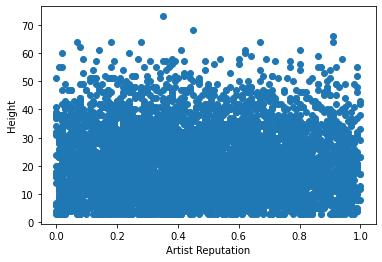

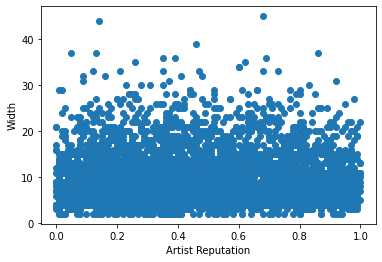

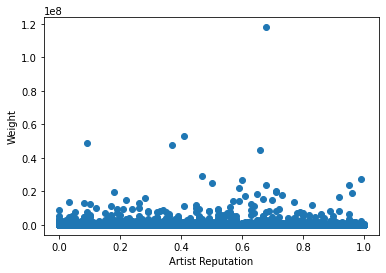

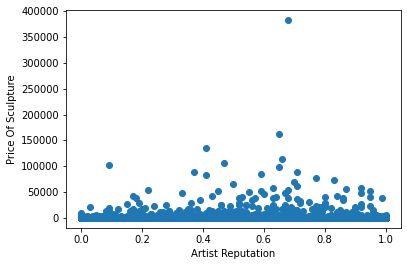

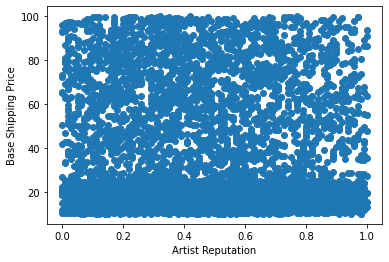

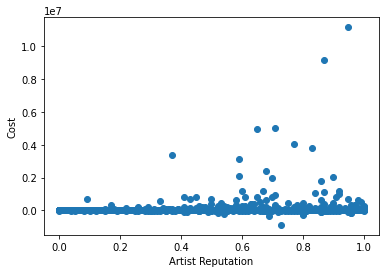

 14%|█▍        | 1/7 [00:00<00:05,  1.02it/s]

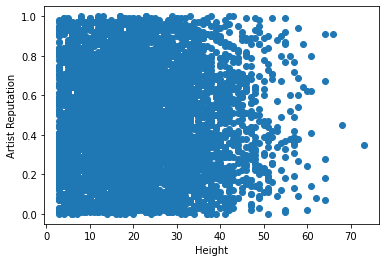

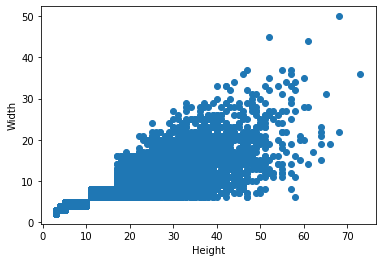

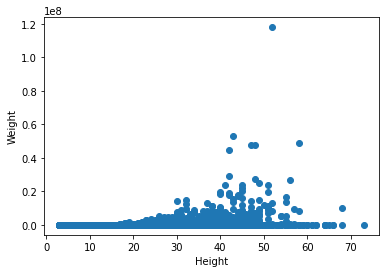

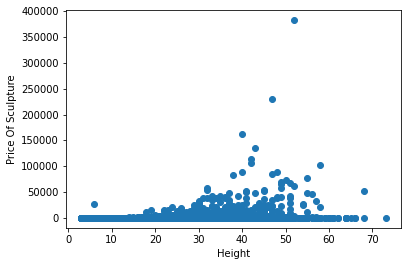

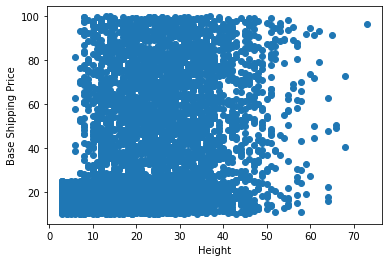

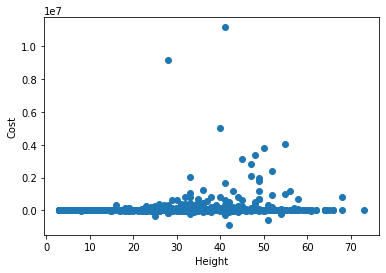

 29%|██▊       | 2/7 [00:01<00:04,  1.01it/s]

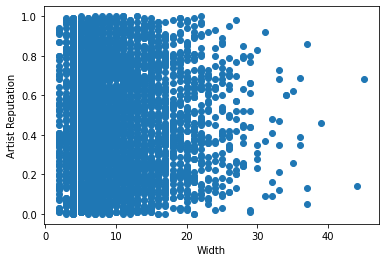

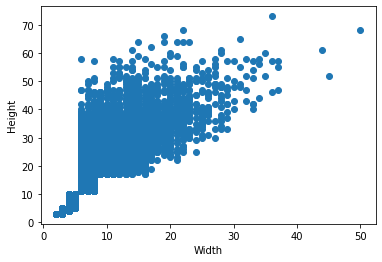

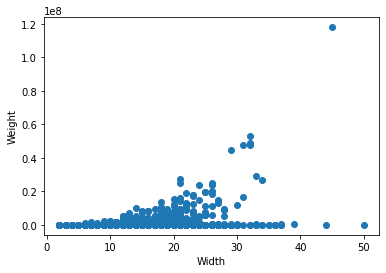

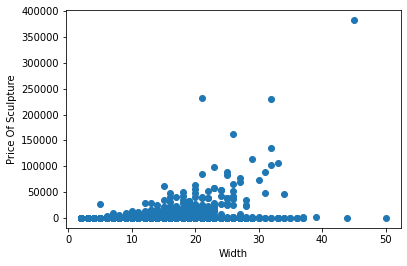

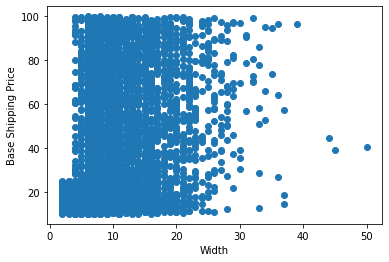

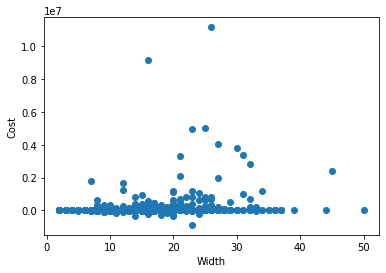

 43%|████▎     | 3/7 [00:03<00:04,  1.05s/it]

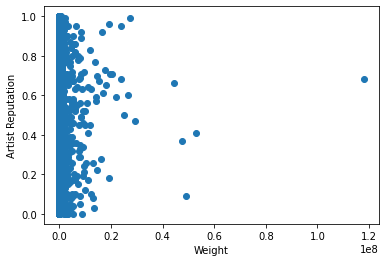

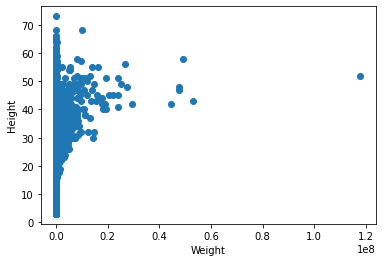

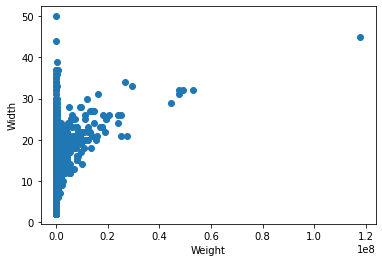

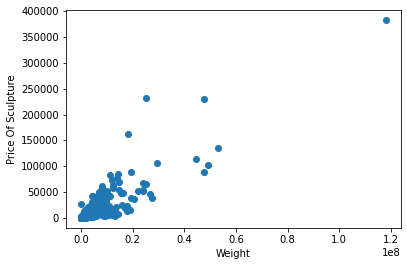

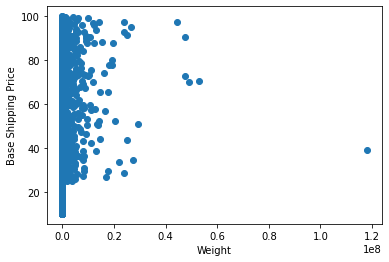

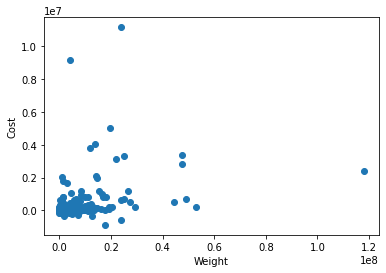

 57%|█████▋    | 4/7 [00:04<00:03,  1.03s/it]

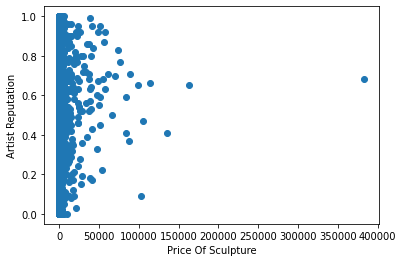

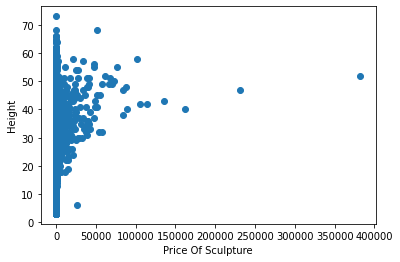

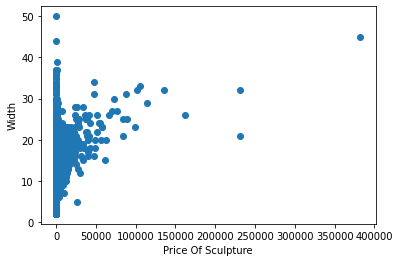

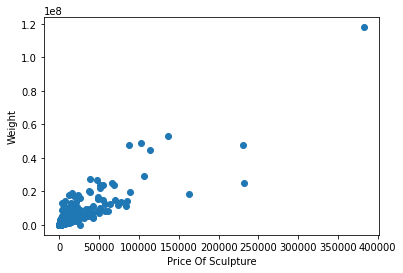

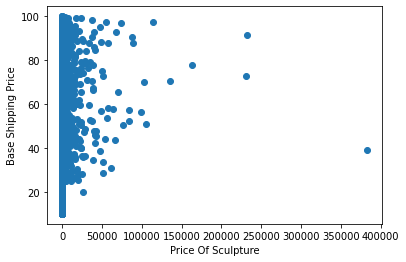

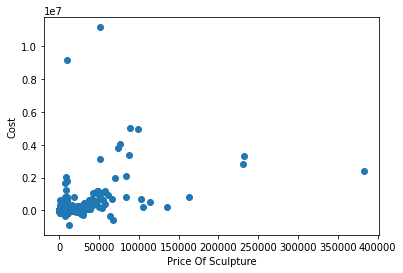

 71%|███████▏  | 5/7 [00:05<00:02,  1.07s/it]

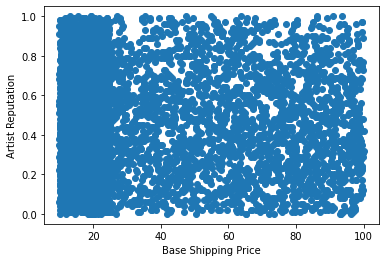

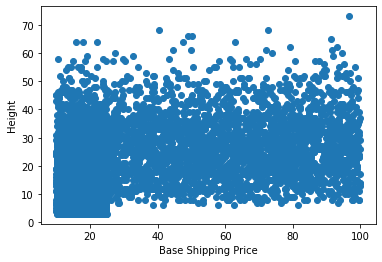

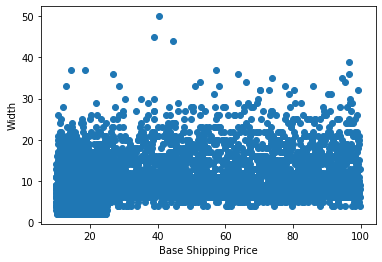

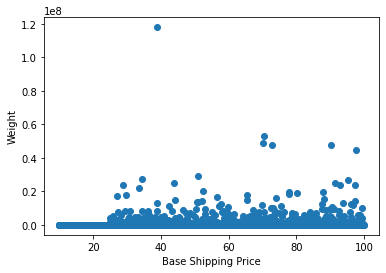

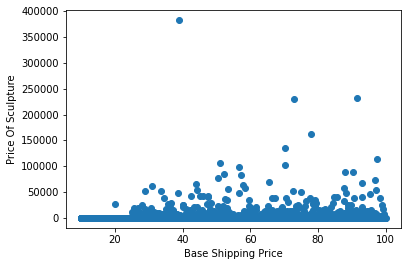

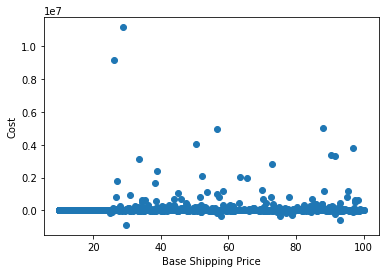

 86%|████████▌ | 6/7 [00:06<00:01,  1.08s/it]

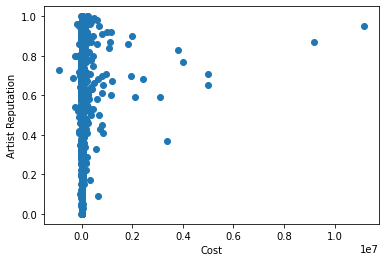

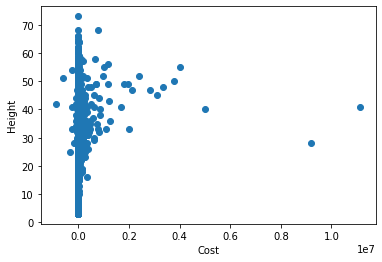

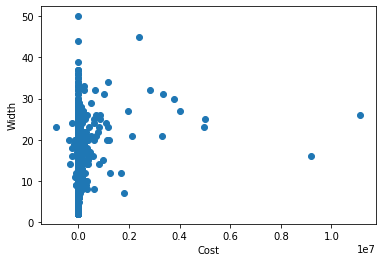

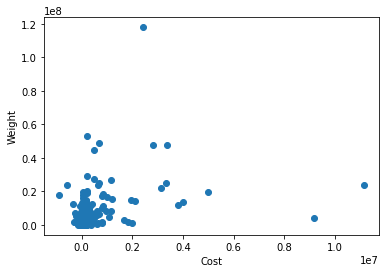

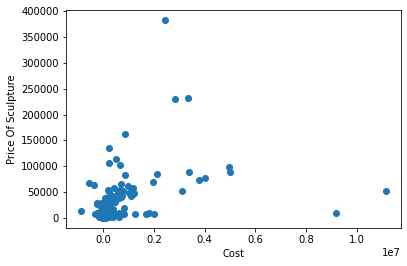

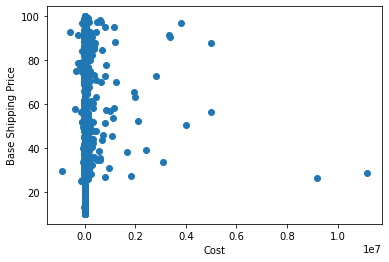

100%|██████████| 7/7 [00:07<00:00,  1.07s/it]


In [ ]:
# Using matplotlib 
def plot_scatter(x, y):
  plt.figure()
  plt.xlabel(x)
  plt.ylabel(y)
  plt.scatter(train_data[x], train_data[y])
  plt.show()





# Loop through the different columns 
for i in tqdm(var_list):
    for j in var_list:
        if i != j:
            plot_scatter(i, j)



From above scatter plot

1. Increase in value on Width axis results in increase of values on Height axis. That is they are positively correlated.

2. Increase in value on Weight axis results in increase of values on Price Of Sculpture and Cost axis. Weight and Price Of Sculpture are strongly correlated , Weight and Cost are weakly correlated.

# Histogram



1. A histogram is an approximate representation of the distribution of numerical data.

2. To construct a histogram, the first step is to "bin" (or "bucket") the range of values—that is, divide the entire range of values into a series of intervals—and then count how many values fall into each interval.

3. The words used to describe the patterns in a histogram are: "symmetric", "skewed left" or "right", "unimodal", "bimodal" or "multimodal".


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0c38a92510>,
      dtype=object)

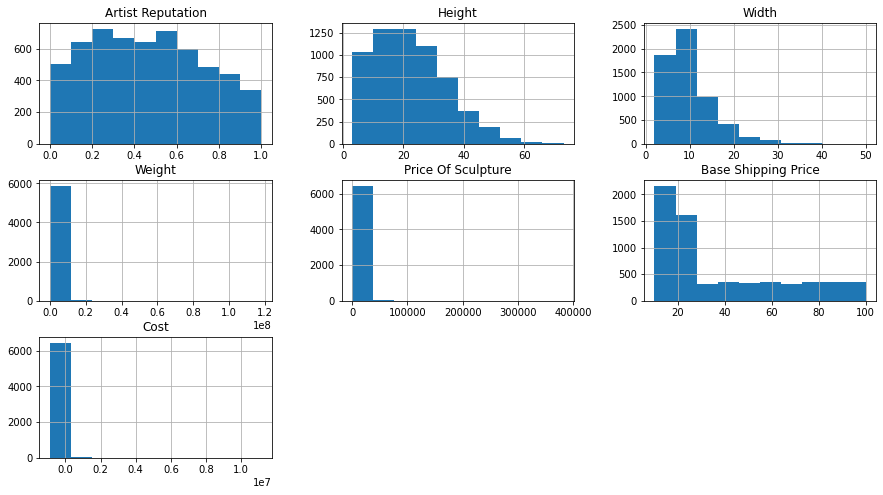

In [ ]:
# Using pandas 
train_data.hist(figsize=(15, 8))

From the above histogram

1. Artist Reputation data distribution is symmetric.

2. Height data distribution is skewed left.

3. Width data distribution is skewed left.

4. Weight data distribution is skewed left.

5. Price Of Sculpture data distribution is skewed left.

6. Base Shipping Price data distribution is skewed left.

3. Cost data distribution is skewed left.


In [ ]:
train_data.columns

Index(['Artist Reputation', 'Height', 'Width', 'Weight', 'Material',
       'Price Of Sculpture', 'Base Shipping Price', 'International',
       'Express Shipment', 'Installation Included', 'Transport', 'Fragile',
       'Customer Information', 'Remote Location', 'Scheduled Date',
       'Delivery Date', 'Customer Location', 'Cost'],
      dtype='object')

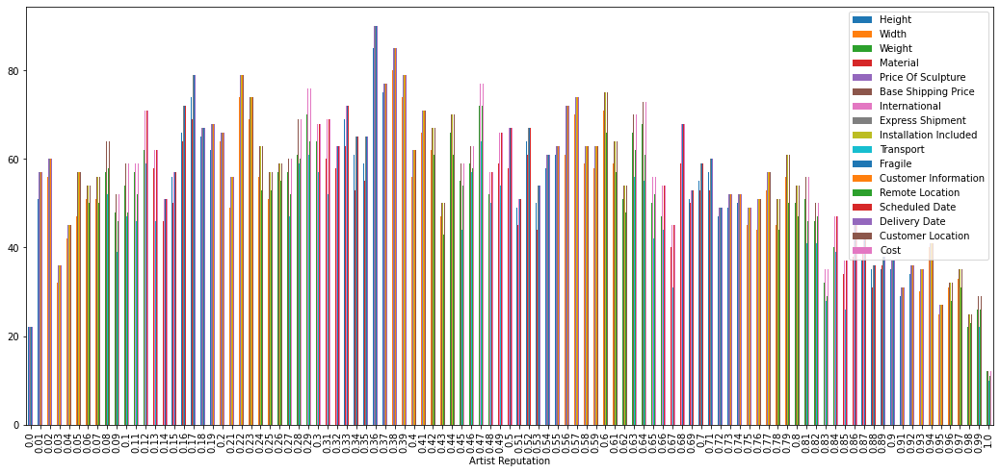

In [ ]:
train_data.groupby('Artist Reputation').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each value of Artist Reputation is distributed unequally.
2. But for overall data distribution of Artist Reputation is symmetrical

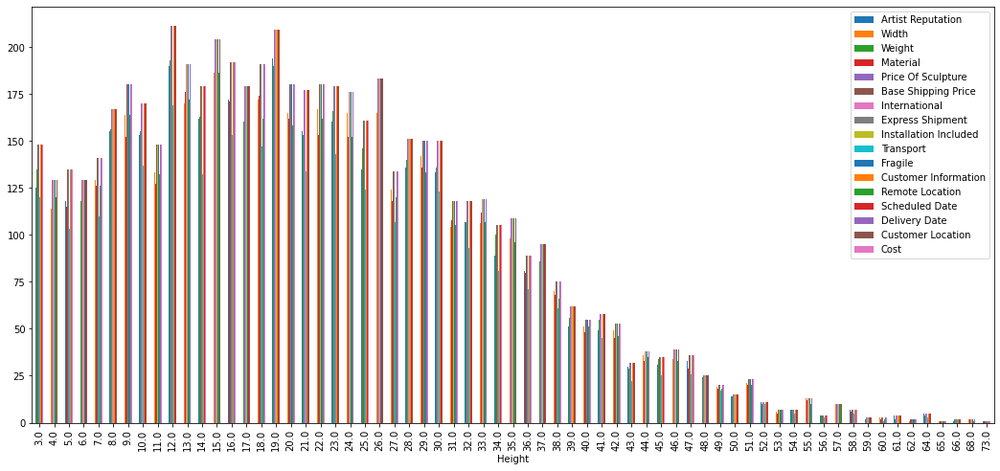

In [ ]:
train_data.groupby('Height').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each value of Height is distributed unequally.
2. But for overall data distribution of Height is skewed left.

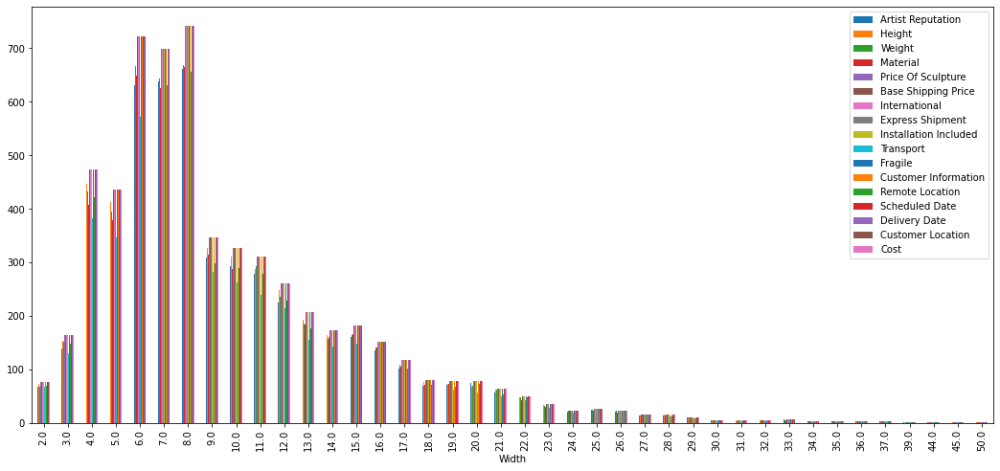

In [ ]:
train_data.groupby('Width').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each value of Width is distributed unequally.
2. But for overall data distribution of Width is skewed left.

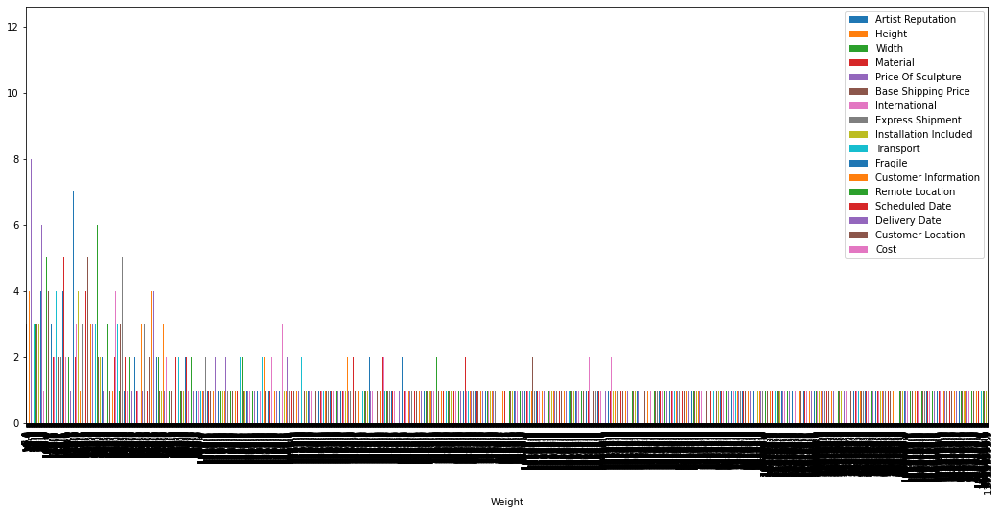

In [ ]:
train_data.groupby('Weight').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each value of Weight is distributed unequally.
2. But for overall data distribution of Weight is skewed left.

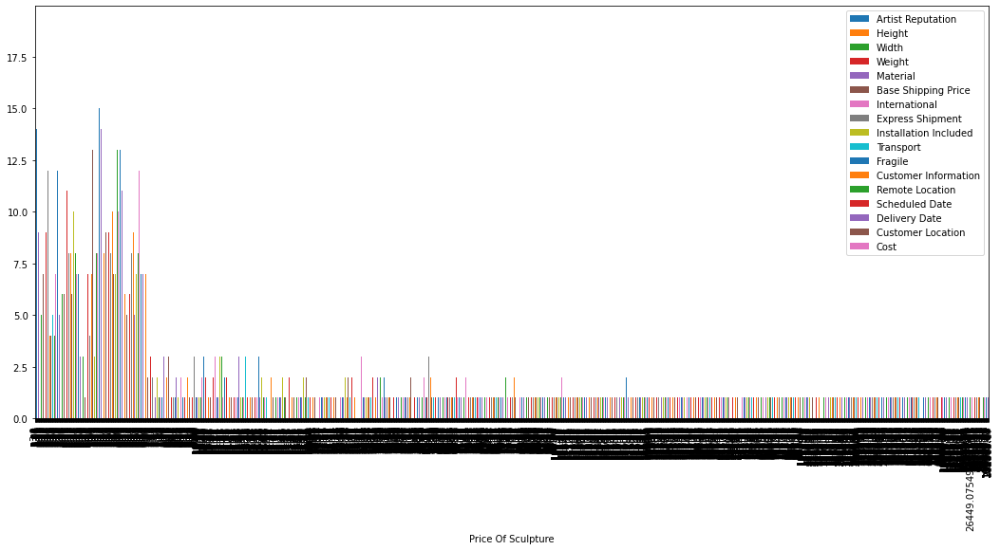

In [ ]:
train_data.groupby('Price Of Sculpture').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each value of Price Of Sculpture is distributed unequally.
2. But for overall data distribution of Price Of Sculpture is skewed left.

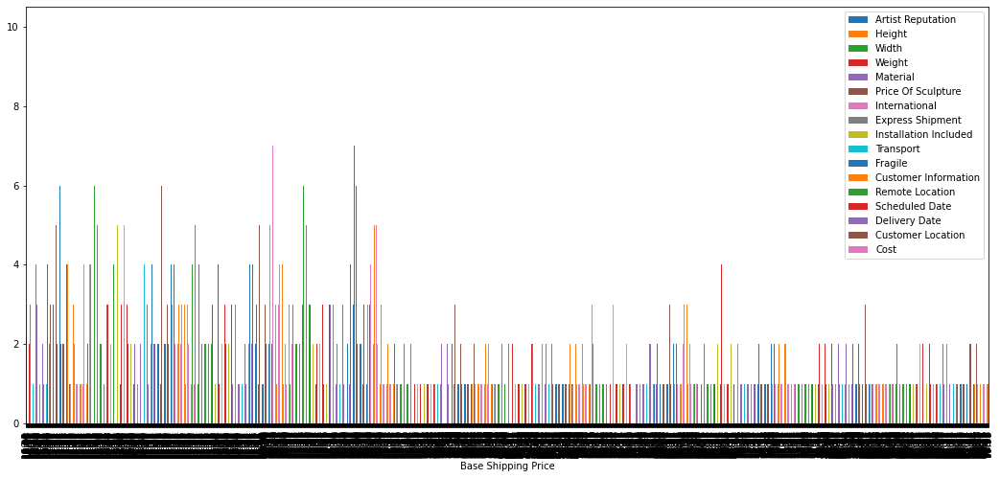

In [ ]:
train_data.groupby('Base Shipping Price').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each Base Shipping Price value is distributed unequally.
2. Base Shipping Price is skewed left.

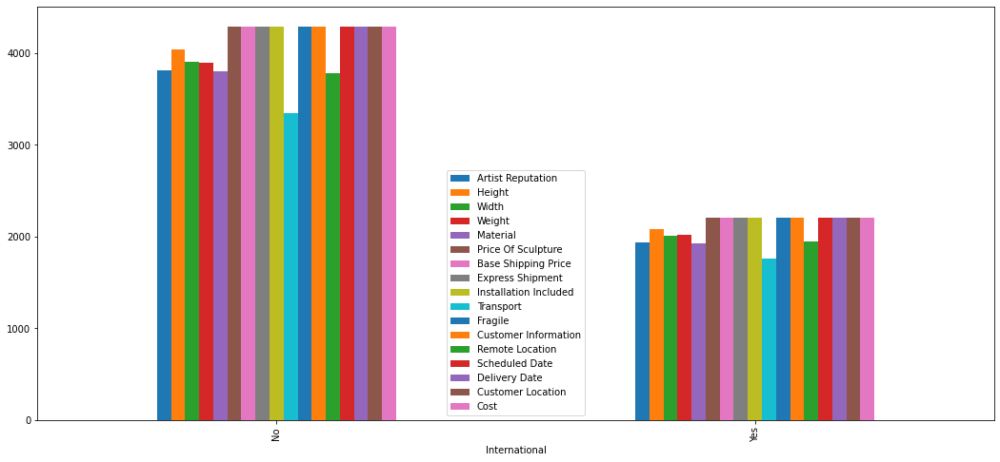

In [ ]:
train_data.groupby('International').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. Number of varibales having "No" as value of international is almost double the number of varibales having "Yes" value.

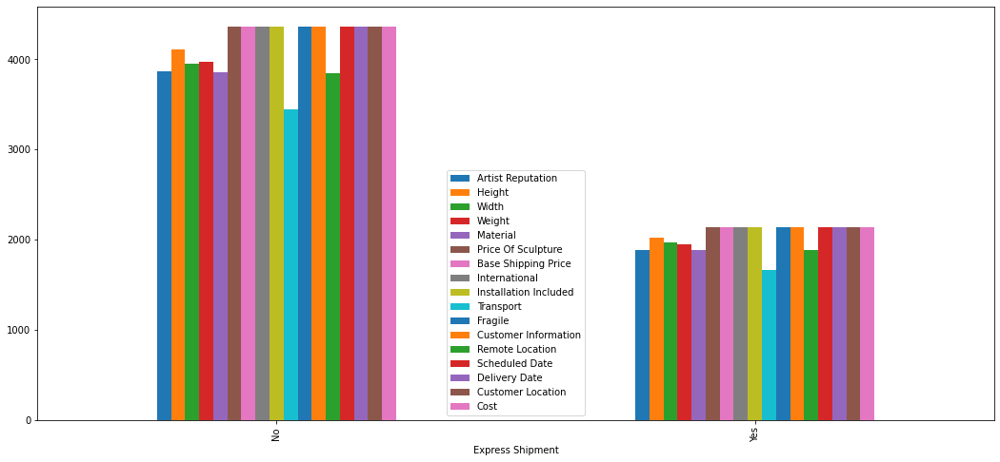

In [ ]:
train_data.groupby('Express Shipment').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. Number of variables having "No" as value Express Shipment is almost double the number of variables having "Yes" value.

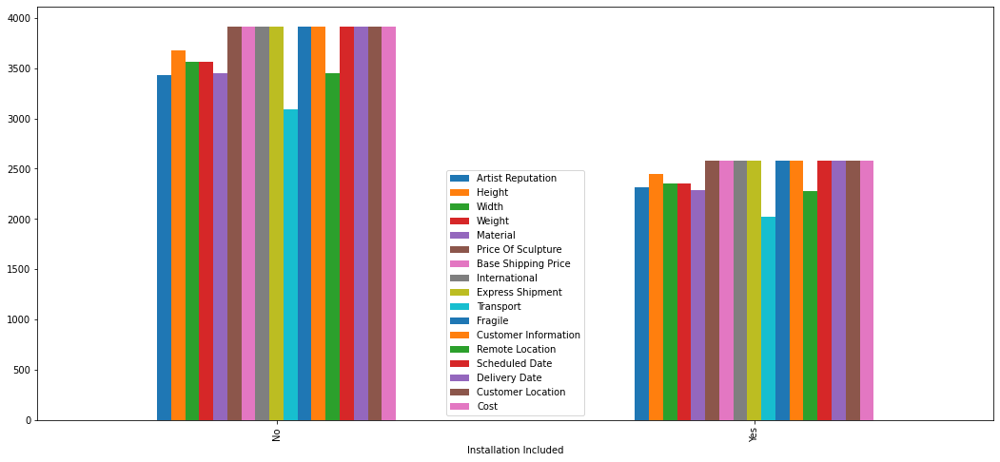

In [ ]:
train_data.groupby('Installation Included').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. Number of variables having "No" as value international is almost double the number of variables having "Yes" value.

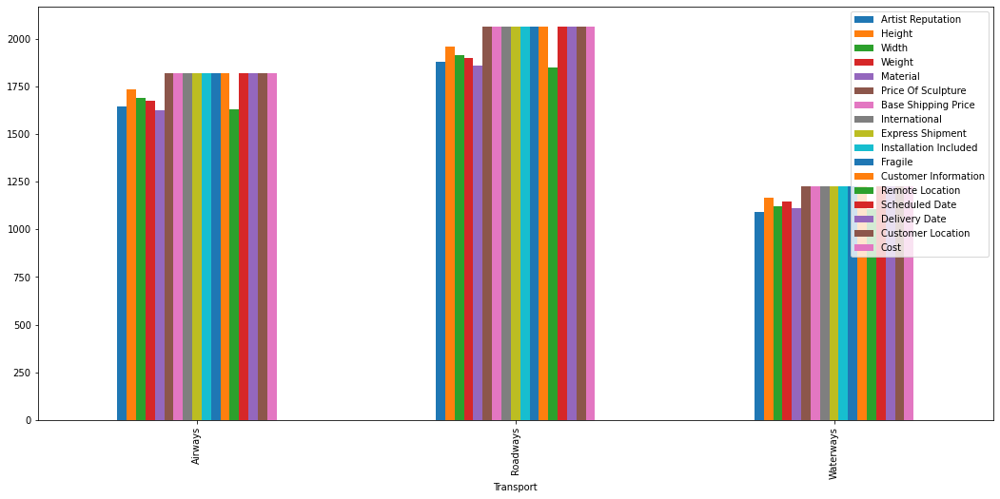

In [ ]:
train_data.groupby('Transport').count().plot(kind='bar', figsize=(18, 8))

1. Number of variables having value as Roadways is greater than Number of variables having value Airways
2. Number of variables having value Waterways is half as compared to those of Airways and Roadways

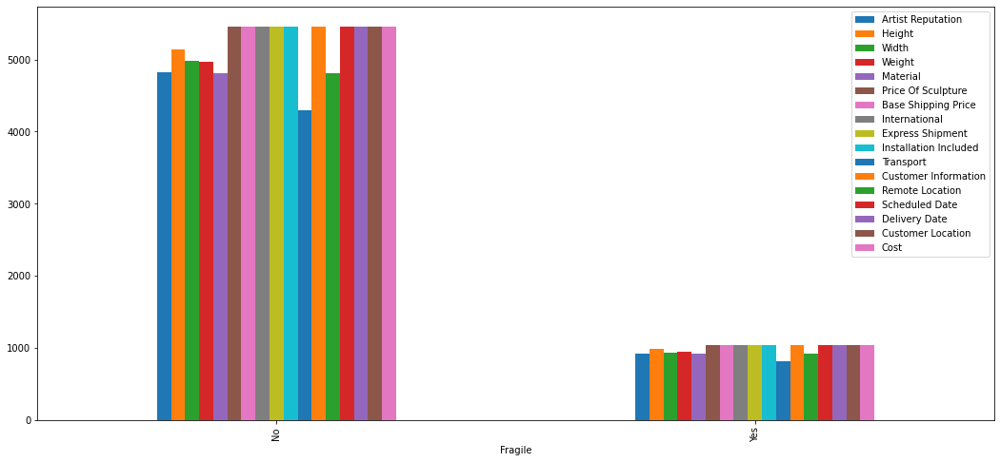

In [ ]:
train_data.groupby('Fragile').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. 10% of the Sculptures are Fragile

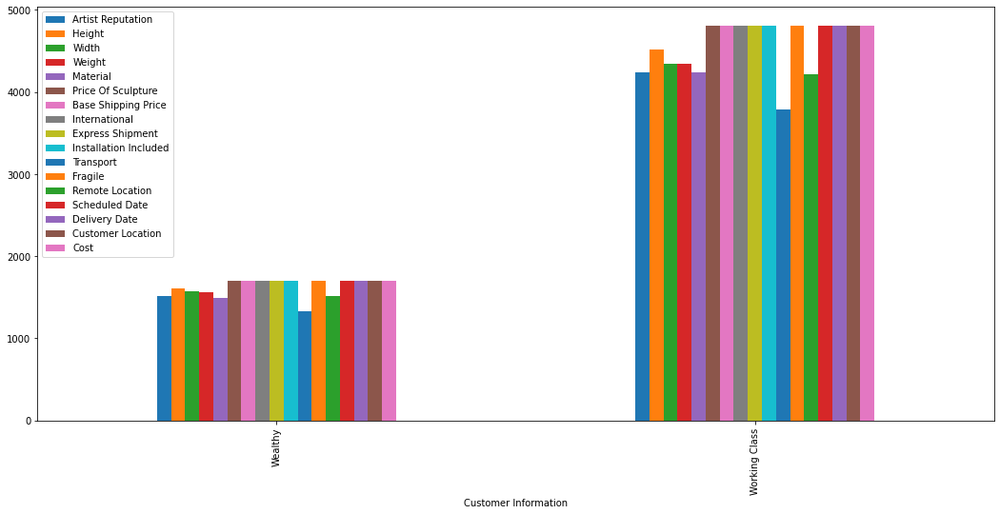

In [ ]:
train_data.groupby('Customer Information').count().plot(kind='bar', figsize=(18, 8))

from above graph

Most of the customers blongs to Working class.

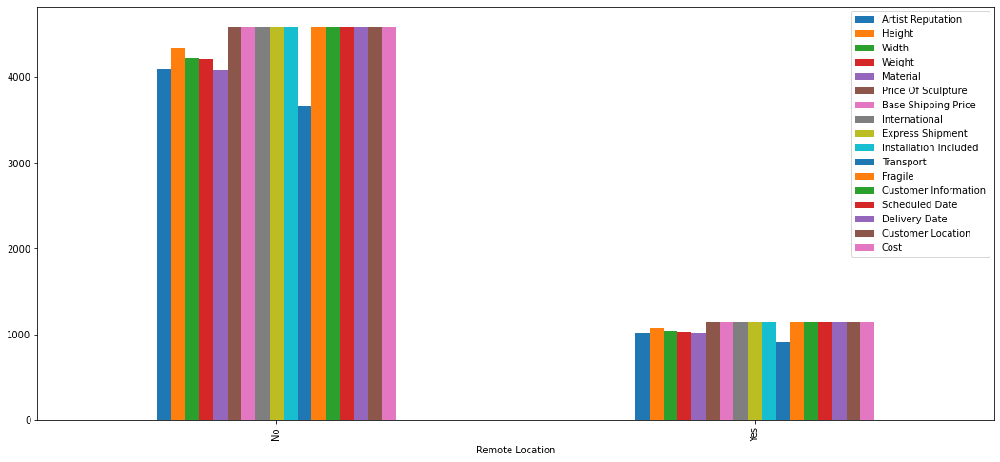

In [ ]:
train_data.groupby('Remote Location').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. Number sample having remote location is double the number of sample which are not.

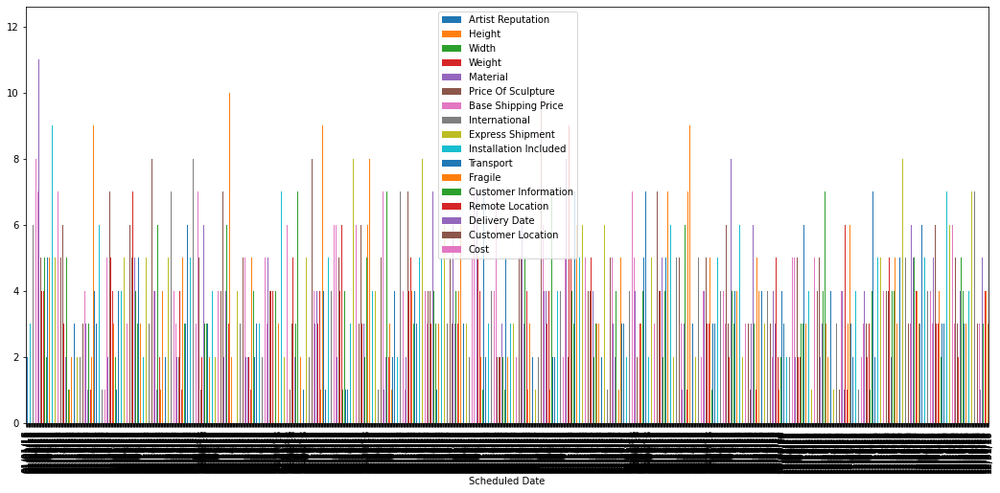

In [ ]:
train_data.groupby('Scheduled Date').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each Scheduled Date is distributed  unequally.

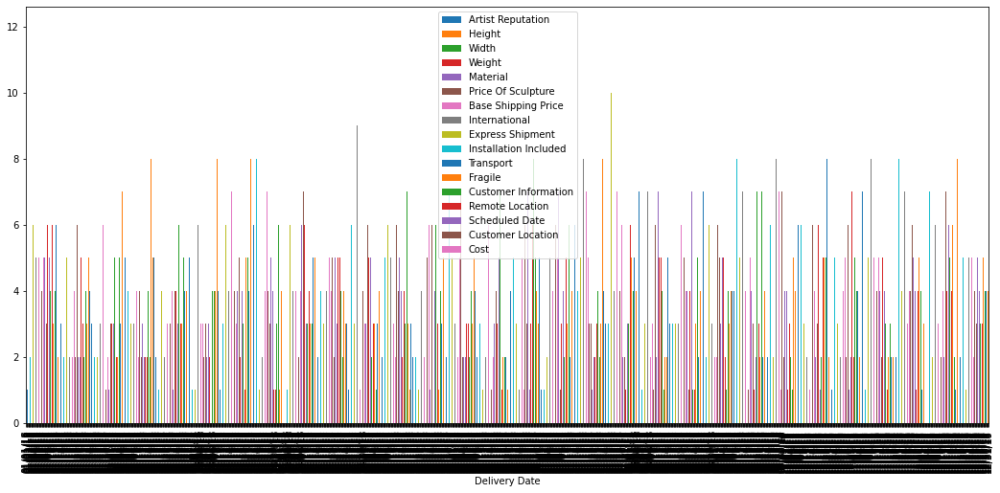

In [ ]:
train_data.groupby('Delivery Date').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each Delivery Date is distributed unequally.

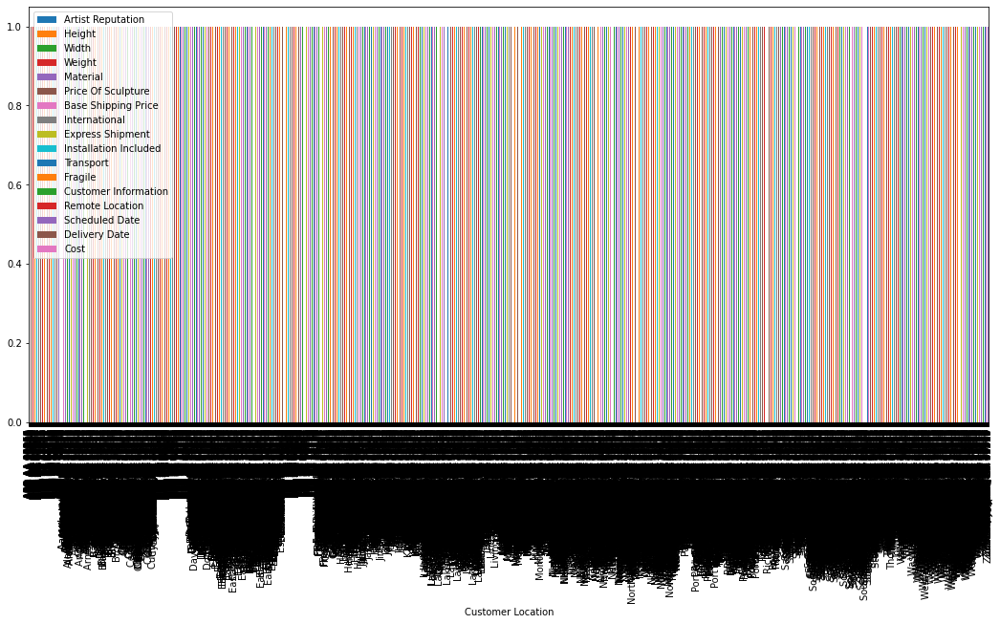

In [ ]:
train_data.groupby('Customer Location').count().plot(kind='bar', figsize=(18, 8))

from above graph:
1. All data for each customer locaton value is distributed equally.

# Box Plot

A boxplot is a standardized way of displaying the dataset based on a five-number summary:

    1. Minimum (Q0 or 0th percentile): the lowest data point excluding any outliers.

    2. Maximum (Q4 or 100th percentile): the largest data point excluding any outliers.

    3. Median (Q2 or 50th percentile): the middle value of the dataset.

    4. First quartile (Q1 or 25th percentile): also known as the lower quartile qn(0.25), is the median of the lower half of the dataset.

    5. Third quartile (Q3 or 75th percentile): also known as the upper quartile qn(0.75), is the median of the upper half of the dataset


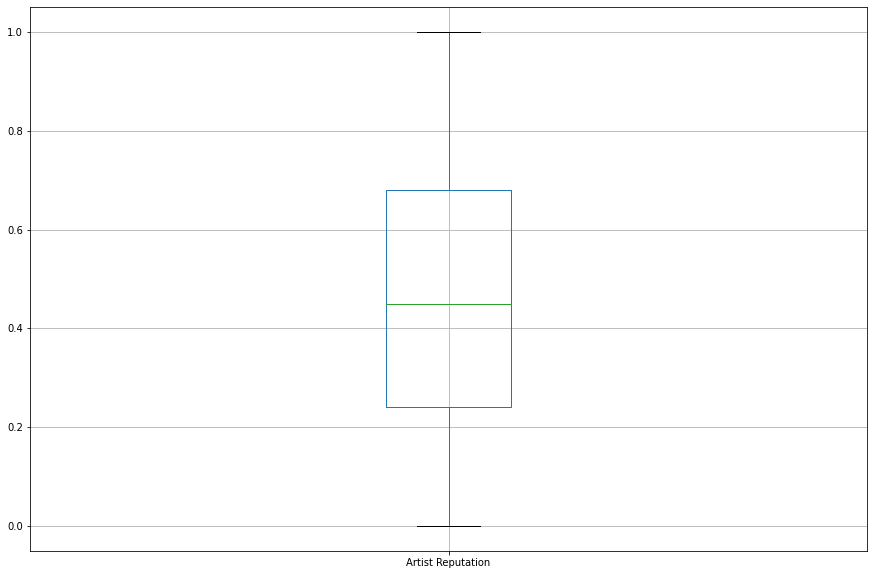

In [ ]:
# Using pandas 
train_data.boxplot(column='Artist Reputation', figsize=(15, 10))

from above box plot graph:

- Artist reputation
  1. 25% of Artist reputation have value between range 0 to 0.24.
  2. 25% of Artist reputation have value between range 0.24 to 0.45.
  3. 25% of Artist reputation have value between range 0.45 to 0.68.
  4. 25% of Artist reputation have value between range 0.68 to 1.


- The mean Artist Reputation is around 0.45

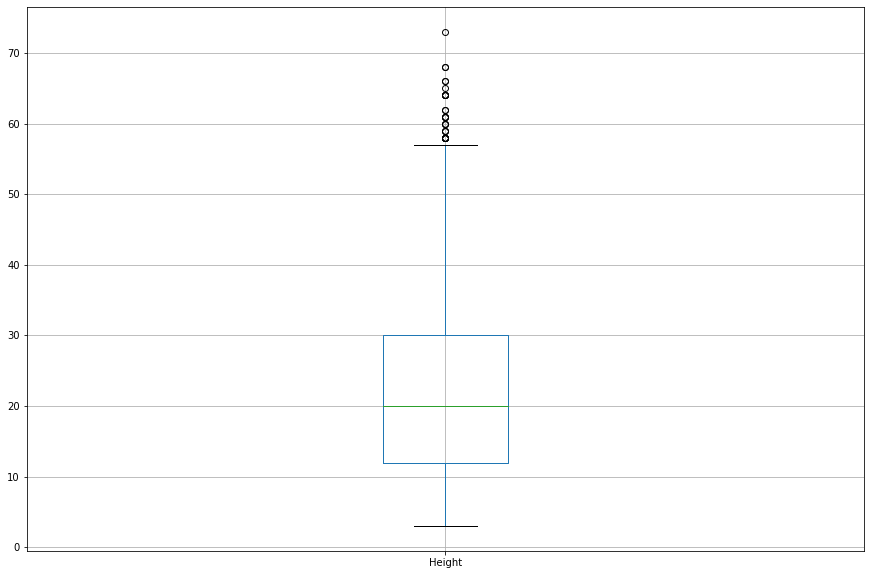

In [ ]:
# Using pandas 
train_data.boxplot(column='Height', figsize=(15, 10))

from above box plot graph:

- Height
  1. 25% of Heigth have value between range 3 to 12.
  2. 25% of Artist reputation have value between range 12 to 20.
  3. 25% of Artist reputation have value between range 20 to 30.
  4. 25% of Artist reputation have value between range 30 to 73.


- The mean Height is around 20.

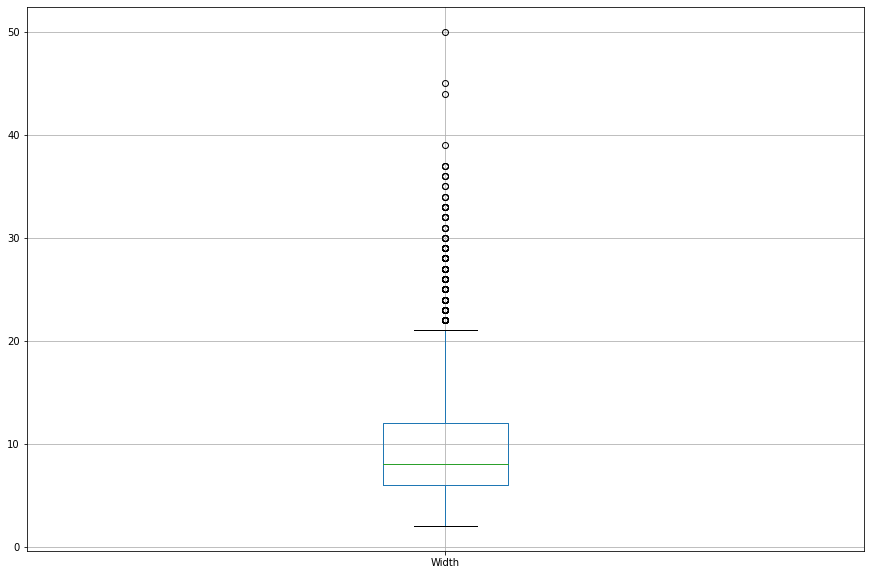

In [ ]:
# Using pandas 
train_data.boxplot(column='Width', figsize=(15, 10))

from above box plot graph:

- Width
  1. less than 25% of Width have value between range 2 to 6.
  2. less 50% of Width have value between range 2 to 8.
  3. less than 75% of Width have value between range 2 to 12.
  4. More than 25% Width have value between range 12 to 22.
  5. very few values of width are in range between 22 to 50. that is these are outliers


- The mean Width is around 10

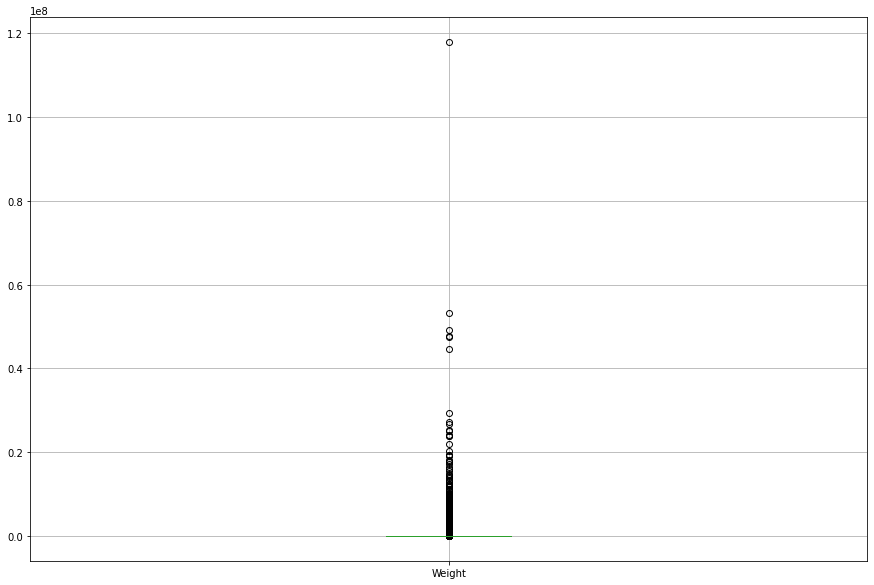

In [ ]:
# Using pandas 
train_data.boxplot(column='Weight', figsize=(15, 10))

from above box plot graph:

- Height
  1. less than Height of Width have value between range 2 to 6.
  2. less 50% of Height have value between range 2 to 8.
  3. less than 75% of Height have value between range 2 to 12.
  4. More than 25% Height have value between range 12 to 22.
  5. very few values of Height are in range between 22 to 50. that is these are outliers


- The mean Height is around 10

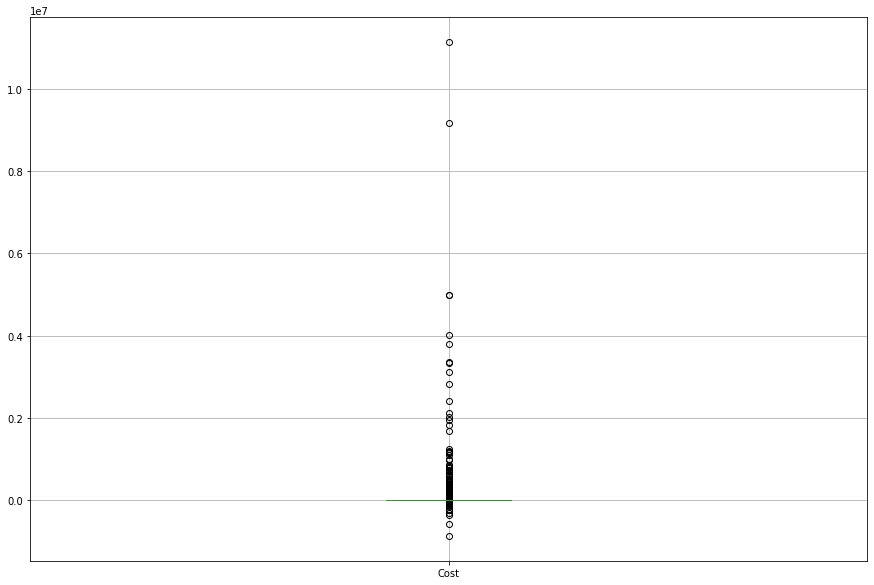

In [ ]:
# Using pandas 
train_data.boxplot(column='Cost', figsize=(15, 10))

from above box plot graph:

- Cost
  1. Most of the Cost value is around 0
  2. very few values are above 0.2. that is they are outliers

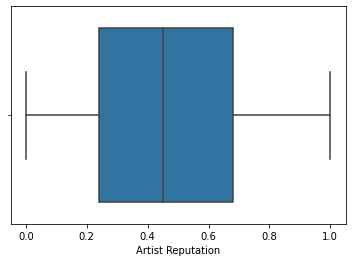

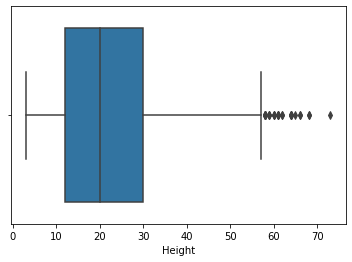

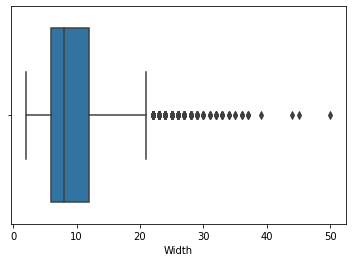

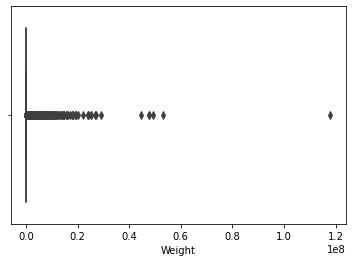

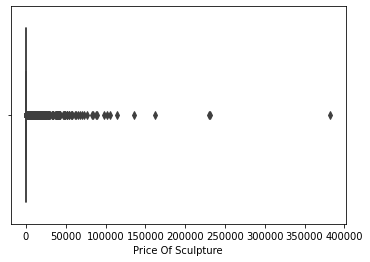

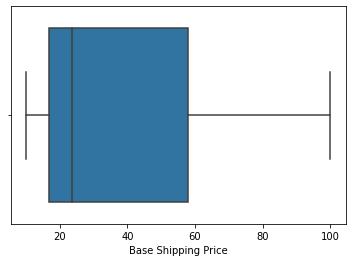

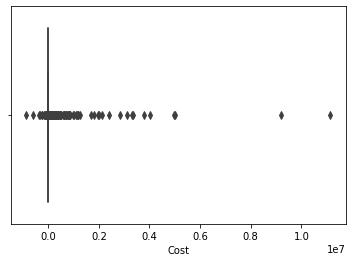

In [ ]:
# Using seaborn
for x in train_data:
  sns.boxplot(train_data[x])
  plt.show()


# Violin Plot



1. A violin plot is a method of plotting numeric data.

1. Violin plots are similar to box plots, except that they also show the probability density of the data at different values, usually smoothed by a kernel density estimator.

3. It has:

    1. Median (a white dot on the violin plot)
    2. Interquartile range (the black bar in the center of violin)
    3. The lower/upper adjacent values (the black lines stretched from the bar) — defined as first quartile — 1.5 IQR and third quartile + 1.5 IQR respectively.

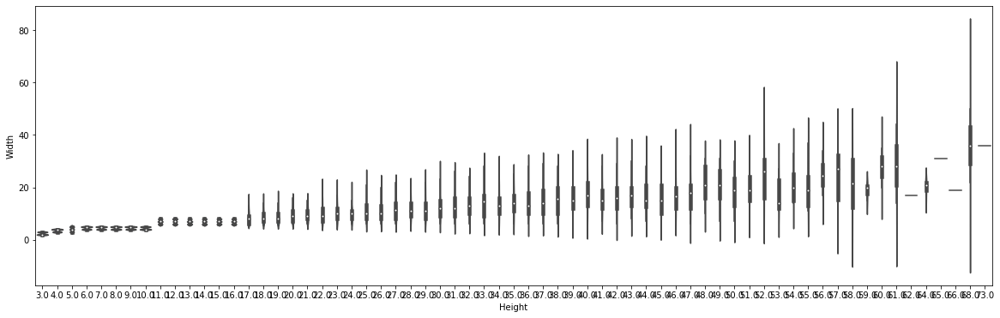

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Height', y='Width', data=train_data, palette='rainbow')

from above violin plot:
1. The distribution between lower adjacent value and upper adjacent value is almost symmetrical.
2. also there is higher observation probability at the between first quartile and third quartile.
3. The Width range is increasing as we move right on the axis of Height

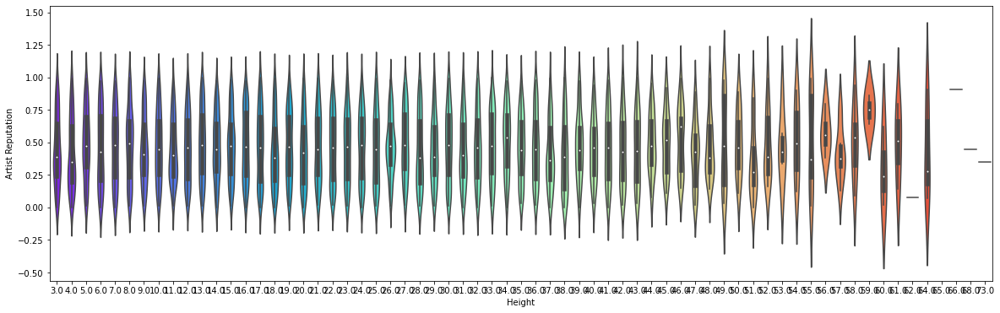

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Height', y='Artist Reputation', data=train_data, palette='rainbow')

from above violin plot:
1. The distribution between lower adjacent value and upper adjacent value is almost symmetrical.
2. also there is higher observation probability at the between first quartile and third quartile.

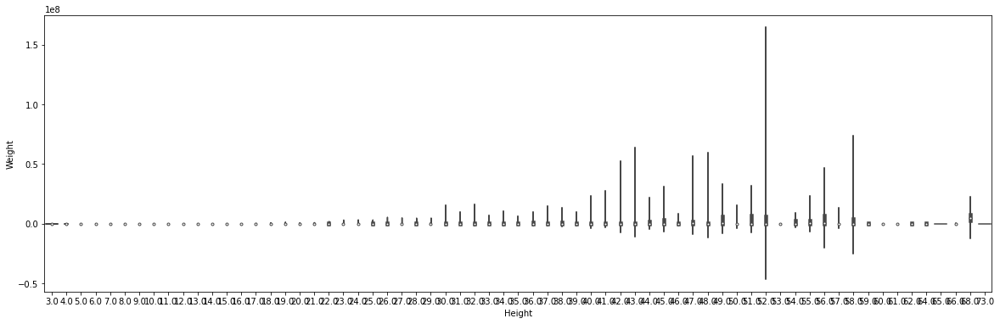

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Height', y='Weight', data=train_data, palette='rainbow')

from above violin plot:
1. The distribution between lower adjacent value and upper adjacent value is almost symmetrical.
2. also there is higher observation probability at the between first quartile and third quartile.
3. Weight distribution for all values of height is simmilar.
4. The Weight range is increasing and then decreases as we move right on the axis of Height

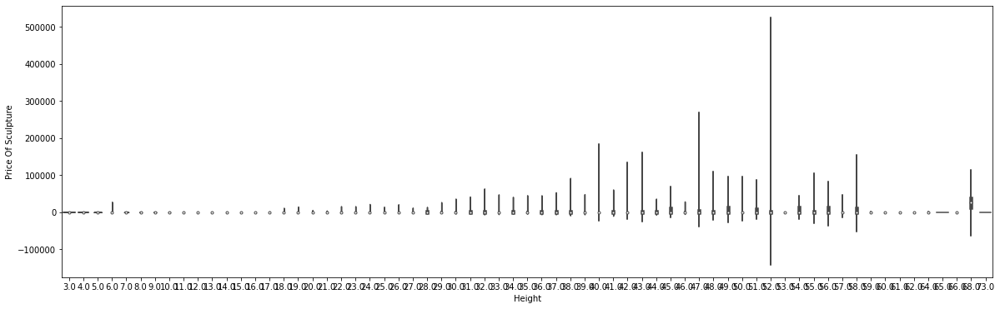

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Height', y='Price Of Sculpture', data=train_data, palette='rainbow')

from above violin plot:
1. The distribution between lower adjacent value and upper adjacent value is almost symmetrical.
2. also there is higher observation probability at the between first quartile and third quartile.
3. Price Of Sculpture distribution for all values of height is simmilar.
4. The Price Of Sculpture range is increasing and then decreases as we move right on the axis of Height
5. There is very weak correlataion between Price Of Sculpture and Height.

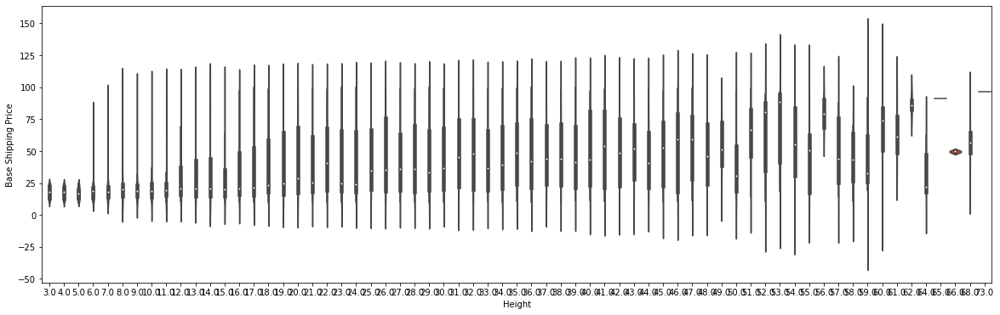

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Height', y='Base Shipping Price', data=train_data, palette='rainbow')

from above violin plot:
1. The distribution between lower adjacent value and upper adjacent value is unsymmetrical.

2. Also there is higher observation probability at the between first quartile and third quartile.

3. Base Shipping Price distribution for all values of height is not simmilar.

4. The Base Shipping Price range is increasing and then decreases as we move right on the axis of Height

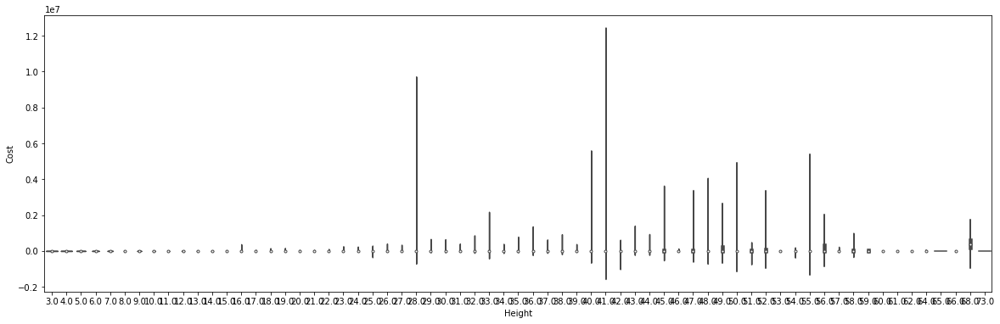

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Height', y='Cost', data=train_data, palette='rainbow')

from above violin plot:
1. The distribution between lower adjacent value and upper adjacent value is almost symmetrical.
2. also there is higher observation probability at the between first quartile and third quartile.
3. Cost distribution for all values of height is simmilar.
4. The Cost range is increasing and then decreases as we move right on the axis of Height

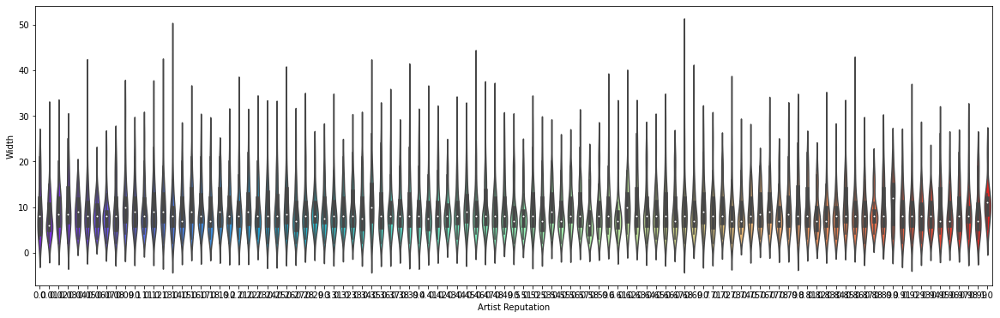

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Artist Reputation', y='Width', data=train_data, palette='rainbow')

from above violin plot:

1. Width distribution for all values of Artist Reputation is simmilar.

2. The Width and Artist Reputation have no correlation

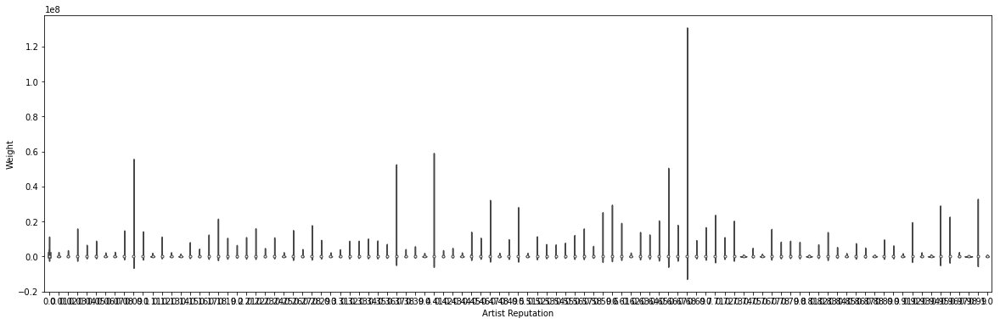

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Artist Reputation', y='Weight', data=train_data, palette='rainbow')

from above violin plot:

1. Weight distribution for all values of Artist Reputation is simmilar.

2. The Weight and Artist Reputation have no correlation

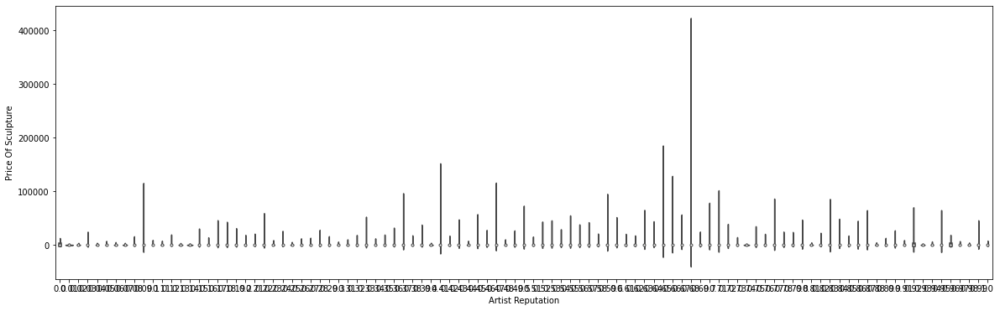

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Artist Reputation', y='Price Of Sculpture', data=train_data, palette='rainbow')

from above violin plot:

1. Price Of Sculpture distribution for all values of Artist Reputation is simmilar.

2. The Price Of Sculpture and Artist Reputation have no correlation

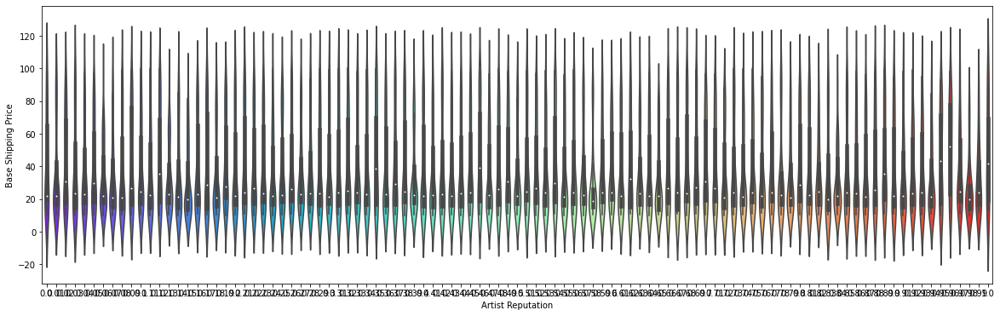

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Artist Reputation', y='Base Shipping Price', data=train_data, palette='rainbow')

from above violin plot:

1. Base Shipping Price distribution for all values of Artist Reputation is simmilar.

2. The Base Shipping Price and Artist Reputation have no correlation

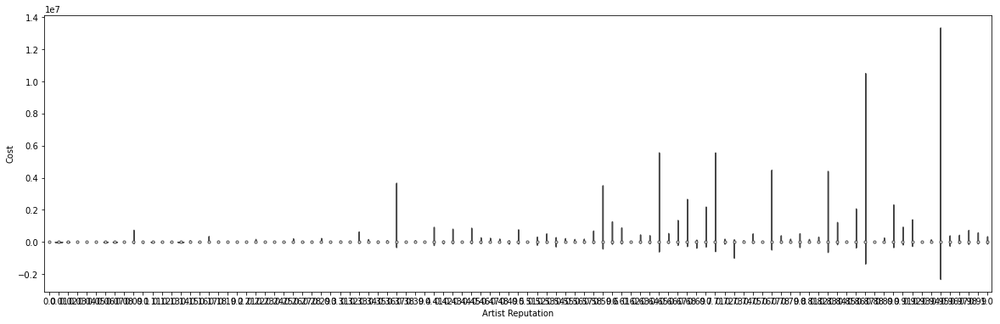

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Artist Reputation', y='Cost', data=train_data, palette='rainbow')

from above violin plot:

1. Cost distribution for all values of Artist Reputation is simmilar.

2. The Cost and Artist Reputation have no correlation

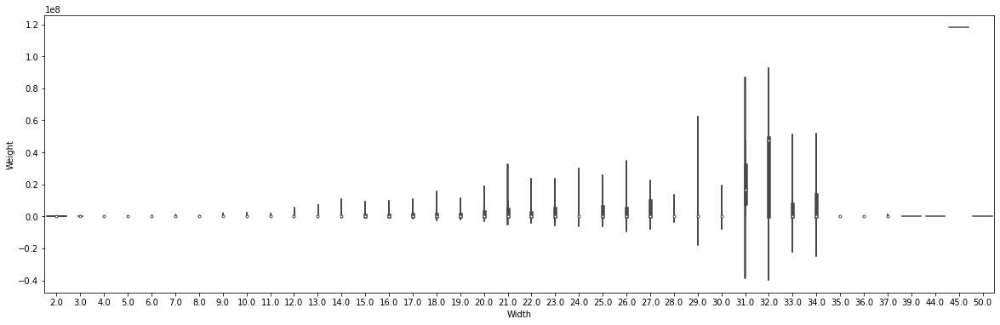

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Width', y='Weight', data=train_data, palette='rainbow')

from above violin plot:

The Weight and Width have very weak correlation

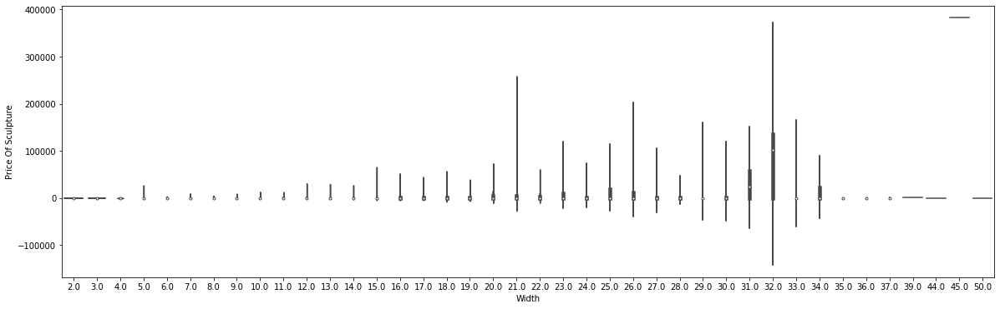

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Width',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above violin plot:

The Price Of Sculpture and Width have very weak correlation

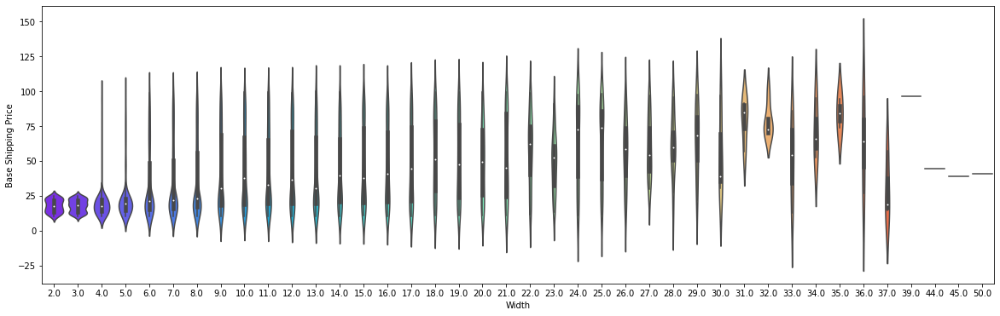

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Width',y="Base Shipping Price",data=train_data, palette='rainbow')

from above violin plot:

The Base shipping price and Width are weakly correlated

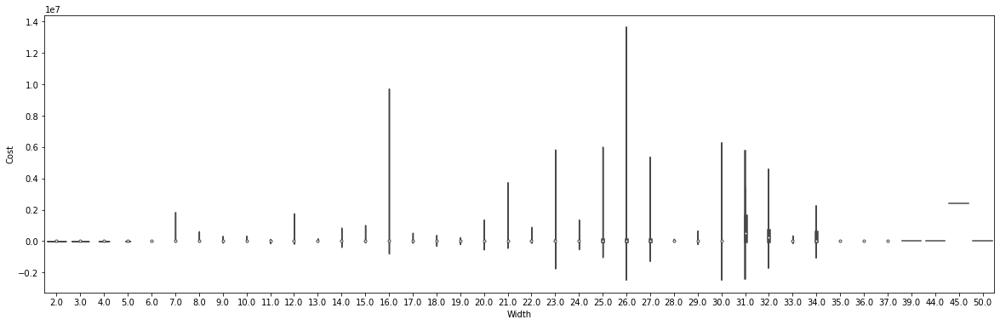

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Width',y="Cost",data=train_data, palette='rainbow')

from above violin plot:

The Cost and Width have no correlation

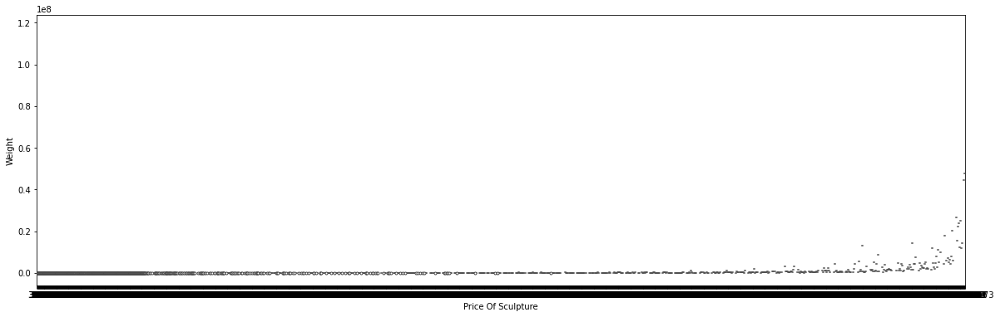

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Price Of Sculpture',y="Weight",data=train_data, palette='rainbow')

from above violin plot:

Values of cost is almost around zero for weight at the begining but starts to show high change in value for larger values of price of sculpture  

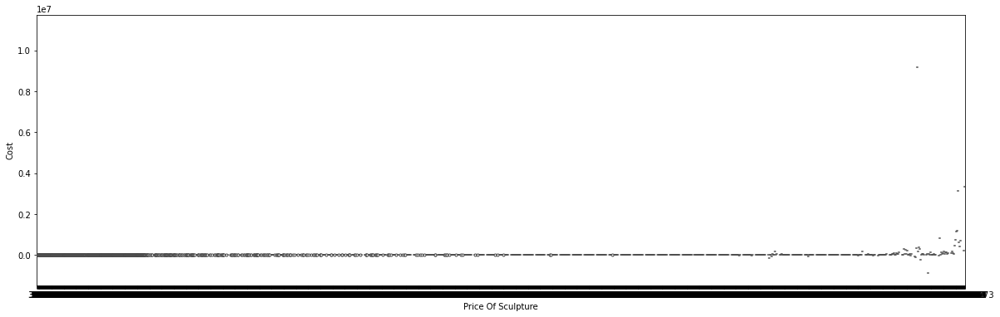

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Price Of Sculpture',y="Cost",data=train_data, palette='rainbow')

from above violine plot:
the highest priced scuplture have larger weight than low price sculpture.

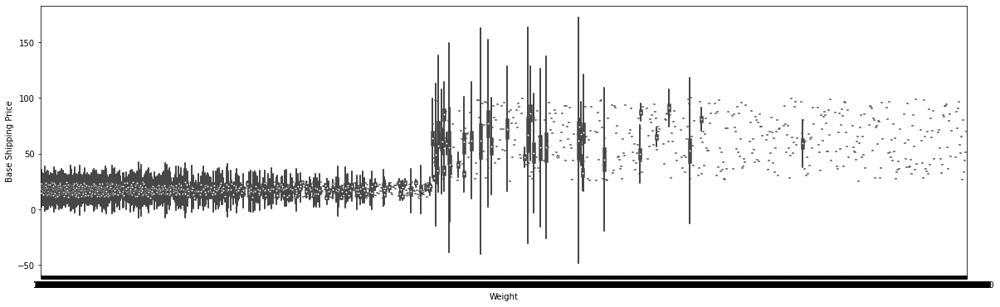

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Weight',y="Base Shipping Price",data=train_data, palette='rainbow')

from above violin plot:

The Base Shipping and Weight have very weak correlation

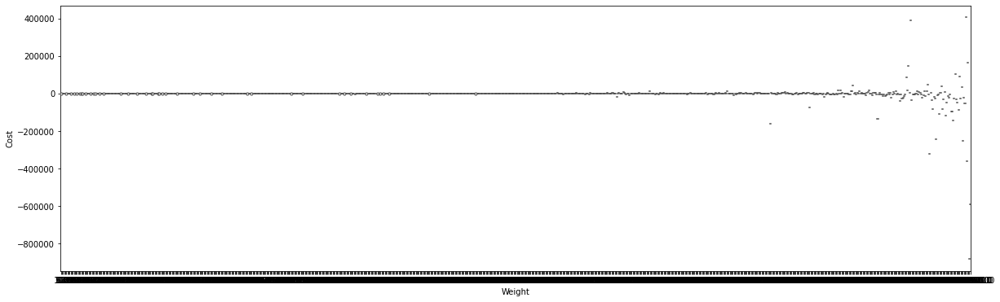

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Weight',y="Cost",data=train_data.iloc[1:1000], palette='rainbow')

from above violin plot:

Values of cost is almost around zero for weight at the begining but starts to show high change in value for larger values of weight  

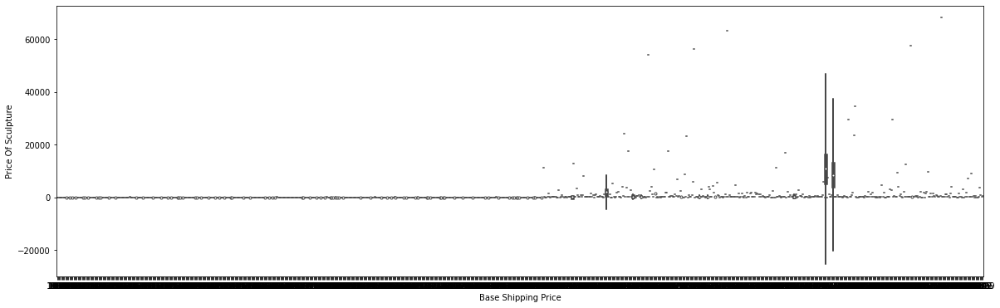

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Base Shipping Price',y="Price Of Sculpture",data=train_data.iloc[1:1000], palette='rainbow')

from above violin plot:

The Base Shipping and Price of Sculpture have no correlation

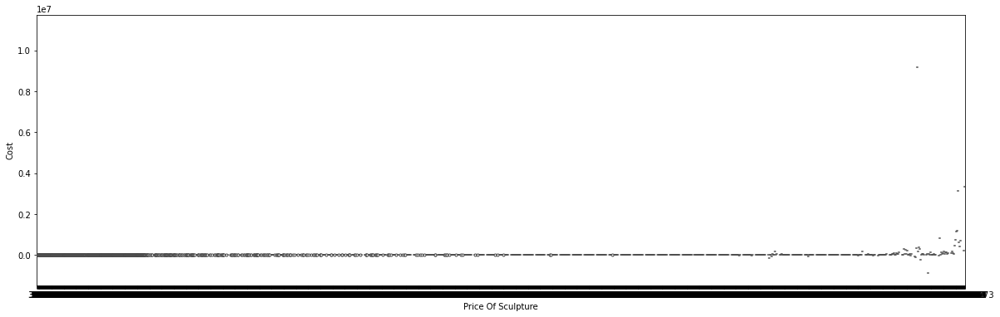

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Price Of Sculpture',y="Cost",data=train_data, palette='rainbow')

from above violin plot:

Values of cost is almost around zero for price of sculpture at the begining but starts to show high change in value for larger values of price of sculpture

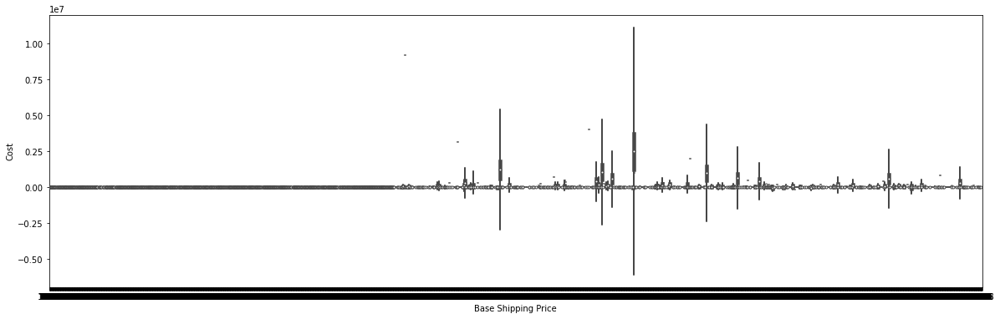

In [ ]:
plt.figure(figsize=(20,6))
sns.violinplot(x='Base Shipping Price',y="Cost",data=train_data, palette='rainbow')

from above violin plot:

Values of cost is almost around zero for Base Shipping Price at the begining but starts to show high change in value for larger values of Base Shipping Price.


# Boxenplot

1. The boxen plot, otherwise known as a Letter-value plot, is a box plot meant for large data sets (n > 10,000).

2. The Boxen plot is very similar to box plot, except for the fact that it plots different quartile values.

3. By plotting different quartile values, we are able to understand the shape of the distribution particularly in the head end and tail end.


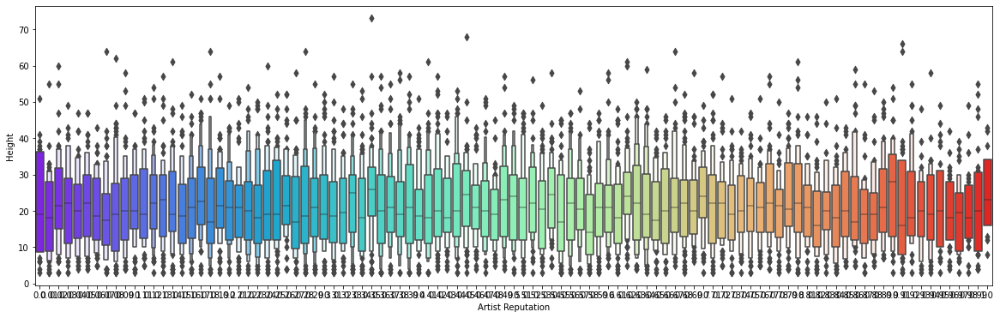

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Height",data=train_data, palette='rainbow')

from above boxen plot:
1. The distribution between lower adjacent value and upper adjacent value is symmetrical.
2. There is no relation between height and Artist Reputation

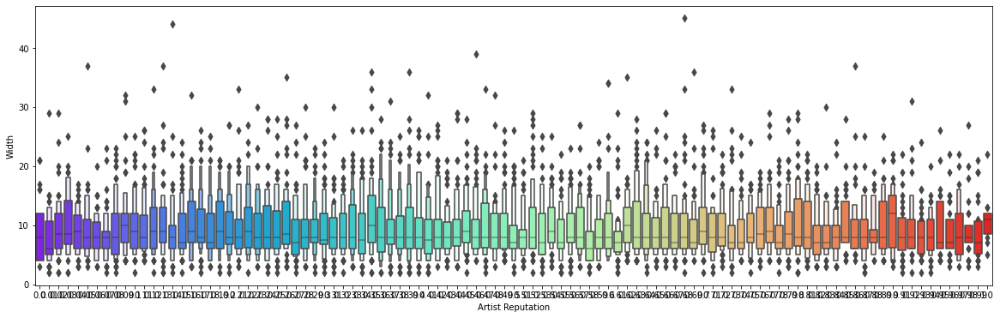

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Width",data=train_data, palette='rainbow')

from above boxen plot:
1. The distribution between lower adjacent value and upper adjacent value is symmetrical.
2. There is no relation between Width and Artist Reputation

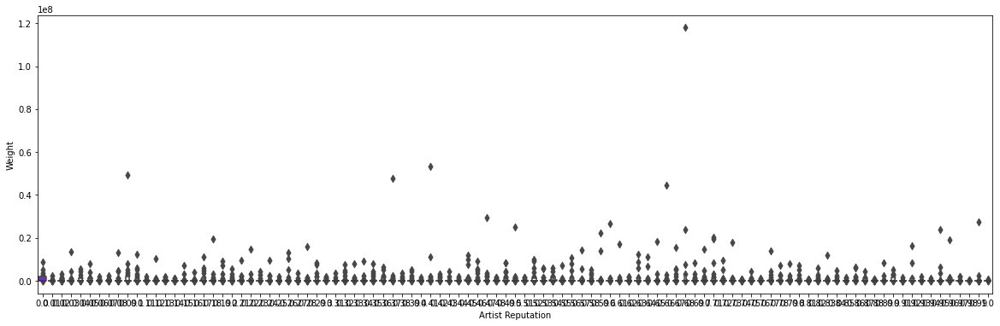

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Weight",data=train_data, palette='rainbow')

from above boxen plot:

values of weight are between 0.0 to 0.2 for most values of Artist reputation but there are some values above 0.2

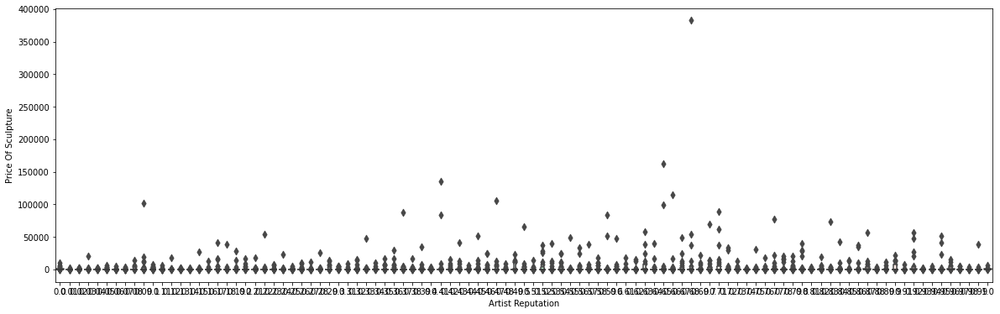

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above boxen plot:

values of price of sculpture are between 0.0 to 50000 for most values of Artist reputation but there are some values above 50000

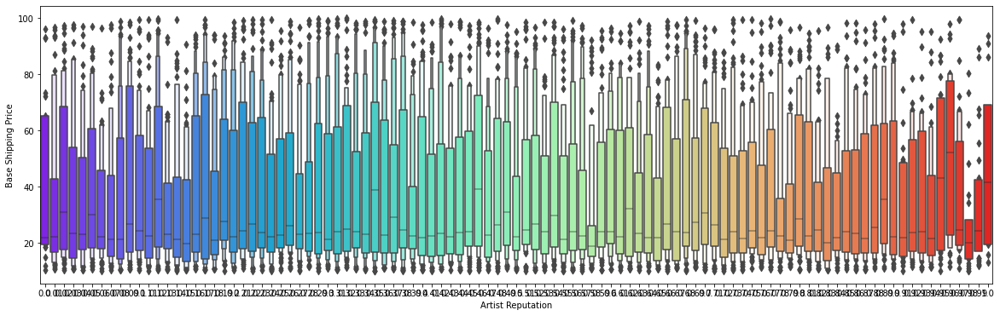

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')

from above boxen plot:
1. The distribution between lower adjacent value and upper adjacent value is symmetrical.
2. There is no rcorelation between Base Shipping Price and Artist Reputation

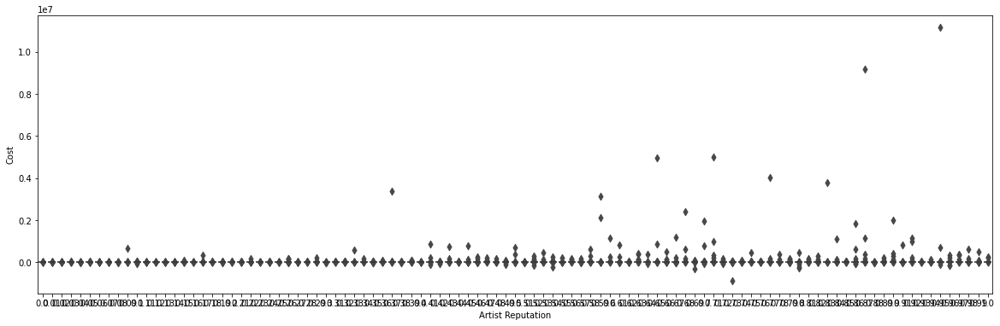

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Cost",data=train_data, palette='rainbow')

from above boxen plot:

values of cost are between 0.0 to 0.1 for most values of Artist reputation but there are some values above 0.1

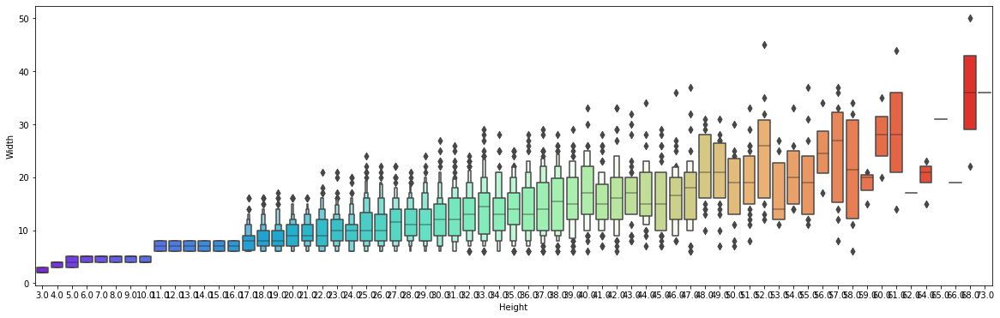

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Width",data=train_data, palette='rainbow')

from above boxen plot:
1. There is a positive correlation between height and Width.

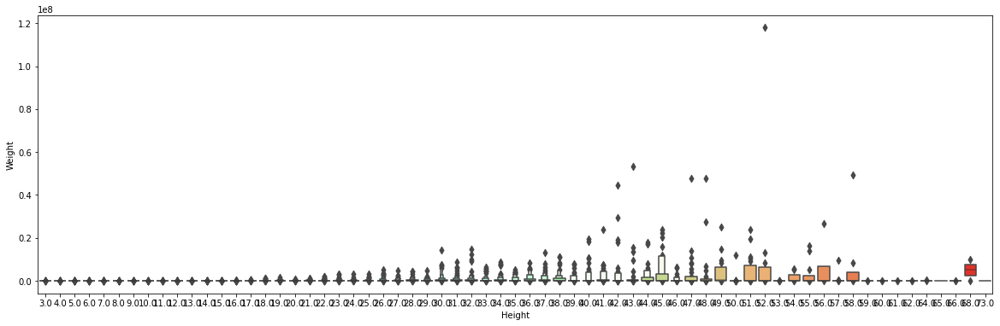

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Weight",data=train_data, palette='rainbow')

from above boxen plot:

range of values of weight increases with increase in height values and then decreases with decrease in height value.

values of weight are between 0.0 to 0.2 for most values of Height but there are some values above 0.2

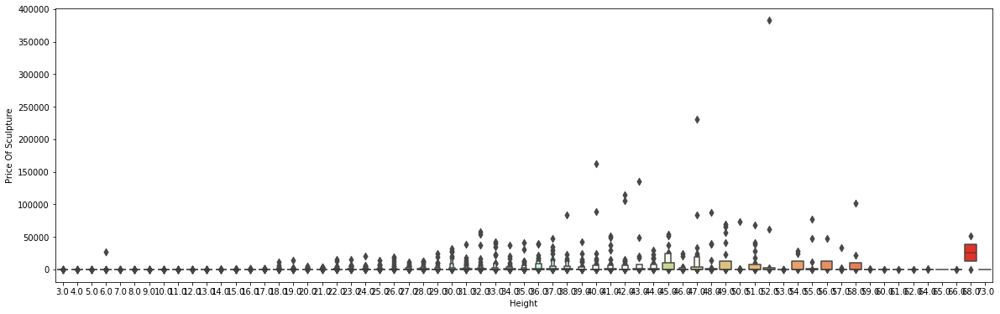

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above boxen plot:

range of values of weight price of sculpture with increase in height values and then decreases with decrease in height value.

values of weight are between 0.0 to 50000 for most values of Height but there are some values above 50000

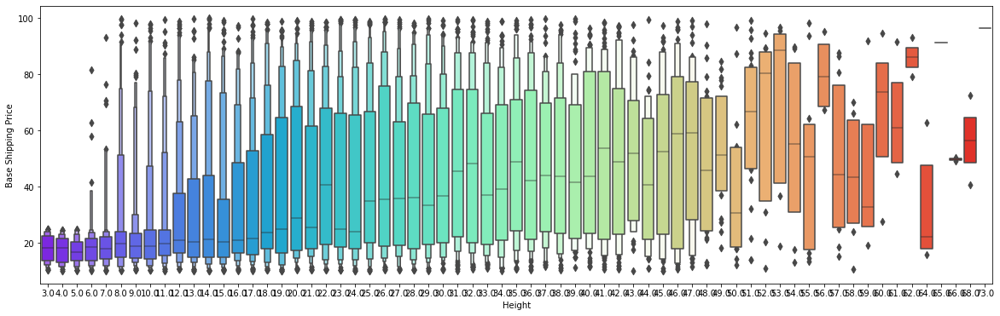

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Base Shipping Price",data=train_data, palette='rainbow')

from above boxen plot:

1. There is weak correlation between height and Base Shipping Price

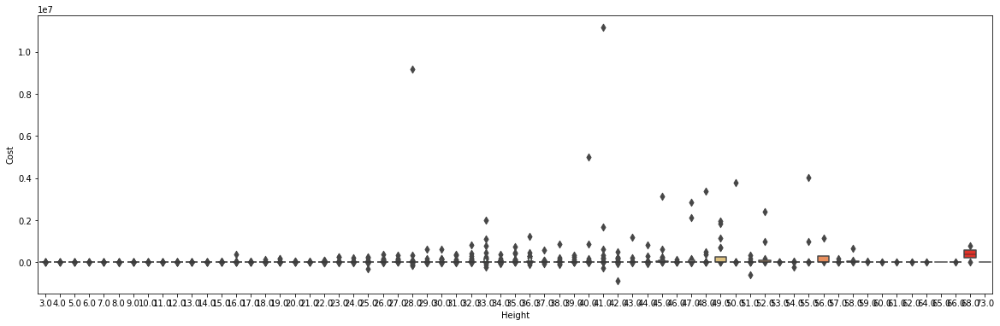

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Cost",data=train_data, palette='rainbow')

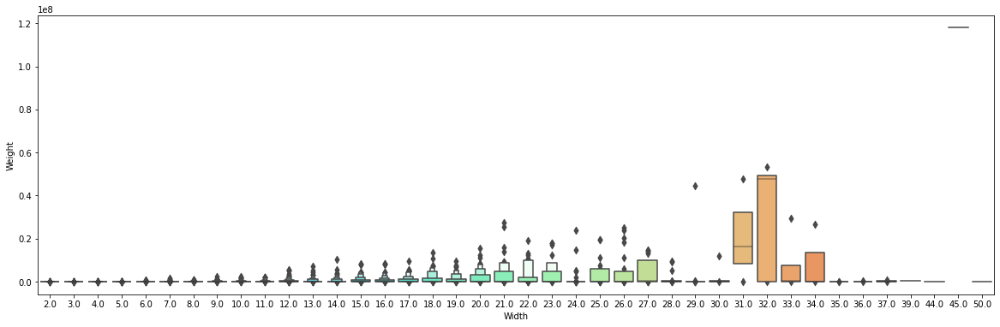

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Weight",data=train_data, palette='rainbow')

from above boxen plot:

1. There is no relation between Width and Weight

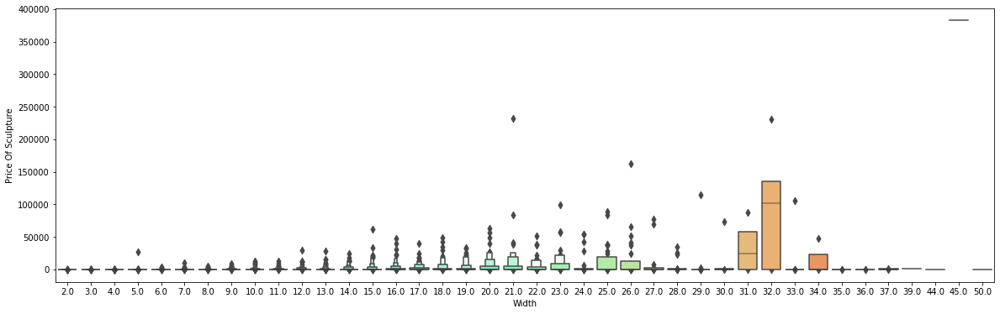

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above boxen plot:

1. There is very weak correlation between Width and Price Of Sculpture

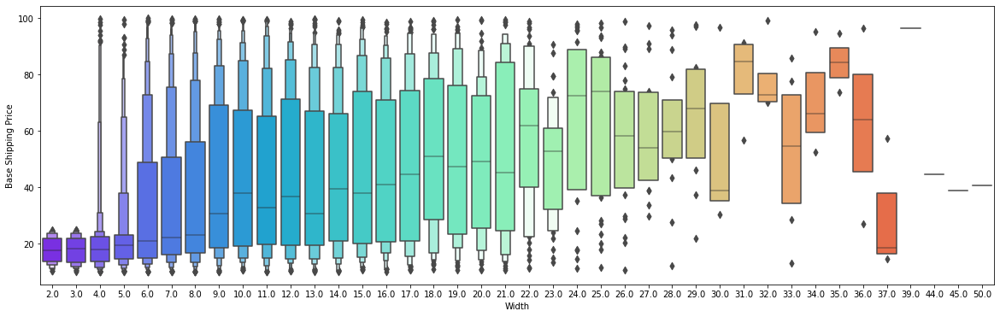

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Base Shipping Price",data=train_data, palette='rainbow')

from above boxen plot:

1. There is weak correlation between Width and Base Shipping Price

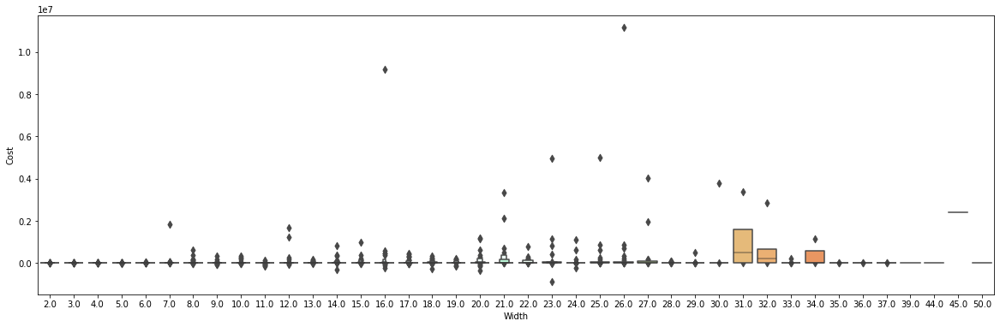

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Cost",data=train_data, palette='rainbow')

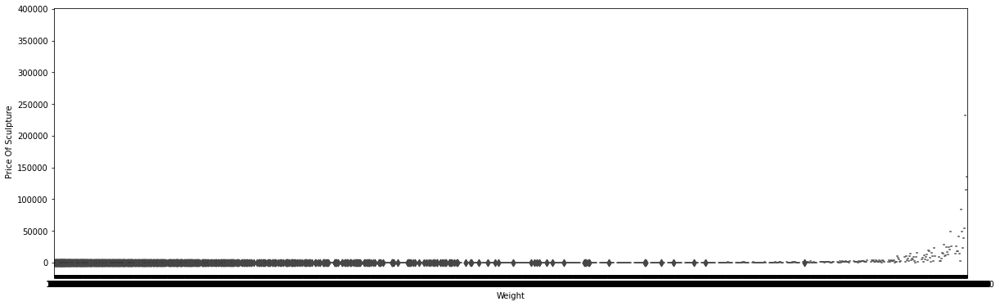

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Weight',y="Price Of Sculpture",data=train_data, palette='rainbow')

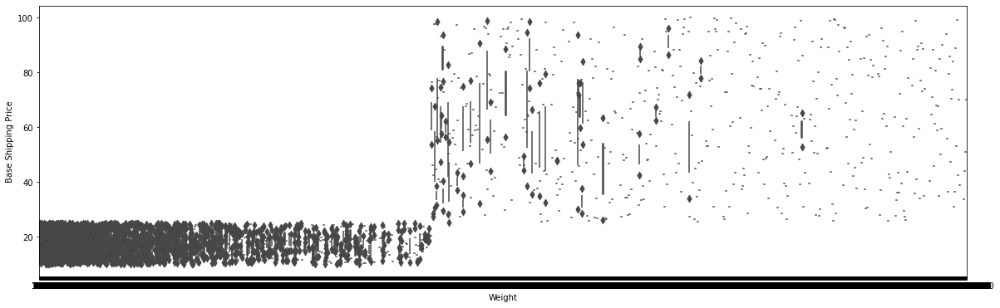

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Weight',y="Base Shipping Price",data=train_data, palette='rainbow')

from above boxen plot:

1. There is very weak correlation between Weight and Base Shipping Price

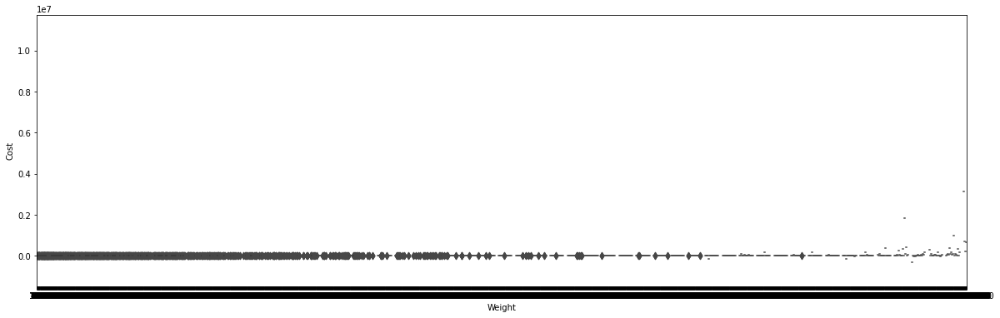

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Weight',y="Cost",data=train_data, palette='rainbow')

from above boxen plot:

values of cost are between 0.0 to 0.1 for most values of Weight but there are some values above 0.1

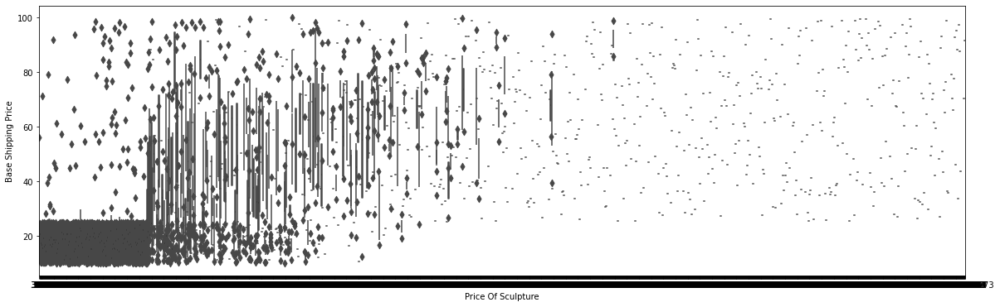

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Price Of Sculpture',y="Base Shipping Price",data=train_data, palette='rainbow')

from above boxen plot:

1. There is very weak correlation between Price Of Sculpture and Base Shipping Price

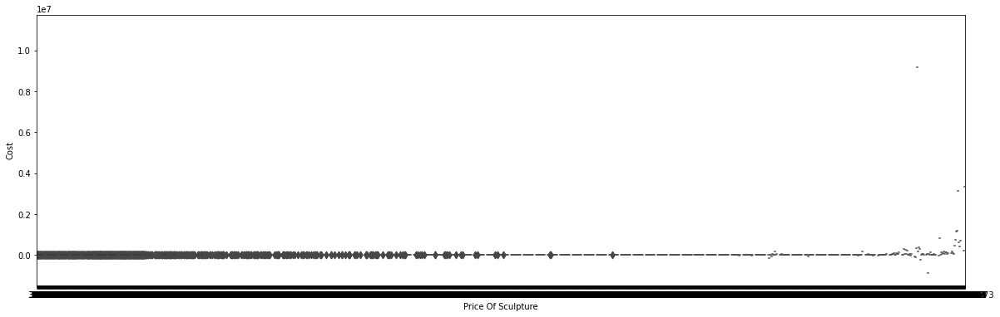

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Price Of Sculpture',y="Cost",data=train_data, palette='rainbow')

from above boxen plot:

Values of cost is almost around zero for price of sculpture at the begining but starts to show high change in value for larger values of price of sculpture

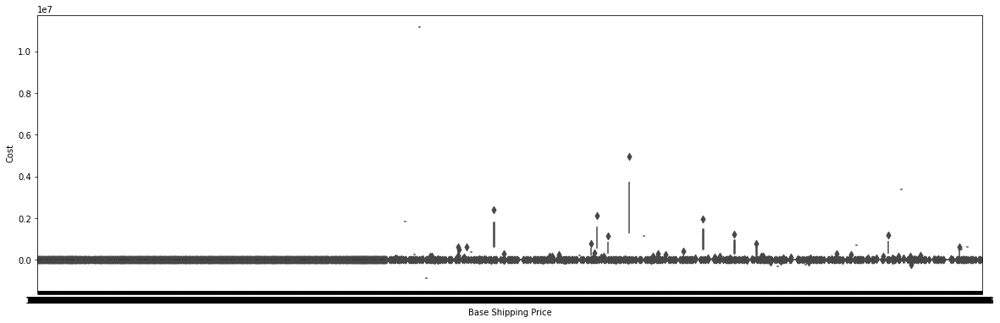

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Base Shipping Price',y="Cost",data=train_data, palette='rainbow')

from above boxen plot:

Values of cost is almost around zero for Base Shipping Price at the begining but starts to show high change in value for larger values of Base Shipping Price.


# Point Plot


1. A point plot uses scatter plot glyphs to visualize features like point estimates and confidence intervals.

2. A point plot uses scatter plot points to represent the central tendency of numeric data.

3. These plots make use of error bars to indicate any uncertainty around the numeric

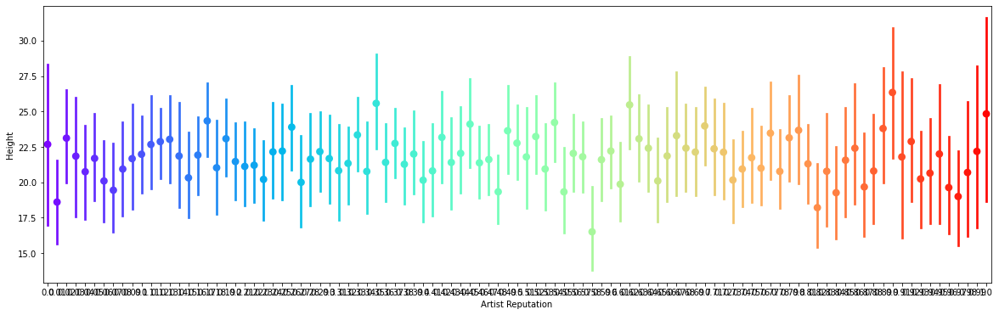

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Height",data=train_data, palette='rainbow')

From above point plot

The error bar shows that there is variability of association with each Y and X center point value. that is the Height has standard deviations of vales for each Artist Reputation value

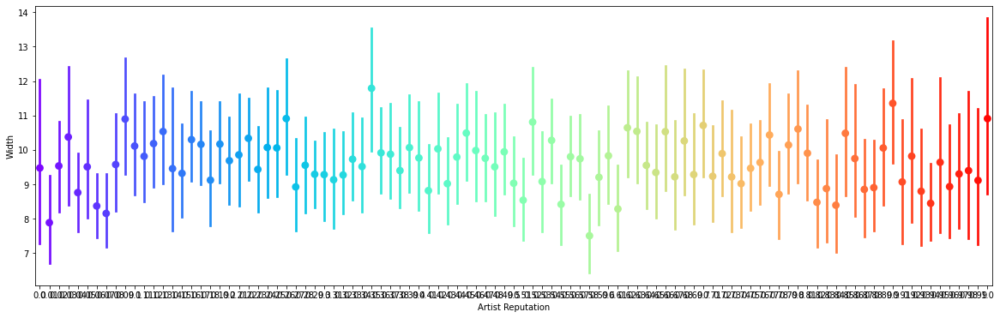

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Width",data=train_data, palette='rainbow')

From above point plot

The error bar shows that there is variability of association with each Y and X center point value. that is the Width has standard deviations of vales for each Artist Reputation value

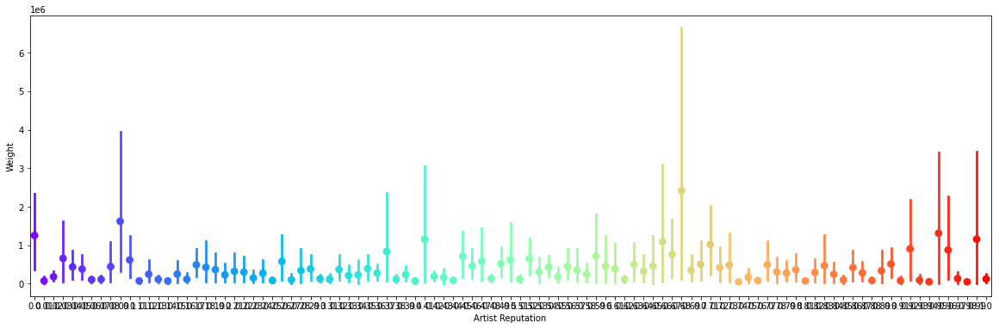

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Weight",data=train_data, palette='rainbow')

From above point plot

The error bar shows that there is variability of association with each Y and X center point value. that is the Weight has standard deviations of vales for each Artist Reputation value

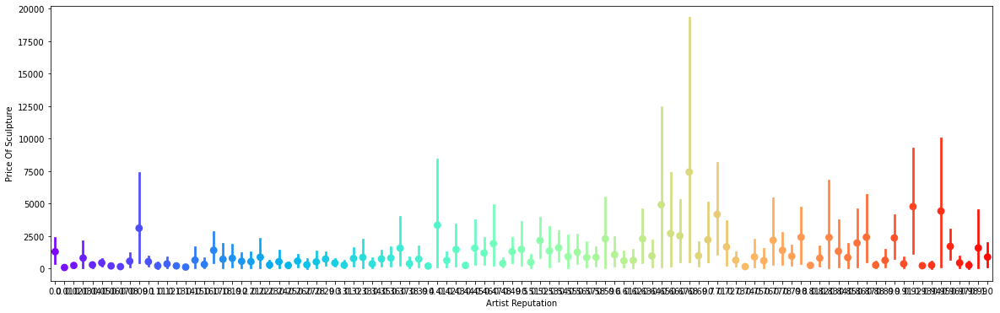

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Price Of Sculpture",data=train_data, palette='rainbow')

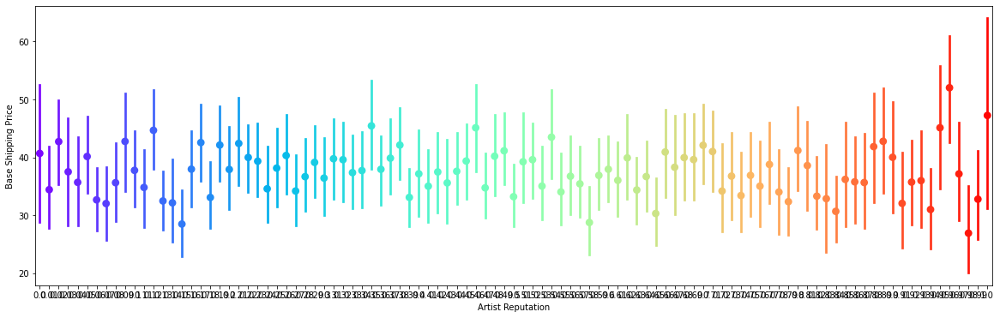

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')

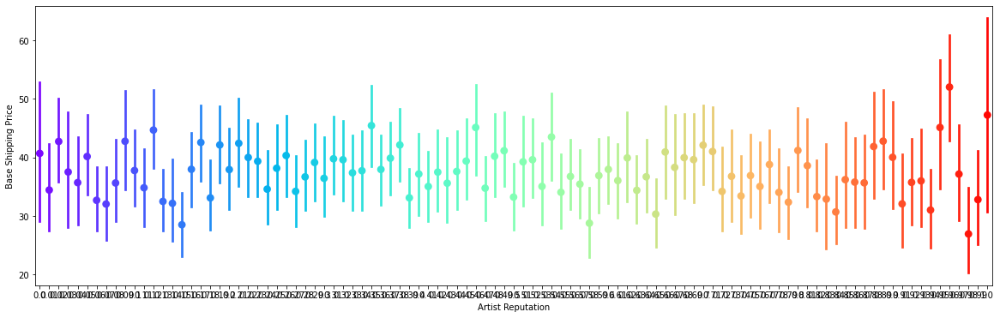

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')

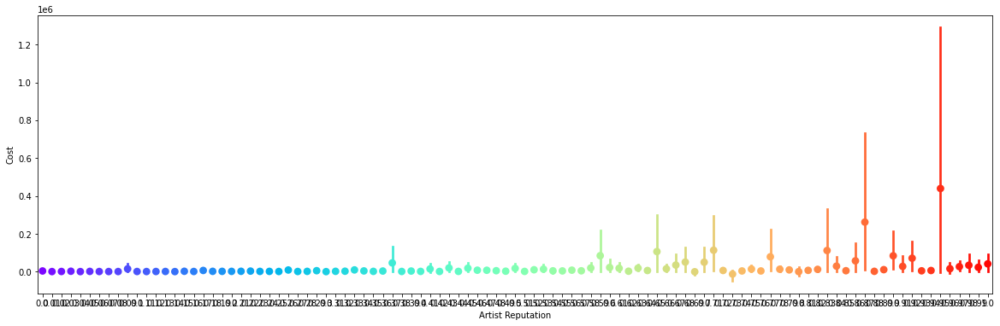

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Artist Reputation',y="Cost",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

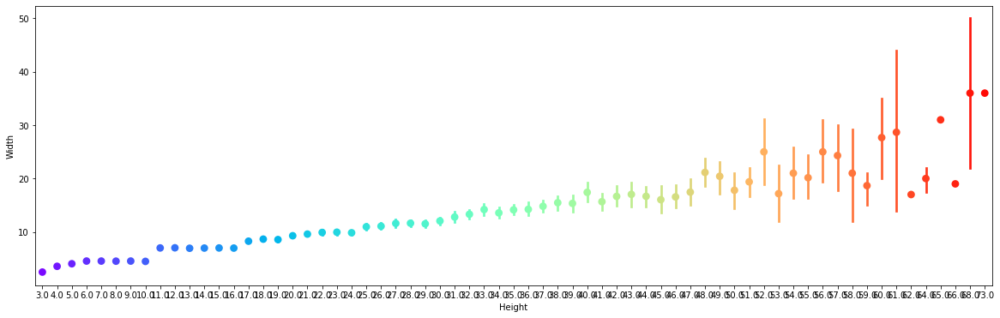

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Height',y="Width",data=train_data, palette='rainbow')

From above point plot

There is a increase in width when there is a increase in Height.
That is both are correlated

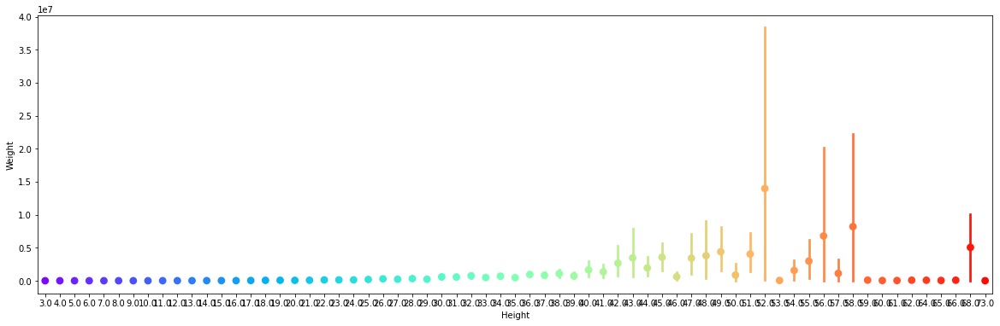

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Height',y="Weight",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

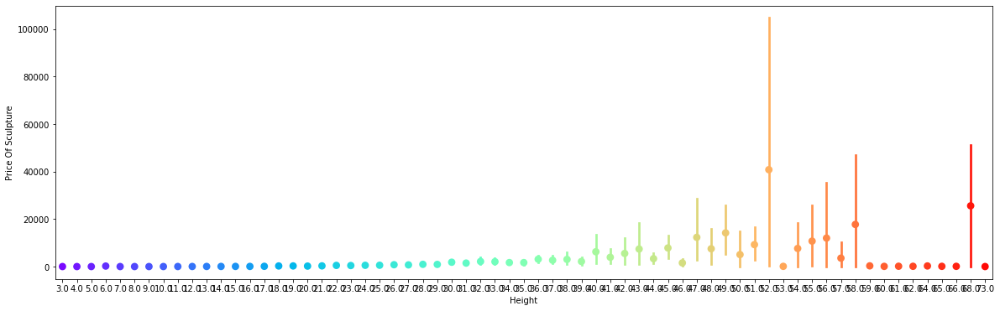

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Height',y="Price Of Sculpture",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

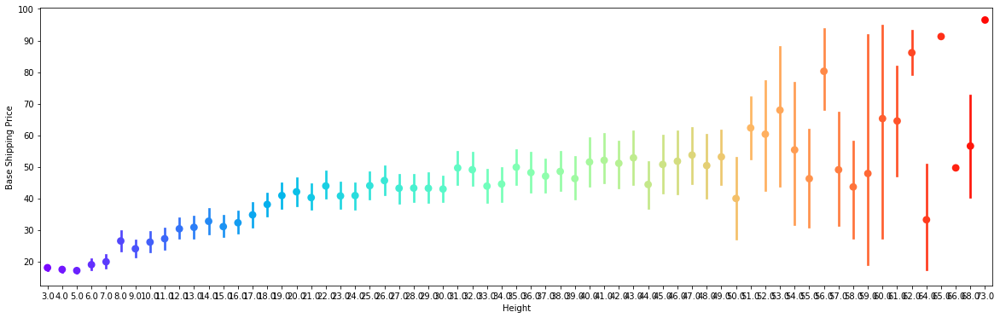

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Height',y="Base Shipping Price",data=train_data, palette='rainbow')

From above point plot

There is a increase in Base Shipping Price when there is a increase in Height. That is they are correlated

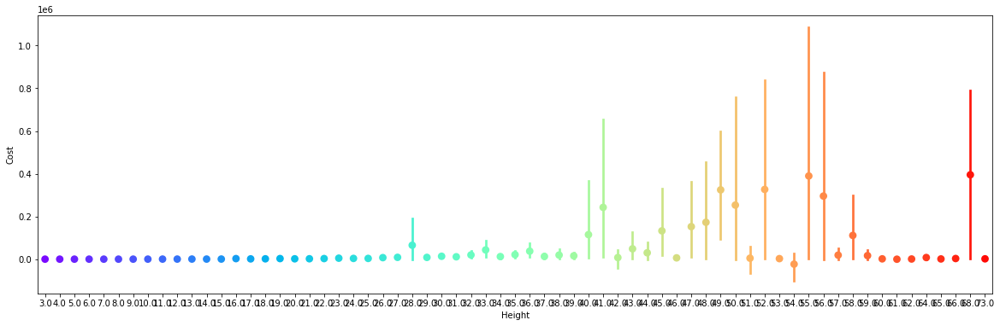

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Height',y="Cost",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

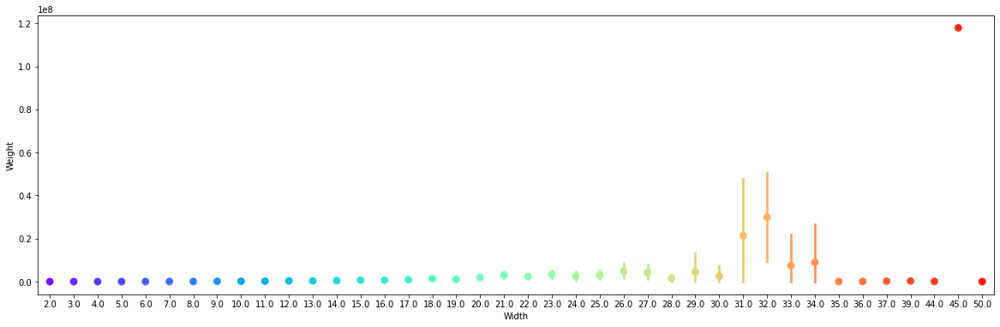

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Width',y="Weight",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

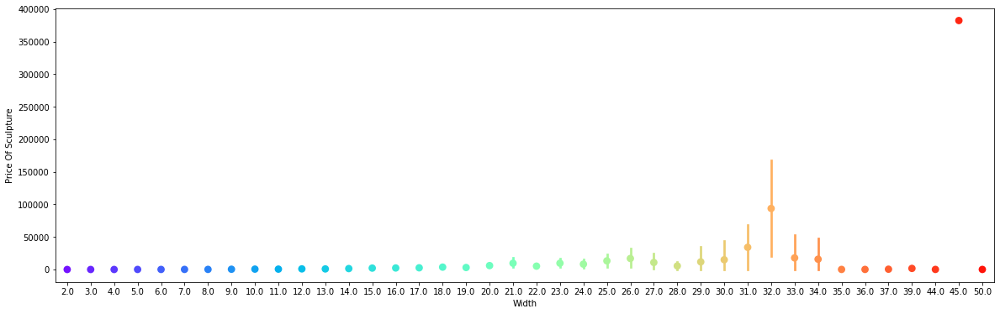

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Width',y="Price Of Sculpture",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

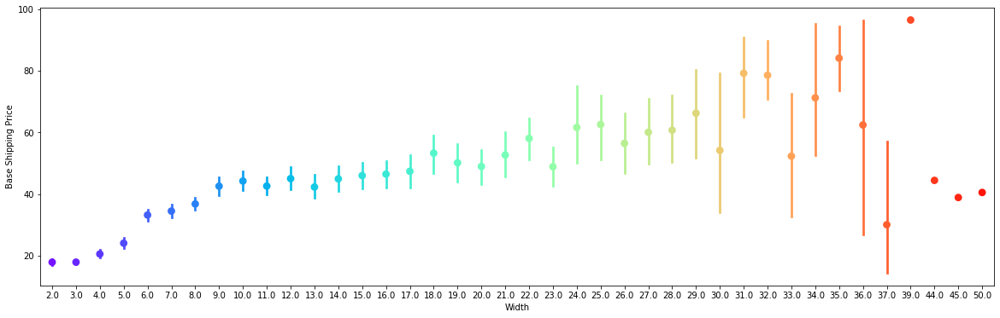

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Width',y="Base Shipping Price",data=train_data, palette='rainbow')

From above point plot

There is a increase in Base Shipping Price when there is a increase in Widtg. That is both are correlated

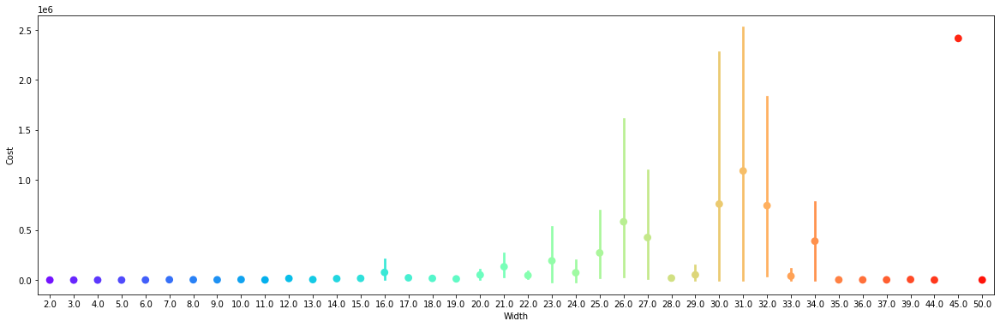

In [ ]:
plt.figure(figsize=(20,6))
sns.pointplot(x='Width',y="Cost",data=train_data, palette='rainbow')

From above pointplot

1. Most of the points are around 0.
2. Very few points above 0.

# Count Plot

1. A countplot is kind of like a histogram or a bar graph for some categorical area.

2. It simply shows the number of occurrences of an item based on a certain type of category.


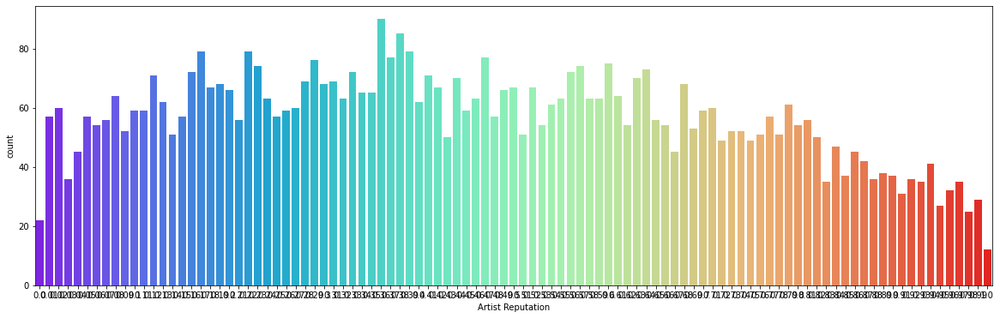

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Artist Reputation',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset is symmetrical.

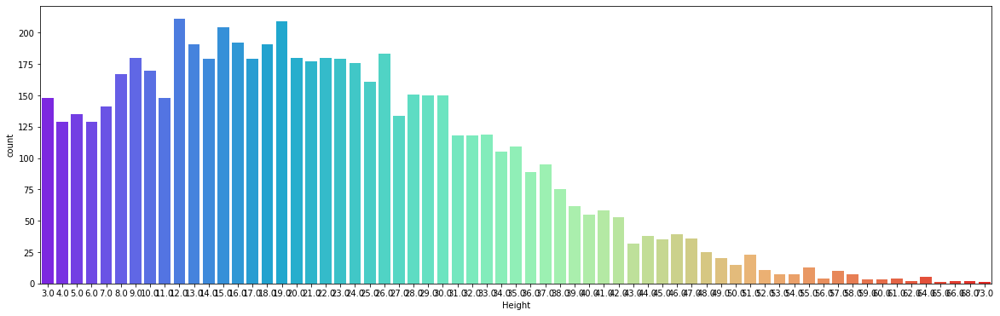

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Height',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed left.

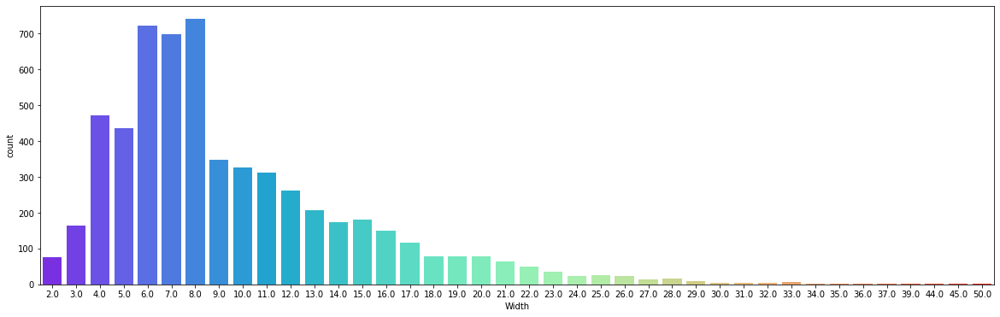

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Width',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed left.

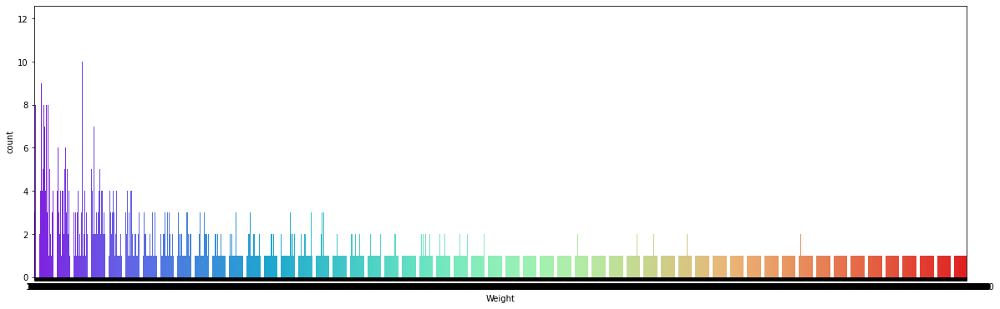

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Weight',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed left., multimodal

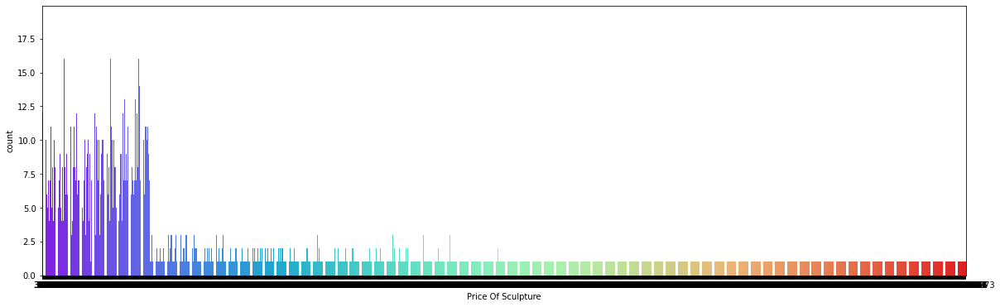

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Price Of Sculpture',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed left, multimodal.

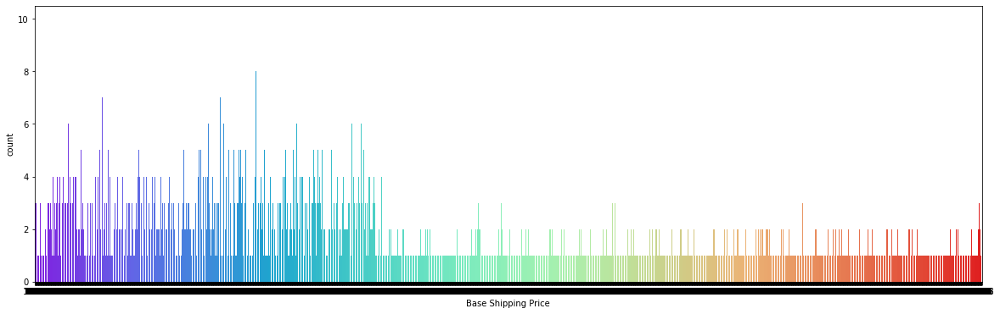

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Base Shipping Price',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed left, multimodal.

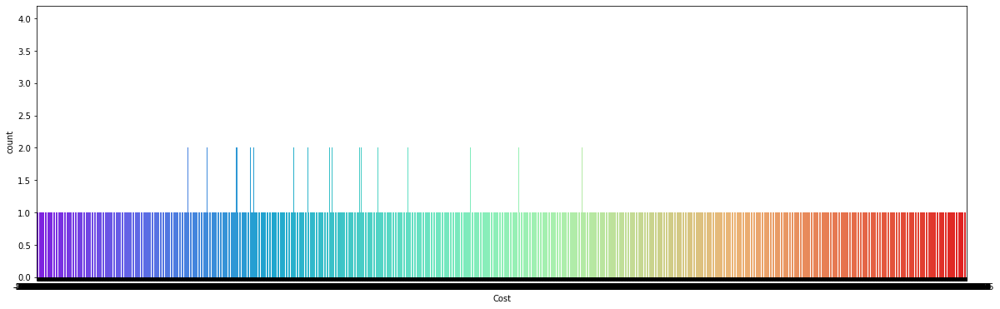

In [ ]:
plt.figure(figsize=(20,6))
sns.countplot(x='Cost',data=train_data, palette='rainbow')

From above count plot

distribution of values over complete dataset are multi model that is more than one peak.

# Strip Plot

A strip plot is a graphical data anlysis technique for summarizing a univariate data set. The strip plot consists of:

    1. Horizontal axis = the value of the response variable;
    2. Verticalal axis = all values are set to 1.

That is, a strip plot is simply a plot of the sorted response values along one axis. The strip plot is an alternative to a histogram or a density plot. It is typically used for small data sets (histograms and density plots are typically preferred for larger data sets). 

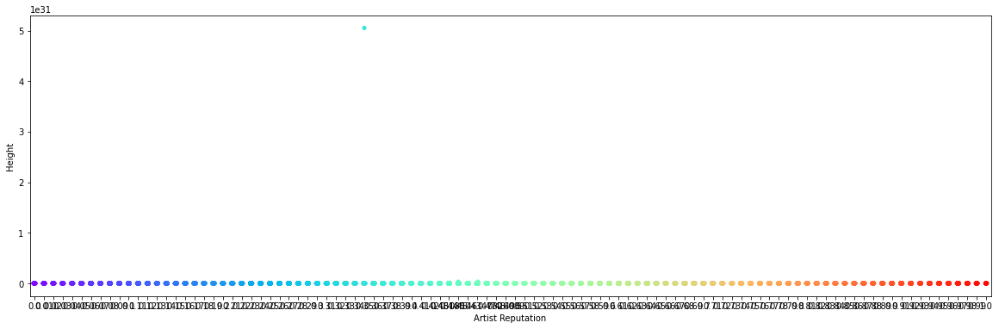

In [75]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Artist Reputation',y="Height",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Height with repect to Artist Reputation is between 0 to 50.
2. few values are above 50

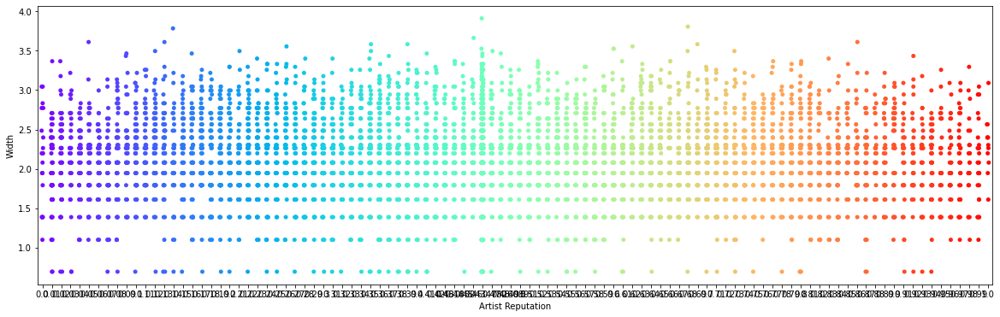

In [76]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Artist Reputation',y="Width",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Width with repect to Artist Reputation is between 0 to 30.
2. few values are above 30

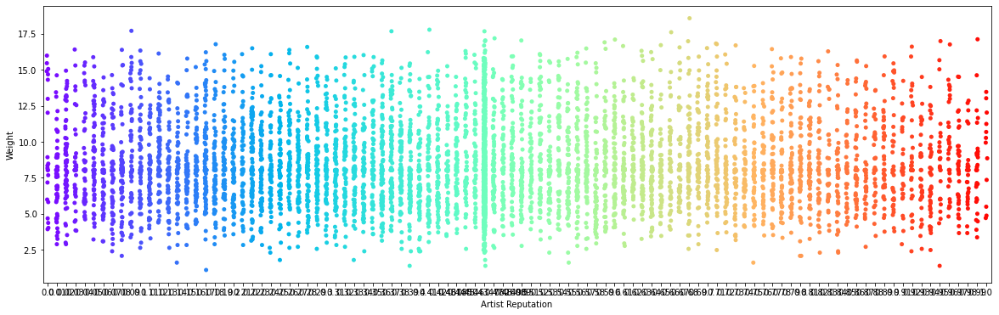

In [77]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Artist Reputation',y="Weight",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Weight with repect to Artist Reputation are between 0 and 0.1.
2. few values are above 0.1.

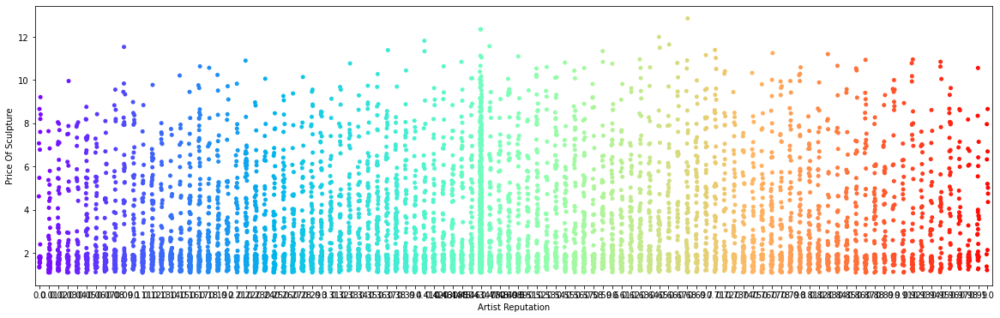

In [78]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Artist Reputation',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Price of Sculpture with repect to Artist Reputation is between 0 to 1000.
2. few values are above 1000

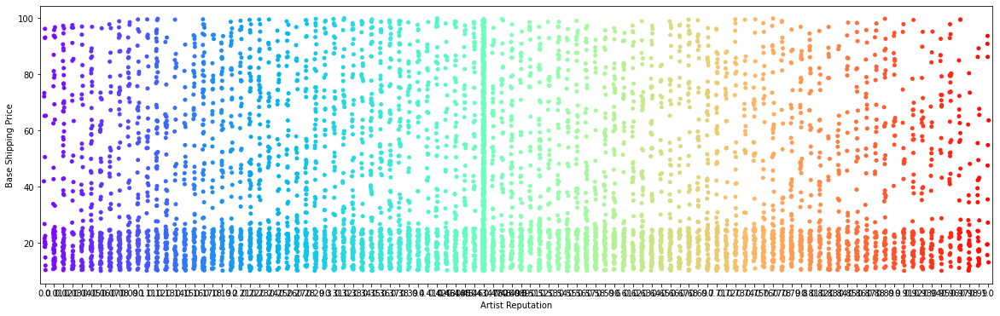

In [79]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Base shipping price with repect to Artist Reputation is between 0 to 30.
2. few values are between 30 to 100

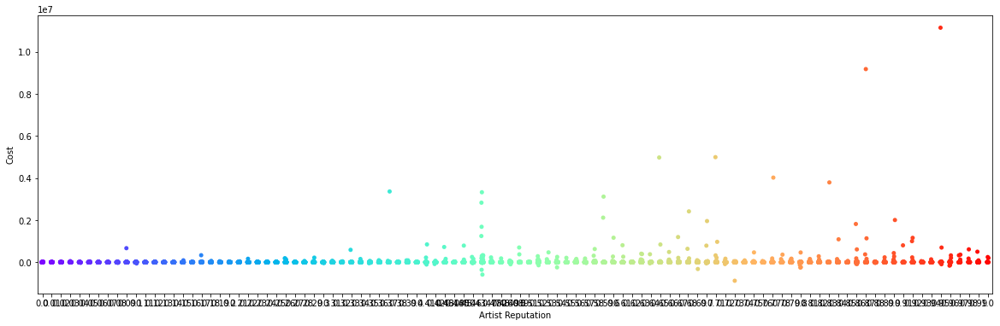

In [80]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Artist Reputation',y="Cost",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Cost with repect to Artist Reputation are around 0
2. few values are above 0

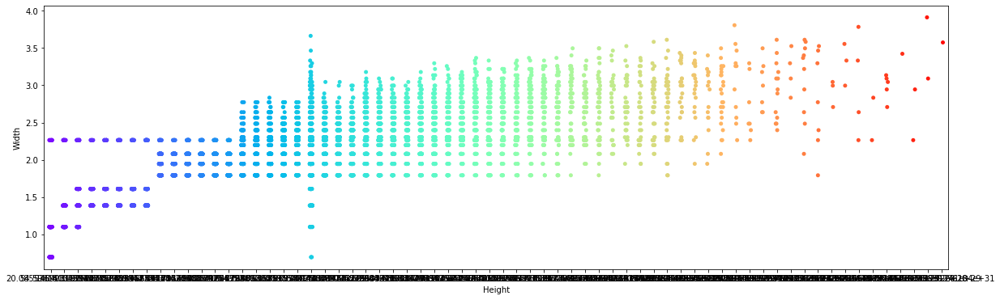

In [81]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Height',y="Width",data=train_data, palette='rainbow')

from above strip plot:

1. There is growth in the width values as we move right on height axis.

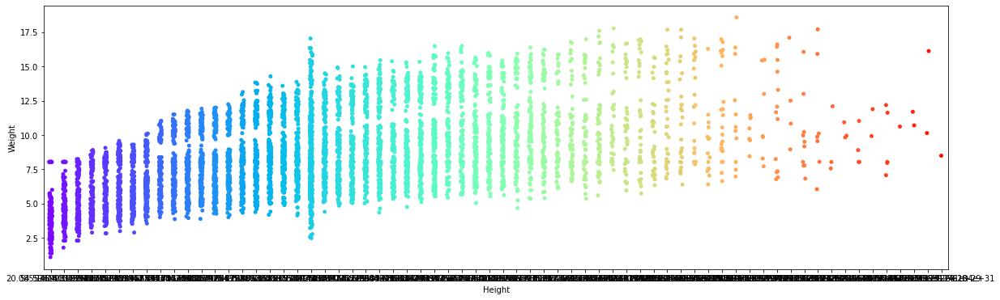

In [82]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Height',y="Weight",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Weight with repect to Height are between 0 to 0.1.
2. few values are above 0.1

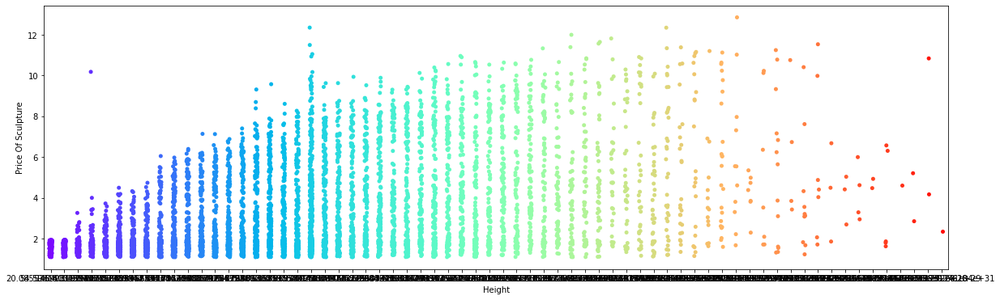

In [83]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Height',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Price Of Sculpture with repect to Height is between 0 to 1000.
2. few values are above 1000.

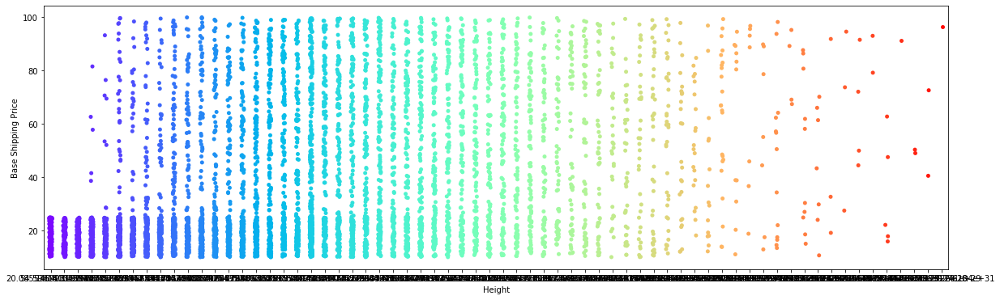

In [84]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Height',y="Base Shipping Price",data=train_data, palette='rainbow')

from above strip plot:

1. Maximum of the distribution of Base Shipping Price with repect to Height is between 0 to 30.
2. remaining values are between 30 and 100.

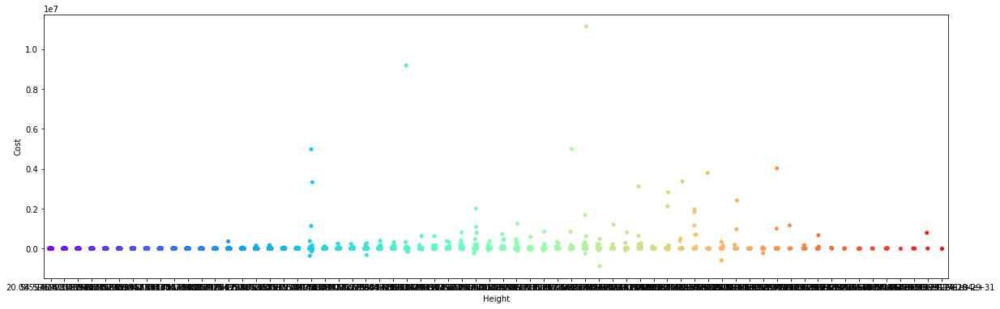

In [85]:
plt.figure(figsize=(20,6))
sns.stripplot(x='Height',y="Cost",data=train_data, palette='rainbow')

from above strip plot:

1. Most of the distribution of Cost with repect to Height are between 0 and 0.1.
2. very few values are above 0.1.

# Swarm Plot



1. The swarm plot is a type of scatter plot, but helps in visualizing different categorical variables.

2. Scatter plots generally plots based on numeric values, but most of the data analyses happens on categorical variables. So, swarm plots seem very useful in those cases.


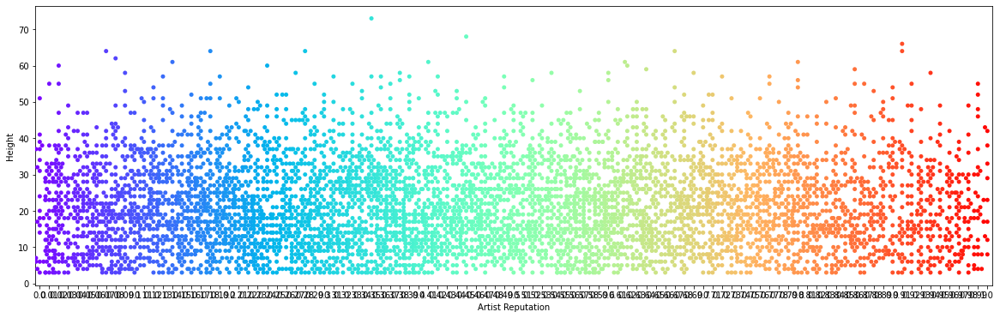

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Artist Reputation',y="Height",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Height with repect to Artist Reputation is between 0 to 50.
2. few values are above 50

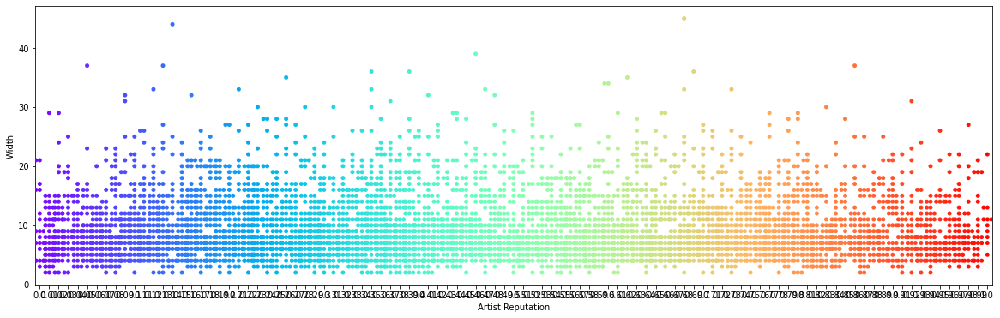

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Artist Reputation',y="Width",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Width with repect to Artist Reputation is between 0 to 30.
2. few values are above 30

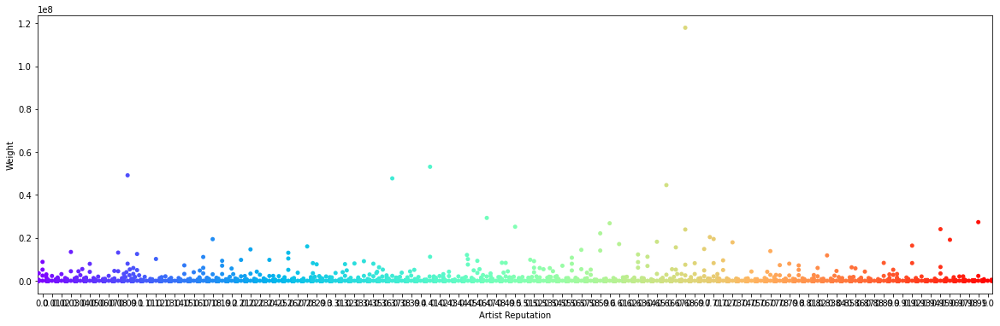

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Artist Reputation',y="Weight",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Weight with repect to Artist Reputation are between 0 and 0.1.
2. few values are above 0.1.

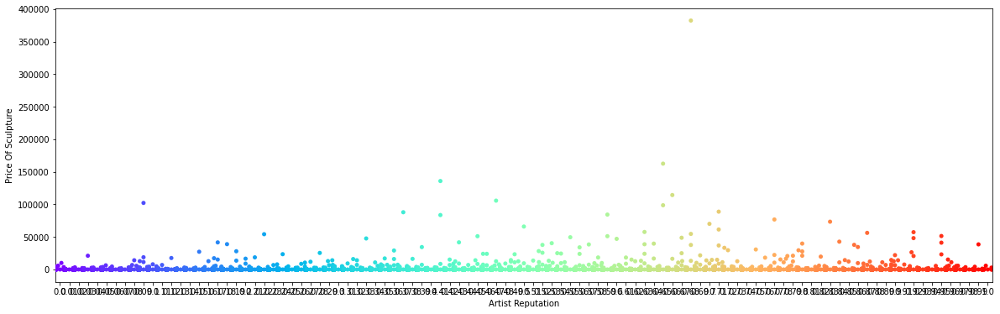

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Artist Reputation',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Price of Sculpture with repect to Artist Reputation is between 0 to 1000.
2. few values are above 1000

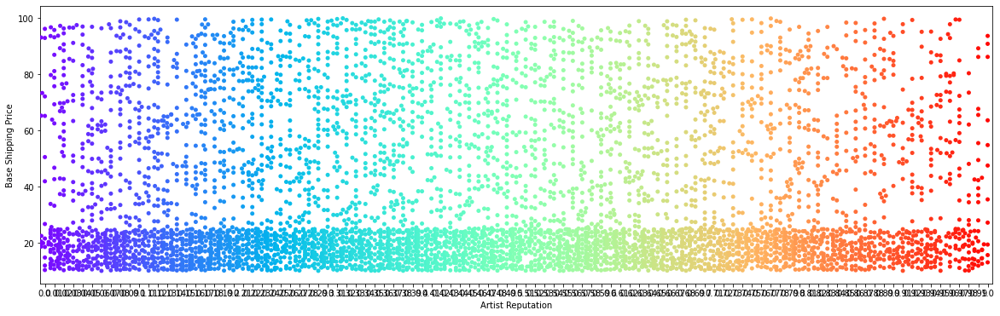

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Base shipping price with repect to Artist Reputation is between 0 to 30.
2. few values are between 30 to 100

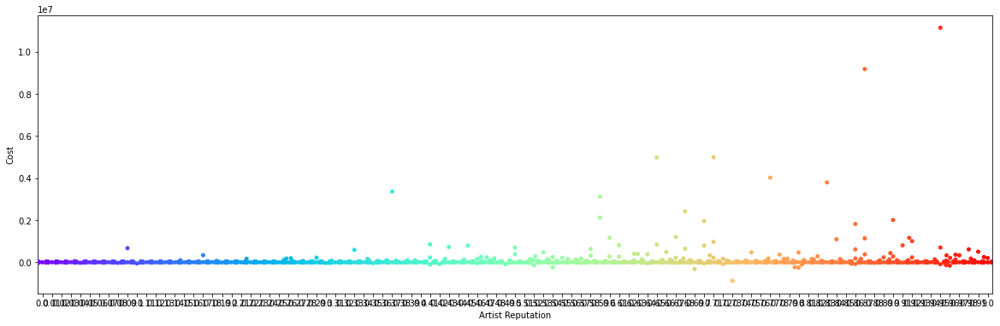

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Artist Reputation',y="Cost",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Cost with repect to Artist Reputation are around 0
2. few values area bove 0

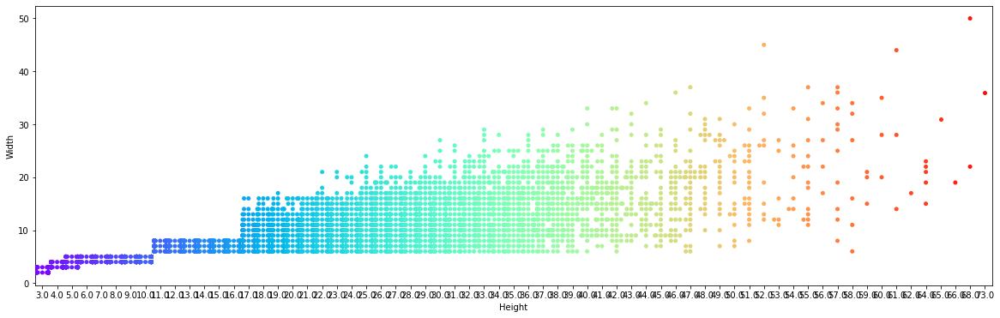

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Height',y="Width",data=train_data, palette='rainbow')

from above swarm plot:

1. There is growth in the width values as we move right on height axis.

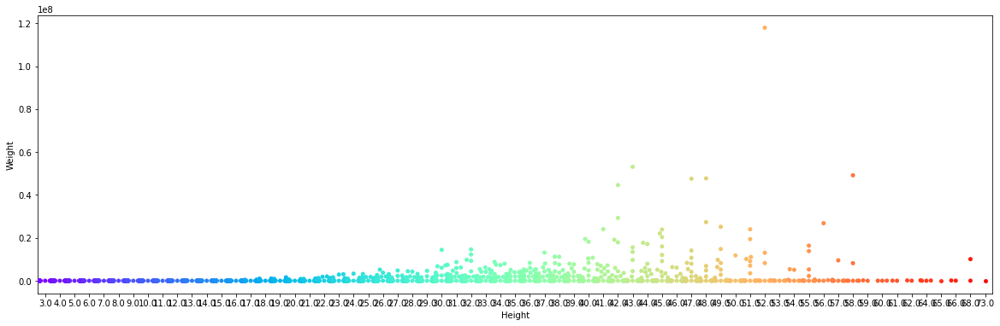

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Height',y="Weight",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Weight with repect to Height are between 0 to 0.1.
2. few values are above 0.1

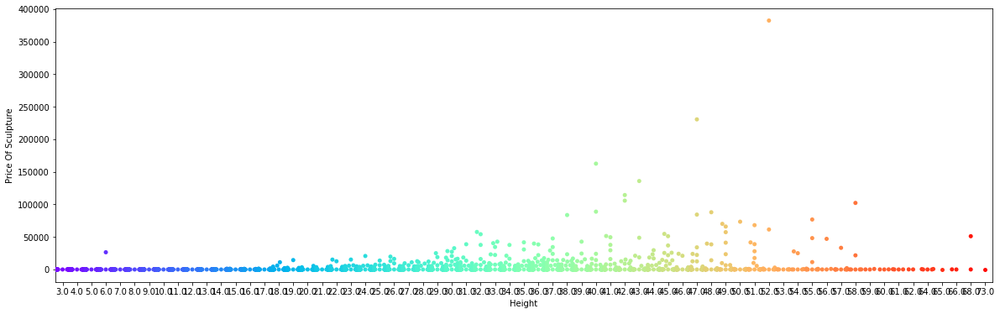

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Height',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Price Of Sculpture with repect to Height is between 0 to 1000.
2. few values are above 1000.

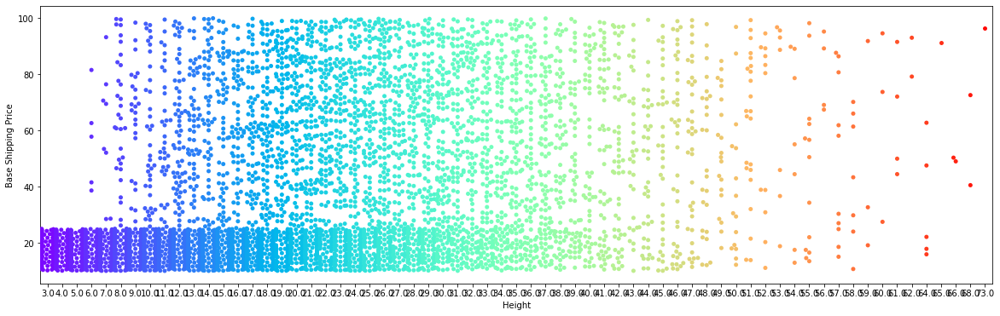

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Height',y="Base Shipping Price",data=train_data, palette='rainbow')

from above swarm plot:

1. Maximum of the distribution of Base Shipping Price with repect to Height is between 0 to 30.
2. remaining values are between 30 and 100.

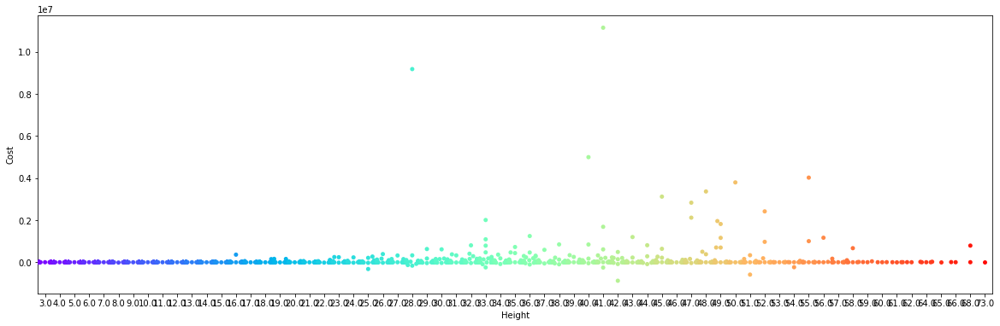

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Height',y="Cost",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Cost with repect to Height are between 0 and 0.1.
2. very few values are above 0.1.

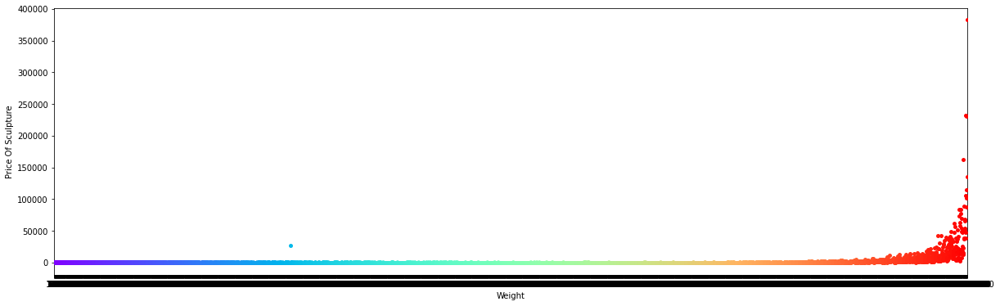

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Weight',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above swarm plot:

1. Most of the distribution of Price Of Sculpture with repect to Weight is between 0 to 1000.
2. But as the weight increases the Price Of Sculpture increases above 1000.

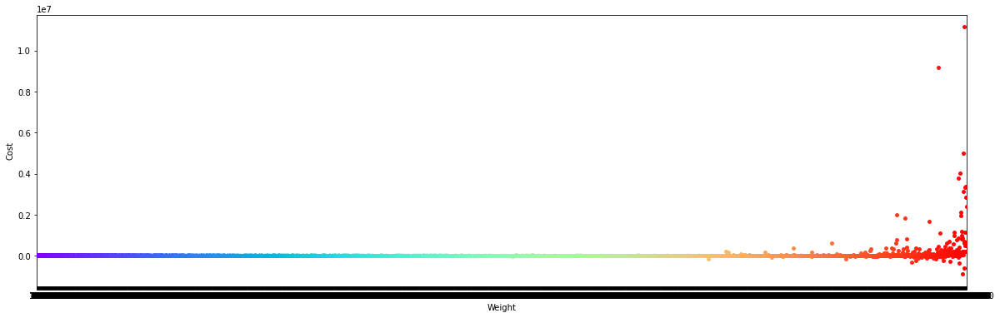

In [ ]:
plt.figure(figsize=(20,6))
sns.swarmplot(x='Weight',y="Cost",data=train_data, palette='rainbow')

1. Most of the distribution of Cost with repect to Weight is between 0 to 0.1.
2. But as the weight increases the Price Of Sculpture increases above 0.1

# Combine Plots
combination of boxen plot and swarm plot.
Just to see the distribution of both graphs in one.

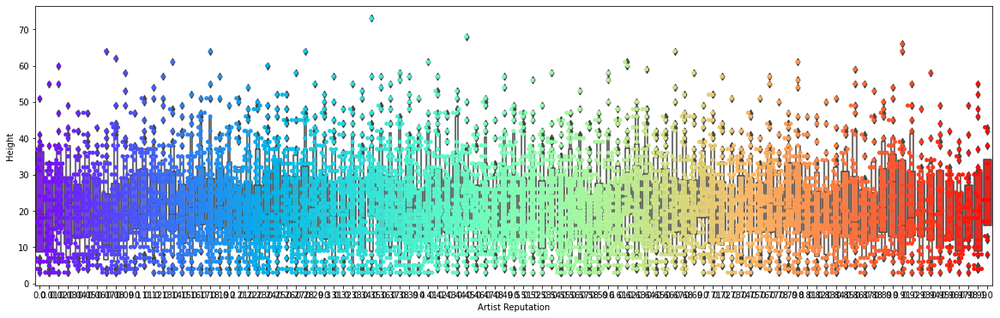

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Height",data=train_data, palette='rainbow')
sns.swarmplot(x='Artist Reputation',y="Height",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Height with repect to Artist Reputation is between 0 to 50.
2. few values are above 50

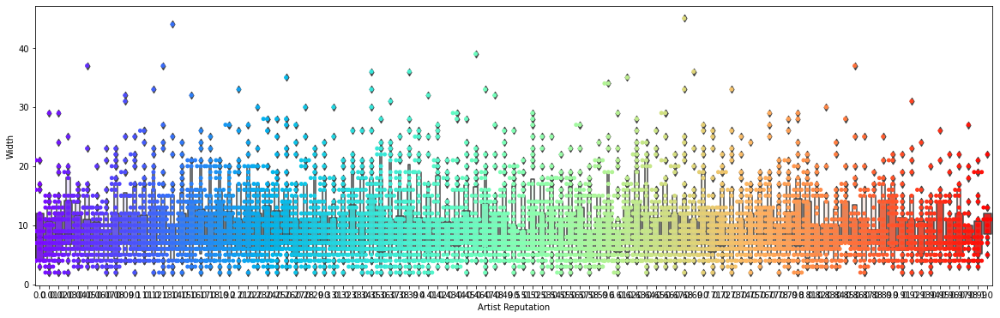

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Width",data=train_data, palette='rainbow')
sns.swarmplot(x='Artist Reputation',y="Width",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Width with repect to Artist Reputation is between 0 to 30.
2. few values are above 30



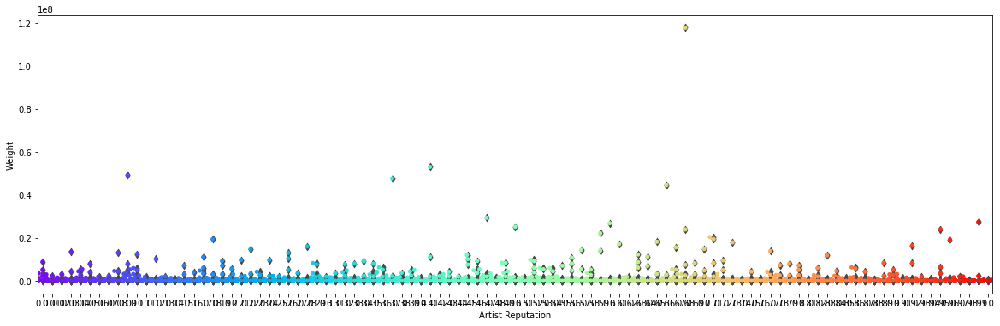

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Weight",data=train_data, palette='rainbow')
sns.swarmplot(x='Artist Reputation',y="Weight",data=train_data, palette='rainbow')

from above Combine plot:

1. Most of the distribution of Weight with repect to Artist Reputation are between 0 and 0.1.
2. few values are above 0.1.

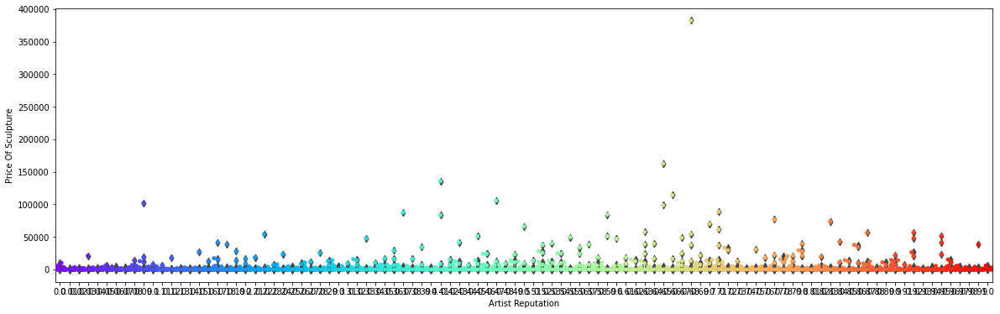

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Price Of Sculpture",data=train_data, palette='rainbow')
sns.swarmplot(x='Artist Reputation',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Price of Sculpture with repect to Artist Reputation is between 0 to 1000.
2. few values are above 1000

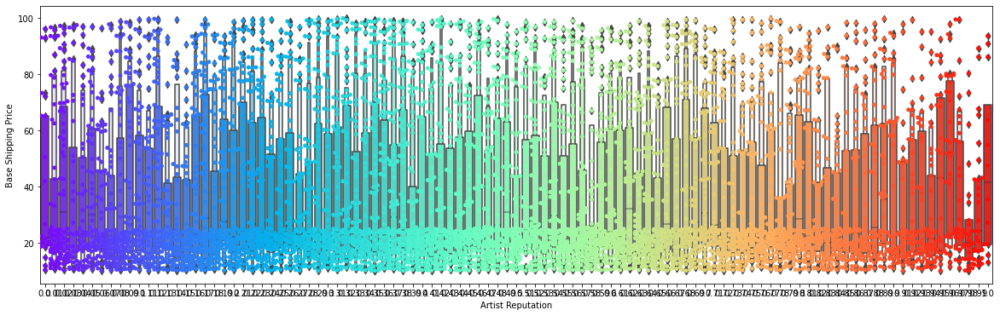

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')
sns.swarmplot(x='Artist Reputation',y="Base Shipping Price",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Base shipping price with repect to Artist Reputation is between 0 to 30.
2. few values are between 30 to 100

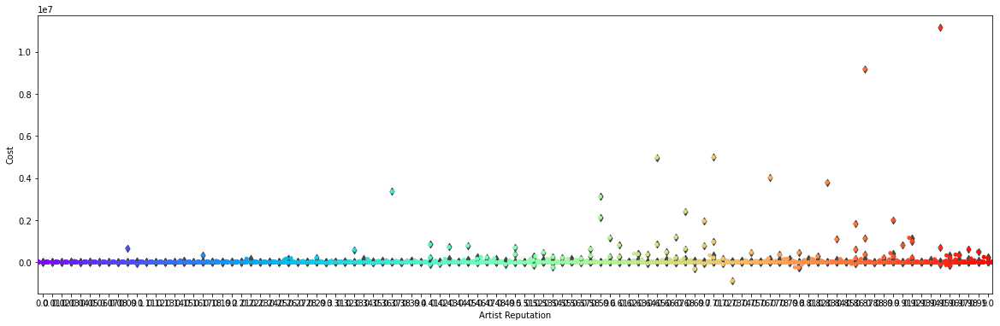

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Artist Reputation',y="Cost",data=train_data, palette='rainbow')
sns.swarmplot(x='Artist Reputation',y="Cost",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Cost with repect to Artist Reputation are around 0
2. few values area bove 0

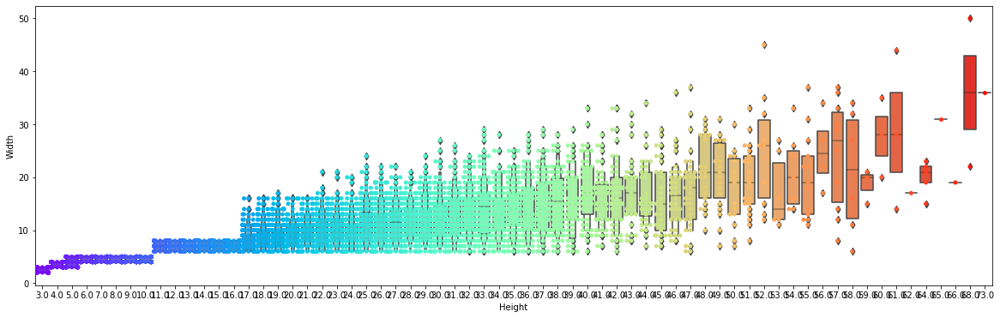

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Width",data=train_data, palette='rainbow')
sns.swarmplot(x='Height',y="Width",data=train_data, palette='rainbow')

from above combine plot:

1. There is growth in the width values as we move right on height axis.


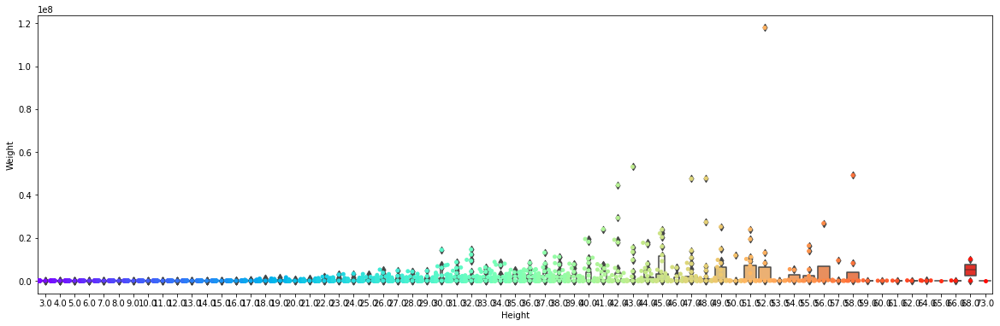

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Weight",data=train_data, palette='rainbow')
sns.swarmplot(x='Height',y="Weight",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Weight with repect to Height are between 0 to 0.1.
2. few values are above 0.1


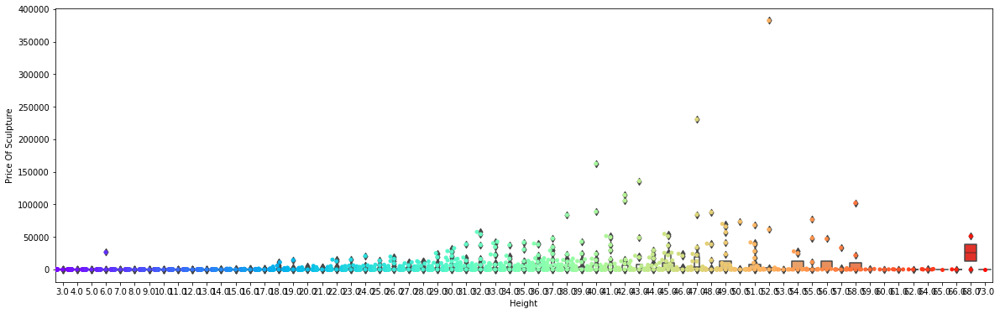

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Price Of Sculpture",data=train_data, palette='rainbow')
sns.swarmplot(x='Height',y="Price Of Sculpture",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Price Of Sculpture with repect to Height is between 0 to 1000.
2. few values are above 1000.




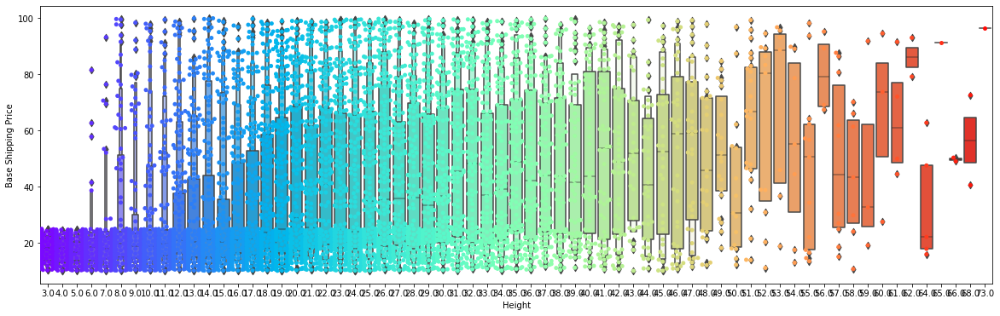

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Base Shipping Price",data=train_data, palette='rainbow')
sns.swarmplot(x='Height',y="Base Shipping Price",data=train_data, palette='rainbow')

from above combine plot:

1. Maximum of the distribution of Base Shipping Price with repect to Height is between 0 to 30.
2. remaining values are between 30 and 100.

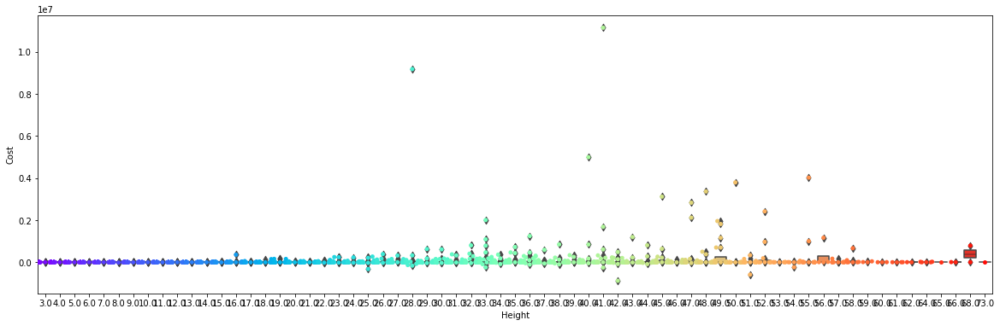

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Height',y="Cost",data=train_data, palette='rainbow')
sns.swarmplot(x='Height',y="Cost",data=train_data, palette='rainbow')

from above combine plot:

1. Most of the distribution of Cost with repect to Height are between 0 and 0.1.
2. very few values are above 0.1.


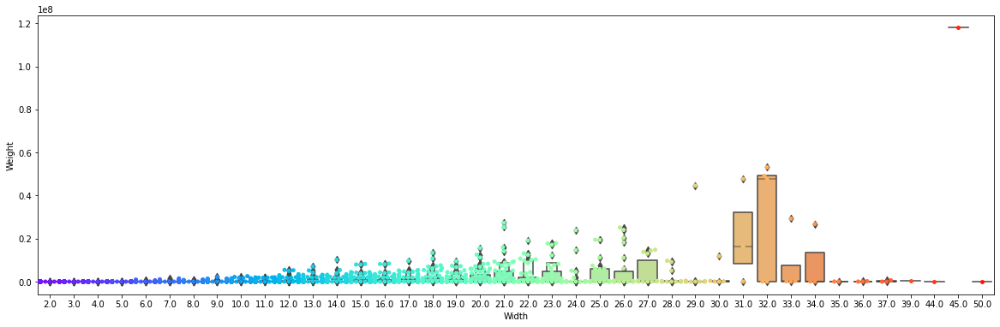

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Weight",data=train_data, palette='rainbow')
sns.swarmplot(x='Width',y="Weight",data=train_data, palette='rainbow')

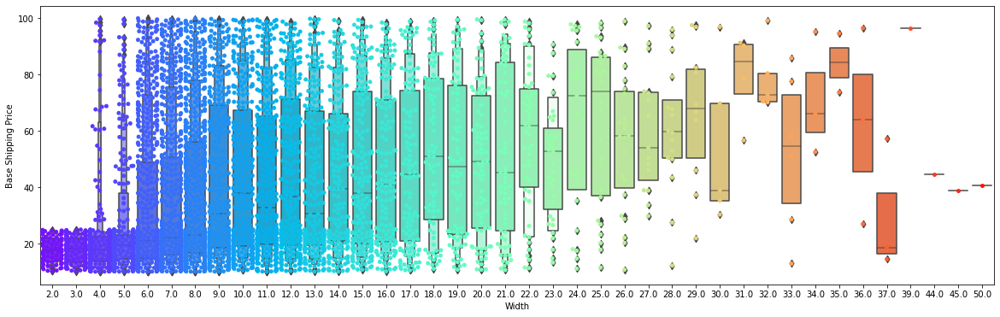

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Base Shipping Price",data=train_data, palette='rainbow')
sns.swarmplot(x='Width',y="Base Shipping Price",data=train_data, palette='rainbow')

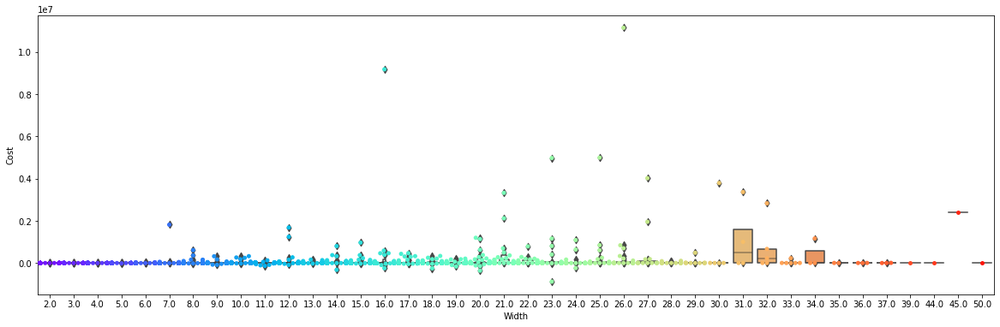

In [ ]:
plt.figure(figsize=(20,6))
sns.boxenplot(x='Width',y="Cost",data=train_data, palette='rainbow')
sns.swarmplot(x='Width',y="Cost",data=train_data, palette='rainbow')

# Dendrogram

The dendrogram is a visual representation of the compound correlation data. The individual compounds are arranged along the bottom of the dendrogram and referred to as leaf nodes. Compound clusters are formed by joining individual compounds or existing compound clusters with the join point referred to as a node.

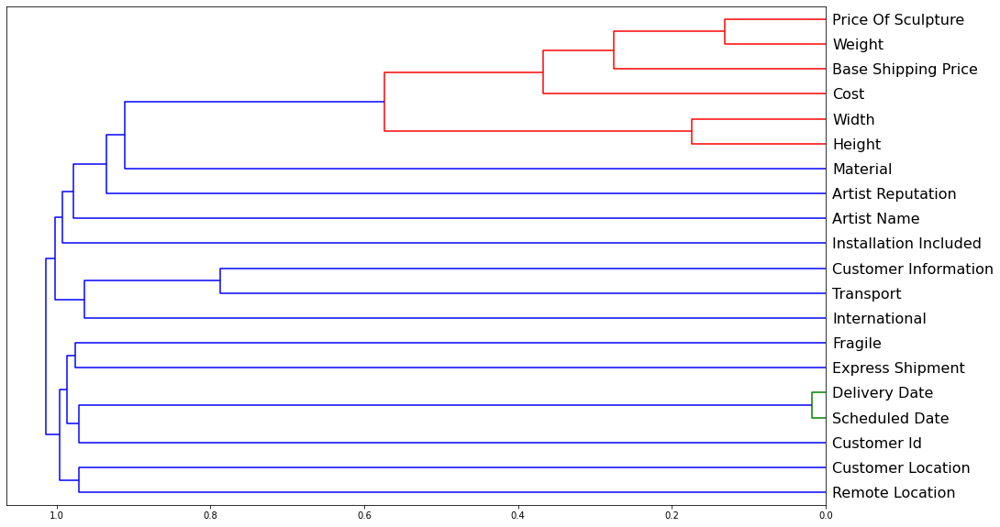

In [ ]:
# Plot a Dendrogram on the columns of the dataset

# droping the NaN values
X = train_data.dropna()

import scipy
from scipy.cluster import hierarchy as hc

corr = np.round(scipy.stats.spearmanr(X).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = hc.dendrogram(z, labels=X.columns, orientation='left', leaf_font_size=16)
plt.show()



observation from dendrogram:

Price Of Scuplture , Weight, Base Shipping Price, Cost , Width Height are all correlated.

Cost depends on Price Of Scuplture , Weight, Base Shipping Price.

### What we learn after plotting the dataset
1. Data is very skewed in nature except for `Artist Reputation`  
1. There are also outliers in most of the columns  
1. We need to make the distribution of all the columns normal in nature 

# Scaling

In [9]:
# Calculating the mean and median of the columns 
Artist_Reputation_mean = train_data['Artist Reputation'].mean()
Height_mean = train_data['Height'].mean()
Width_mean = train_data['Width'].mean()
Weight_median = train_data['Weight'].median()

In [10]:
# Making a copy of the dataset 
train_data_copy = train_data.copy(deep=True)

# Extracting State code from the Customer Location column E.g. New Michelle, OH 50777 - State Code: OH 
train_data_copy['State Code'] = train_data_copy['Customer Location'].str.split(',', expand=True)[1].str.slice(0, 3)

### Why missing values has to handled properly?

* Having missing values in your data is not necessarily a setback.  
* Still, it is an opportunity to perform the right feature engineering to guide the model to interpret the missing information the right way.  
* There are machine learning algorithms and packages that can automatically detect and deal with missing data.  
* However, it’s still recommended to transform the missing data manually through analysis and coding strategy.   
* Even in a well-designed and controlled study, missing data occurs in almost all research. Missing data can reduce the statistical power of a study and can produce biased estimates, leading to invalid conclusions.


### Why scaling is necessary?

* Most of the times, your dataset will contain features highly varying in magnitudes, units and range. But since, most of the machine learning algorithms use Euclidean distance between two data points in their computations, this is a problem.
* If left alone, these algorithms only take in the magnitude of features neglecting the units. 
* The results would vary greatly between different units, 5kg and 5000gms. 
* The features with high magnitudes will weigh in a lot more in the distance calculations than features with low magnitudes. 
* To suppress this effect, we need to bring all features to the same level of magnitudes. This can be achieved by scaling.

In [11]:
# Drop the irrelevant columns from the dataset
train_data.drop(['Customer Id', 'Artist Name'], axis = 1, inplace=True)

In [12]:
# Filling missing values in the 'Artist Reputation' column
train_data['Artist Reputation_NA'] = np.where(train_data['Artist Reputation'].isnull(), 1, 0)
train_data['Artist Reputation'].fillna(Artist_Reputation_mean, inplace = True)

In [13]:
# Filling missing values in the 'Transport' column
train_data['Transport_NA'] = np.where(train_data['Transport'].isnull(), 1, 0)
train_data['Transport'].fillna(train_data['Transport'].mode()[0], inplace = True)

In [14]:
# Filling missing values in the 'Remote Location' column
train_data['Remote_Location_NA'] = np.where(train_data['Remote Location'].isnull(), 1, 0)
train_data['Remote Location'].fillna(train_data['Remote Location'].mode()[0], inplace = True)

In [15]:
# Filling missing values in the 'Height' column
train_data['Height_NA'] = np.where(train_data['Height'].isnull(), 1, 0)
train_data['Height'].fillna(Height_mean, inplace = True)

# Scaling the value in the 'Height' column
train_data['Height'] = np.exp(train_data['Height'])

In [16]:
# Filling missing values in the 'Width' column
train_data['Width_NA'] = np.where(train_data['Width'].isnull(), 1, 0)
train_data['Width'].fillna(Width_mean, inplace = True)

# Scaling the value in the 'Width' column
train_data['Width'] = np.log(train_data['Width'])

In [17]:
# Filling missing values in the 'Weight' column
train_data['Weight_NA'] = np.where(train_data['Weight'].isnull(),1,0)
train_data['Weight'].fillna(Weight_median, inplace = True)

# Scaling the value in the 'Weight' column
train_data['Weight'] = np.log(train_data['Weight'])

In [18]:
# Filling missing values in the 'Material' column
train_data['Material_NA'] = np.where(train_data['Material'].isnull(), 1, 0)
train_data['Material'].fillna('NA', inplace = True)

In [19]:
# Scale the value in the 'Price Of Sculpture' column
train_data['Price Of Sculpture'] = np.log(train_data['Price Of Sculpture'])

In [20]:
# Using column 'Delivery Date' and 'Scheduled Date' new column is made which the number of days it took to ship the sculpture
train_data['Delivery Date'] = pd.to_datetime(train_data['Delivery Date'], format='%m/%d/%y')
train_data['Scheduled Date'] = pd.to_datetime(train_data['Scheduled Date'], format='%m/%d/%y')
train_data['del_date_sch_date_diff'] = (train_data['Delivery Date'] - train_data['Scheduled Date']).dt.days
train_data['del_date_sch_date_diff'] = np.abs(train_data['del_date_sch_date_diff'])

In [21]:
# Drop the columns after the new column is made
train_data.drop(['Delivery Date', 'Scheduled Date'], axis = 1, inplace=True)

In [22]:
# Extracting city, state code and pin from the 'Customer Location' column and making new columns for each
train_data['city'] = train_data['Customer Location'].str.split(',', expand=True)[0]
train_data['State_code'] = train_data['Customer Location'].str.split(',', expand=True)[1].str.slice(0, 3)
train_data['pin'] = train_data['pin'] = train_data['Customer Location'].str.split(',', expand=True)[1].str.split(' ', expand=True)[2]

In [23]:
city_others = train_data[train_data['State_code'].isna()]['Customer Location'].str.split(' ', expand=True)[0]
city_others.index = train_data[train_data['State_code'].isnull()].index
    
State_code_others = train_data[train_data['State_code'].isna()]['Customer Location'].str.split(' ', expand=True)[1]
State_code_others.index = train_data[train_data['State_code'].isnull()].index
    
pin_others = train_data[train_data['pin'].isna()]['Customer Location'].str.split(' ', expand=True)[2]
pin_others.index = train_data[train_data['pin'].isnull()].index

In [24]:
train_data.loc[train_data['State_code'].isnull(), 'city'] = city_others
train_data.loc[train_data['State_code'].isnull(), 'State_code'] = State_code_others
train_data.loc[train_data['pin'].isnull(), 'pin'] = pin_others

In [25]:
# Dropping the columns after their need is over
train_data.drop(['Customer Location'], axis = 1, inplace=True)
train_data.drop(['city', 'pin'], axis = 1, inplace=True)  

### Now it's much more better than before data preparation


In [26]:
# Split the labels and the target
train_X = train_data.drop(['Cost'], axis = 1)
train_y = np.log(np.abs(train_data['Cost']))

### For doing some data transformation like Ordinal Encoding and One Hot Encoding we will use one library called *feature_engine*.  
Documentation: [Feature Engine](https://feature-engine.readthedocs.io/en/1.1.x/)

In [27]:
# Install feature_engine library
!pip install feature_engine

     |████████████████████████████████| 179 kB 5.1 MB/s 
     |████████████████████████████████| 9.5 MB 55.9 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


### One Hot Encoding Explanation

For categorical variables where no ordinal relationship exists, the integer encoding may not be enough, at best, or misleading to the model at worst.

Forcing an ordinal relationship via an ordinal encoding and allowing the model to assume a natural ordering between categories may result in poor performance or unexpected results (predictions halfway between categories).

In this case, a one-hot encoding can be applied to the ordinal representation. This is where the integer encoded variable is removed and one new binary variable is added for each unique integer value in the variable.

In [28]:
# Perform One-Hot Encoding

# Import OneHotEncoder from the feature_engine library 
from feature_engine.encoding import OneHotEncoder

# Instantiate the OneHotEncoder
ohe_enc = OneHotEncoder(top_categories=None)

# Fit the encoder with data
ohe_enc.fit(train_X)

# Transform the data according to the fit
train_X = ohe_enc.transform(train_X)

### Splitting the data into train and test set

In [45]:
# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(train_X, train_y, test_size=0.2)

In [30]:
X_train.head()

,Artist Reputation,Height,Width,Weight,Price Of Sculpture,Base Shipping Price,Artist Reputation_NA,Transport_NA,Remote_Location_NA,Height_NA,Width_NA,Weight_NA,Material_NA,del_date_sch_date_diff,Material_Brass,Material_Clay,Material_Aluminium,Material_Wood,Material_Marble,Material_Bronze,Material_Stone,International_Yes,International_No,Express Shipment_Yes,Express Shipment_No,Installation Included_No,Installation Included_Yes,Transport_Airways,Transport_Roadways,Transport_Waterways,Fragile_No,Fragile_Yes,Customer Information_Working Class,Customer Information_Wealthy,Remote Location_No,Remote Location_Yes,State_code_ OH,State_code_ WY,State_code_ WA,State_code_ KY,State_code_ PA,State_code_ AL,State_code_ WV,State_code_ CA,State_code_ ND,State_code_ GA,State_code_ DC,State_code_ TX,State_code_ CO,State_code_AE,State_code_ OR,State_code_ MI,State_code_ NM,State_code_ AR,State_code_AP,State_code_ VT,State_code_ IA,State_code_ MN,State_code_ NH,State_code_ SC,State_code_AA,State_code_ OK,State_code_ HI,State_code_ RI,State_code_ LA,State_code_ DE,State_code_ ID,State_code_ CT,State_code_ MS,State_code_ FL,State_code_ VA,State_code_ MA,State_code_ KS,State_code_ ME,State_code_ NC,State_code_ NV,State_code_ MD,State_code_ SD,State_code_ WI,State_code_ MT,State_code_ IL,State_code_ AZ,State_code_ AK,State_code_ NY,State_code_ NJ,State_code_ TN,State_code_ NE,State_code_ MO,State_code_ IN,State_code_ UT
1229,0.47000,7.200490e+10,2.263600,8.039802,4.125520,66.02,0,0,0,0,1,1,0,3,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1038,0.01000,1.202604e+06,2.263600,4.852030,1.427916,23.22,0,1,1,0,1,0,0,2,0,0,0,1,0,0,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4447,0.37000,2.648912e+10,2.079442,7.224753,1.913977,14.15,0,0,0,0,0,0,0,3,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2458,0.46185,2.837542e+09,1.098612,6.755769,1.935860,15.61,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2358,0.57000,2.837542e+09,2.708050,7.622664,1.682688,22.70,0,1,0,1,0,0,0,2,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### Building the machine learning model on the processed dataset

In [42]:
import math
import sklearn.metrics as metrics
from sklearn.metrics import median_absolute_error

# Function for calculating RMSE 
def rmse(x,y): 
    return math.sqrt(((x-y)**2).mean())

# Function for calculating all the relevant metrics 
def print_score(m):
    res = [rmse(m.predict(X_train), Y_train),rmse(m.predict(X_test), Y_test),
           m.score(X_train, Y_train),m.score(X_test, Y_test),
           median_absolute_error(m.predict(X_train), Y_train),median_absolute_error(m.predict(X_test), Y_test),
           metrics.mean_absolute_error(m.predict(X_train), Y_train),metrics.mean_absolute_error(m.predict(X_test), Y_test),
          
          ]
    

    print("RMSE-Train: " + str(res[0]) + "\nRMSE-Test: " + str(res[1]) + "\nScore-Train: " + str(res[2]) + "\nScore-Test: " + str(res[3]) +
         "\nMedAE-Train: " + str(res[4]) + "\nMedAE-Test: " + str(res[5]) + "\nMeanAE-Train: " + str(res[6]) + "\nMeanAE-Test: " + str(res[7]))

In [33]:
# Visualize importance of all the features in the dataset for the prediction

def visualize_importance(feature_importances, feat_train_df):
    feature_importance_df = pd.DataFrame()

    _df = pd.DataFrame()
    _df['feature_importance'] = feature_importances
    _df['column'] = feat_train_df.columns
    feature_importance_df = pd.concat([feature_importance_df, _df], 
                                      axis=0, ignore_index=True)

    order = feature_importance_df.groupby('column')\
        .sum()[['feature_importance']]\
        .sort_values('feature_importance', ascending=False).index[:50]

    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x='feature_importance', 
                  y='column', 
                  order=order, 
                  ax=ax, 
                  palette='viridis', 
                  orient='h')
    ax.tick_params(axis='x', rotation=0)
    ax.set_title('Importance')
    ax.grid()
    fig.tight_layout()
    return fig, ax

#fig, ax = visualize_importance(rf, train_X)


### Linear Regression

RMSE-Train: 1.6485137082949688
RMSE-Test: 1.6688142998731526
Score-Train: 6.004471286147339e-05
Score-Test: -0.0001891682553794016
MedAE-Train: 1.0543323132762974
MedAE-Test: 1.0009651589746604
MeanAE-Train: 1.2267037326505292
MeanAE-Test: 1.2101996904767063


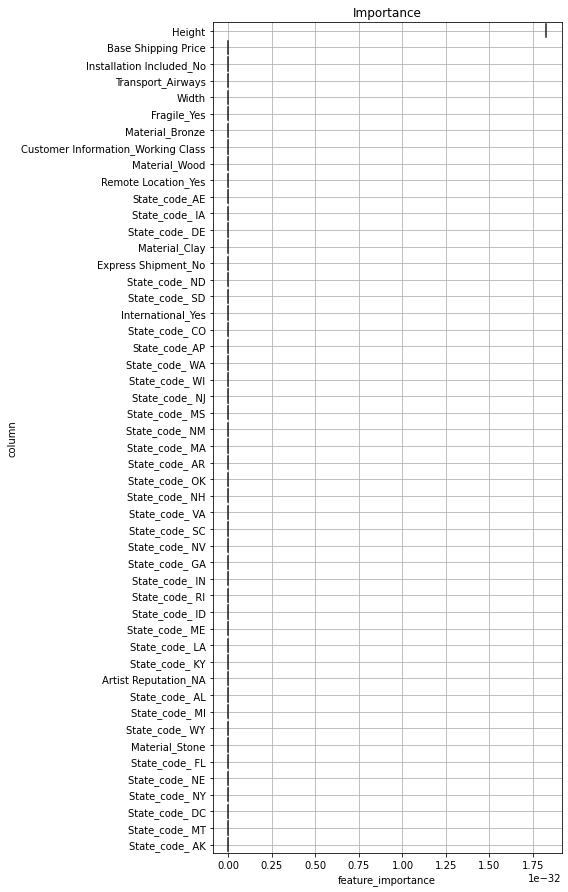

In [46]:
# Fit a Linear Regression model to the train dataset

# Import LinearRegressor
from sklearn.linear_model import LinearRegression

# Instantiate the model
lModel = LinearRegression()

# Fit the model to the data
lModel.fit(X_train,Y_train)

# print score of the model
print_score(lModel)

# visualizing the inportance of features.
fig, ax = visualize_importance(lModel.coef_, train_X)

### Random Forest Regressor

Random forest is a flexible, easy to use machine learning algorithm that produces, even without hyper-parameter tuning, a great result most of the time. It is also one of the most used algorithms, because of its simplicity and diversity.

RMSE-Train: 0.1254866990274397
RMSE-Test: 0.33007066379057864
Score-Train: 0.9942059240103189
Score-Test: 0.9608726914540545
MedAE-Train: 0.05045237262200786
MedAE-Test: 0.13444762457993198
MeanAE-Train: 0.07946951933134282
MeanAE-Test: 0.20567364003769714


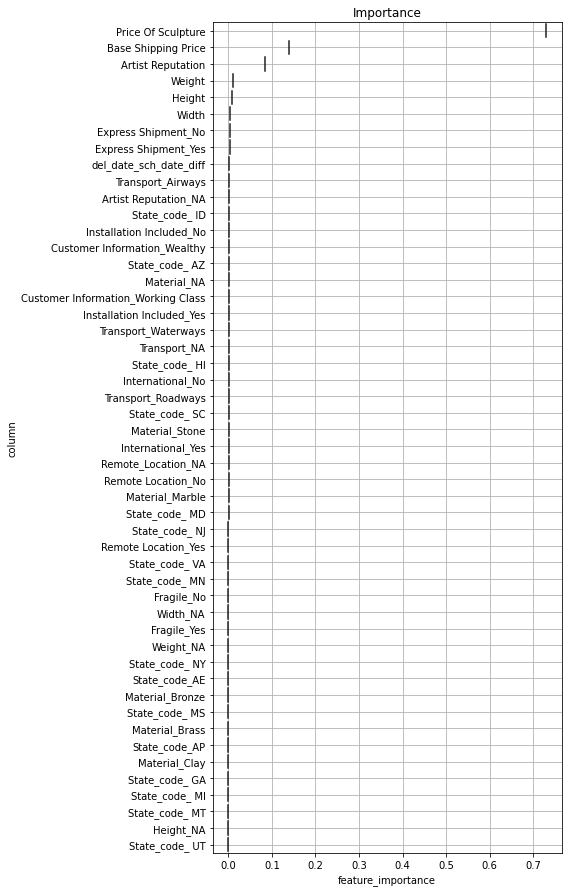

In [47]:
# Fit a Random Forest Regressor model to the train dataset

# Import RandomForrestRegressor
from sklearn.ensemble import RandomForestRegressor

# Instantiate the model
rf= RandomForestRegressor()

# Fit the model to the data
rf.fit(X_train,Y_train)

# print score of the model
print_score(rf)

# visualizing the inportance of features.
fig, ax = visualize_importance(rf.feature_importances_, train_X)

### KNeighbors Regressor

KNN regression is a non-parametric method that, in an intuitive manner, approximates the association between independent variables and the continuous outcome by averaging the observations in the same neighbourhood. The size of the neighbourhood needs to be set by the analyst or can be chosen using cross-validation to select the size that minimises the mean-squared error.

In [48]:
# Fit a K-Neighbour Regressor model to the train dataset

# Import KNeighbourRegressor
from sklearn.neighbors import KNeighborsRegressor

# Instantiate the model
knnr = KNeighborsRegressor()

# Fit the model to the data
knnr.fit(X_train, Y_train)

# print score of the model
print_score(knnr)

RMSE-Train: 0.8212558853615078
RMSE-Test: 1.0773023339745624
Score-Train: 0.7518319969374307
Score-Test: 0.5831869350405675
MedAE-Train: 0.35711496611164817
MedAE-Test: 0.46782290492760925
MeanAE-Train: 0.5404543953240657
MeanAE-Test: 0.7038822312106501


### Gradient Boosting Regressor

Gradient Boosting Algorithm is generally used when we want to decrease the Bias error.
it builds an additive model in a forward stage-wise fashion; it allows for the optimization of arbitrary differentiable loss functions. In each stage a regression tree is fit on the negative gradient of the given loss function.

RMSE-Train: 0.3026815791636037
RMSE-Test: 0.33670273005230195
Score-Train: 0.9662898427357667
Score-Test: 0.9592845351585594
MedAE-Train: 0.13076971859478048
MedAE-Test: 0.14529498899098447
MeanAE-Train: 0.20050495222123038
MeanAE-Test: 0.21899697978435387


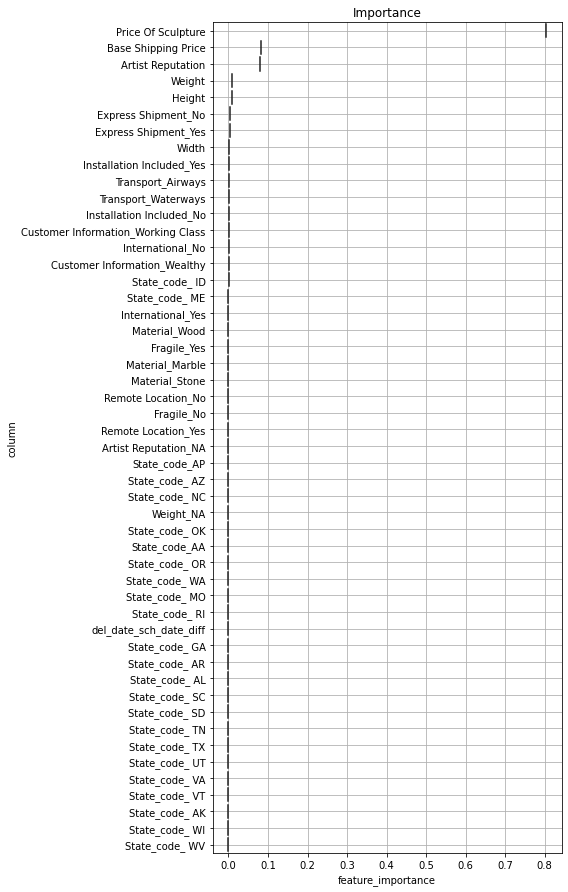

In [49]:
# Fit a Gradient Boosting Regressor model to the train dataset

# Import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Instantiate the model
GBR = GradientBoostingRegressor()

# Fit the model to the data
GBR.fit(X_train, Y_train)

# print score of the model
print_score(GBR)

# visualizing the inportance of features.
fig, ax = visualize_importance(GBR.feature_importances_, train_X)

### DecisionTree Regressor

Decision tree builds regression or classification models in the form of a tree structure. It breaks down a dataset into smaller and smaller subsets while at the same time an associated decision tree is incrementally developed. The final result is a tree with decision nodes and leaf nodes

RMSE-Train: 0.3026815791636037
RMSE-Test: 0.33670273005230195
Score-Train: 0.9662898427357667
Score-Test: 0.9592845351585594
MedAE-Train: 0.13076971859478048
MedAE-Test: 0.14529498899098447
MeanAE-Train: 0.20050495222123038
MeanAE-Test: 0.21899697978435387


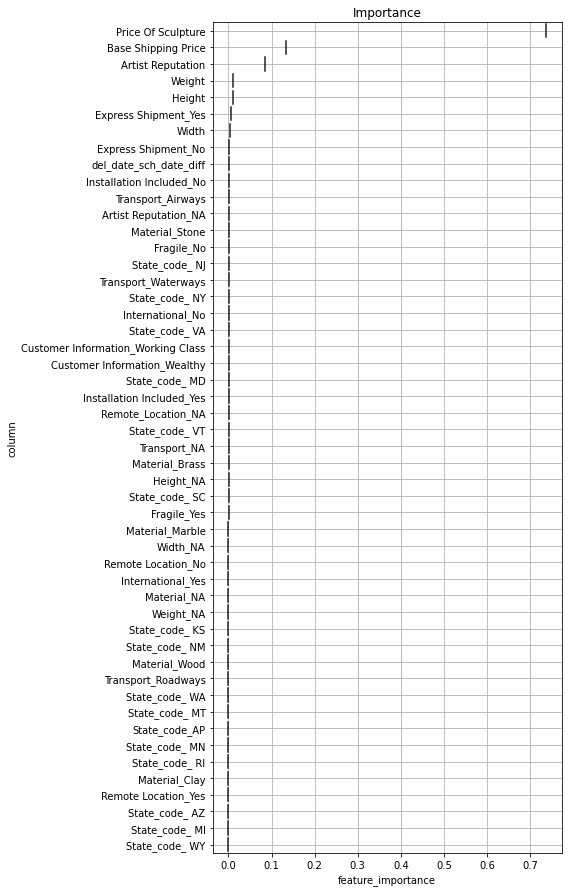

In [50]:
# Fit a Decision Tree Regressor model to the train dataset

# Import DecisionTreeRegressor
from sklearn.tree import DecisionTreeRegressor

# Instantiate the model
DTR = DecisionTreeRegressor()

# Fit the model to the data
DTR.fit(X_train, Y_train)

# print score of the model
print_score(GBR)

# visualizing the inportance of features.
fig, ax = visualize_importance(DTR.feature_importances_, train_X)

### AdaBoost Regressor

An AdaBoost regressor is a meta-estimator that begins by fitting a regressor on the original dataset and then fits additional copies of the regressor on the same dataset but where the weights of instances are adjusted according to the error of the current prediction

RMSE-Train: 0.6043885764449699
RMSE-Test: 0.6138053167904111
Score-Train: 0.8655931847632172
Score-Test: 0.864690772723991
MedAE-Train: 0.4578386692722236
MedAE-Test: 0.45552636231192833
MeanAE-Train: 0.502114903692778
MeanAE-Test: 0.5031019414583608


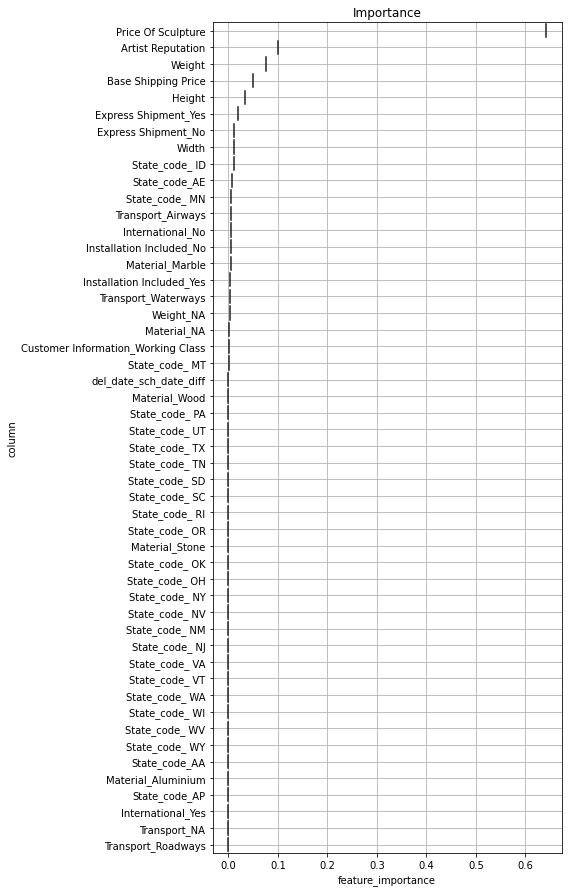

In [51]:
# Fit a AdaBoost Regressor model to the train dataset

# Import AdaBoostRegressor
from sklearn.ensemble import AdaBoostRegressor

# Instantiate the model
AdaBoost = AdaBoostRegressor()

# Fit the model to the data
AdaBoost.fit(X_train, Y_train)

# print score of the model
print_score(AdaBoost)

# visualizing the inportance of features.
fig, ax = visualize_importance(AdaBoost.feature_importances_, train_X)

### XGBoost

XGBoost is an ensemble learning method. Sometimes, it may not be sufficient to rely upon the results of just one machine learning model. Ensemble learning offers a systematic solution to combine the predictive power of multiple learners. The resultant is a single model which gives the aggregated output from several models.

[08:33:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE-Train: 0.3119225229298267
RMSE-Test: 0.34482102164164946
Score-Train: 0.9642000626882773
Score-Test: 0.957297471576135
MedAE-Train: 0.13148791888492672
MedAE-Test: 0.1511098860339941
MeanAE-Train: 0.20350351401106026
MeanAE-Test: 0.22273593311555115


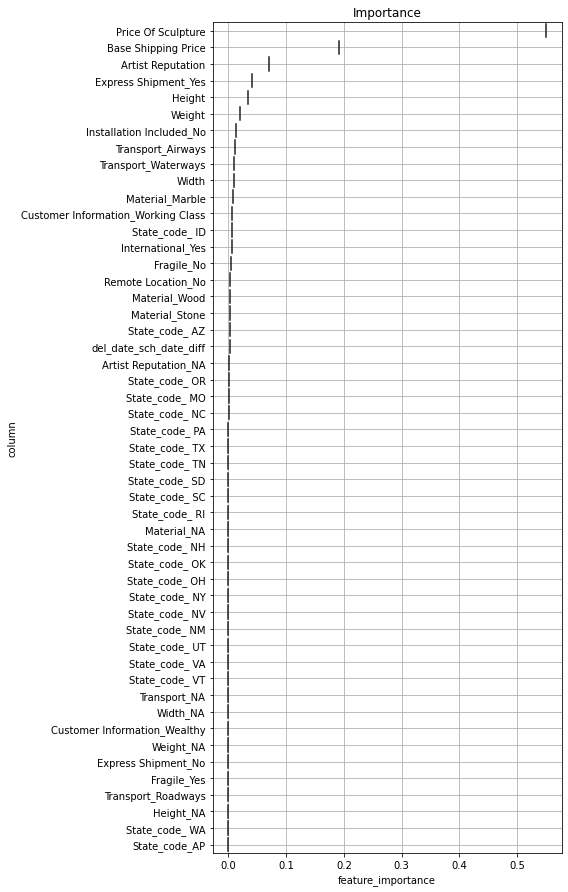

In [52]:
# Fit a XGB Regressor model to the train dataset

# Import XGBRegressor
from xgboost import XGBRegressor

# Instantiate the model
xgbr = XGBRegressor()

# Fit the model to the data
xgbr.fit(X_train,Y_train)

# print score of the model
print_score(xgbr)

# visualizing the inportance of features.
fig, ax = visualize_importance(xgbr.feature_importances_, train_X)

### Light Gradient Boosted Machine

Light GBM is a fast, distributed, high-performance gradient boosting framework based on decision tree algorithm, used for ranking, classification and many other machine learning tasks.

RMSE-Train: 0.19291244466684387
RMSE-Test: 0.29565804512939314
Score-Train: 0.9863066633435876
Score-Test: 0.9686060816779425
MedAE-Train: 0.08118381320109513
MedAE-Test: 0.11498743694926539
MeanAE-Train: 0.12444279512301461
MeanAE-Test: 0.18128063847960138


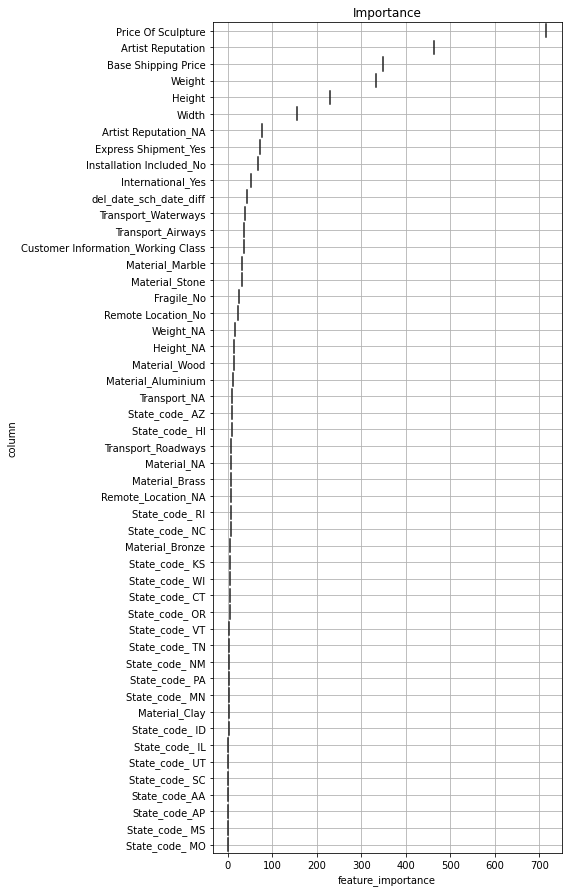

In [53]:
# Fit a lightgbm Regressor model to the train dataset

# Import lightgbm
import lightgbm as lgbm

# Instantiate the model
lg = lgbm.LGBMRegressor()

# Fit the model to the data
lg.fit(X_train, Y_train)

# print score of the model
print_score(lg)

# visualizing the inportance of features.
fig, ax = visualize_importance(lg.feature_importances_, train_X)

### Comparing all the model based on metric

In [57]:
# comparison based on meterics for each model.
def compare_models(models,names,X_train,y_train,X_test,y_test):
    # the libraries we need
    import sklearn.metrics as metrics
    from sklearn.model_selection import train_test_split


    # now, create a dict with the list of metrics 
    data = {'Metric':['rmse','MedAE','MAE','R-squared']}
    
    result_train = pd.DataFrame(data)
    
    result_test = pd.DataFrame(data)

    def rmse(x,y):
       return math.sqrt(((x-y)**2).mean())


    for (model,name) in zip(models,names):
       y_pred= model.predict(X_test) # then predict on the test set
       res = [rmse(model.predict(X_train), y_train),rmse(model.predict(X_test), y_test),
               metrics.median_absolute_error(model.predict(X_train), y_train),metrics.median_absolute_error(model.predict(X_test), y_test),
               metrics.mean_absolute_error(model.predict(X_train), y_train),metrics.mean_absolute_error(model.predict(X_test), y_test),
               metrics.r2_score(model.predict(X_train), y_train),metrics.r2_score(model.predict(X_test), y_test)]
    result_train[name] = [res[0], res[2], res[4], res[6]]
    result_test[name] = [res[1], res[3], res[5], res[7]]
    return result_train,result_test

In [58]:
# create a list of objects of models
models= [lModel, DTR, rf, knnr, GBR, xgbr, AdaBoost]
# create a list of names of each model
names = ['Lr', 'Dtree', 'Forest', 'Knn','GBR', 'Xboost', 'AdaBoost']
# passing data for comparison
comp_model_train,comp_model_test = compare_models(models,names,X_train,Y_train,X_test,Y_test)

#### RMSE of all model on train and test data

In [59]:
# printing rmse comparision of model on train and test
print(comp_model_train[:1])
print('\n')
print(comp_model_test[:1])

  Metric  AdaBoost
0   rmse  0.604389


  Metric  AdaBoost
0   rmse  0.613805


#### All metrics on train and test data

In [60]:
# printing comparision of model on train and test
print("Results on Train data")
comp_model_train

Results on Train data


,Metric,AdaBoost
0,rmse,0.604389
1,MedAE,0.457839
2,MAE,0.502115
3,R-squared,0.843021


In [61]:
# printing comparision of model on train and test
print("Results on Test data")
comp_model_test

Results on Test data


,Metric,AdaBoost
0,rmse,0.613805
1,MedAE,0.455526
2,MAE,0.503102
3,R-squared,0.843530


## Hyperparameter Tunning

A hyperparameter is a parameter whose value is set before the learning process begins.

Hyperparameters tuning is crucial as they control the overall behavior of a machine learning model. 

Every machine learning models will have different hyperparameters that can be set.

### RamdomizedSearchCV

RandomizedSearchCV is very useful when we have many parameters to try and the training time is very long.
 1. The first step is to write the parameters that we want to consider
 2. From these parameters select the best ones.(which are printed in output)

In [62]:
# Helper function to perform hyper parameter tunning with RandomizedSearchCV
def random_Search(model,X_train, Y_train,param_grid):
    from sklearn.model_selection import RandomizedSearchCV

    # Random search of parameters, using 3 fold cross validation, 
    # search across 100 different combinations, and use all available cores
    random = RandomizedSearchCV(estimator = model, param_distributions = param_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
    random.fit(X_train, Y_train)
    print("\n Best parameters: ",random.best_params_)

In [ ]:
# create parameters dict for tunning
rf_para_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

# passing data for hyper parameter tunning with Randomized search cv
random_Search(RandomForestRegressor(),X_train, Y_train, param_grid=rf_para_grid)

In [ ]:
# create parameters dict for tunning
GBR_para_grid = {
'n_estimators':  [x for x in range(50,500, 20)], 
 'learning_rate' : [0.1, 0.2, 0.3, 0.4, 0.5],
 'max_depth': [x for x in range(5,20)], 
 'min_samples_split': [x for x in range(2,10)]
}

# passing data for hyper parameter tunning with Randomized search cv
random_Search(GradientBoostingRegressor(),X_train, Y_train, param_grid = GBR_para_grid )

In [ ]:
# create parameters dict for tunning
knn_para_grid = {
                  'leaf_size' :list(range(1,50)),
                  'n_neighbors' : list(range(1,30)),
                  'p' :[1,2]
              }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(KNeighborsRegressor(),X_train, Y_train, param_grid = knn_para_grid)

In [ ]:
# create parameters dict for tunning
DTR_para_grid = {
                  "splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]
              }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(DecisionTreeRegressor(),X_train, Y_train, param_grid = DTR_para_grid)

In [ ]:
# create parameters dict for tunning
Ada_para_grid = {
                  'n_estimators' :[10, 50, 100, 500],
                  'learning_rate' : [0.0001, 0.001, 0.01, 0.1, 1.0]
              }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(AdaBoostRegressor(),X_train, Y_train, param_grid = Ada_para_grid)

In [ ]:
# create parameters dict for tunning
XGB_para_grid = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] }

# passing data for hyper parameter tunning with Randomized search cv
random_Search(XGBRegressor(),X_train, Y_train, param_grid = XGB_para_grid)

### NOTE:

you can use any one of RandomizedSearchCv or GridSearchCV, both works fine.


### GridSearchCV

One traditional and popular way to perform hyperparameter tuning is by using an Exhaustive Grid Search from Scikit learn. 

This method tries every possible combination of each set of hyper-parameters. 

Using this method, we can find the best set of values in the parameter search space. 

This usually uses more computational power and takes a long time to run since this method needs to try every combination in the grid size.a model for each combination of algorithm parameters specified in a grid.

In [ ]:
# Helper function to perform hyper parameter tunning with GridSearchCV
def grid_search(model,grid)
    from sklearn.model_selection import GridSearchCV 

    # Grid search of parameters, using 5 fold cross validation
    model_cv = GridSearchCV(estimator = model,
     param_grid = grid,
     scoring= 'neg_mean_absolute_error',
     cv = 5,
     return_train_score=True,
                            n_jobs=8,
    verbose = 1)

    #fit model_cv
    model_cv.fit(X_train, Y_train) 
    
    print(model_cv.best_params_)
    print(model_cv.best_score_)


In [ ]:
# create parameters dict in list for tunning
rf_para_grid = [
{
'n_estimators' : [100, 300, 500, 800, 1200],
    'max_depth' : [5, 8, 15, 25, 30],
    'min_samples_split' : [2, 5, 10, 15, 100],
    'min_samples_leaf' : [1, 2, 5, 10],
}
]

# passing data for hyper parameter tunning with Gridsearchcv
grid_search(rf, X_train, Y_train, param_grid = rf_para_grid)

In [67]:
# preparing test data as similarly as done for train data before.
def prepare_data(df):
    df.drop(['Customer Id', 'Artist Name'], axis = 1, inplace=True)
    df['Artist Reputation_NA'] = np.where(df['Artist Reputation'].isnull(), 1, 0)
    df['Artist Reputation'].fillna(Artist_Reputation_mean, inplace = True)
    
    df['Transport_NA'] = np.where(df['Transport'].isnull(), 1, 0)
    df['Transport'].fillna(df['Transport'].mode()[0], inplace = True)
    
    df['Remote_Location_NA'] = np.where(df['Remote Location'].isnull(), 1, 0)
    df['Remote Location'].fillna(df['Remote Location'].mode()[0], inplace = True)
    
    df['Height_NA'] = np.where(df['Height'].isnull(), 1, 0)
    df['Height'].fillna(Height_mean, inplace = True)
    df['Height'] = np.exp(df['Height'])
    
    
    df['Width_NA'] = np.where(df['Width'].isnull(), 1, 0)
    df['Width'].fillna(Width_mean, inplace = True)
    df['Width'] = np.log(df['Width'])
    
    df['Weight_NA'] = np.where(df['Weight'].isnull(),1,0)
    df['Weight'].fillna(Weight_median, inplace = True)
    df['Weight'] = np.log(df['Weight'])
    
    df['Material_NA'] = np.where(df['Material'].isnull(), 1, 0)
    df['Material'].fillna('NA', inplace = True)
    
    df['Price Of Sculpture'] = np.log(df['Price Of Sculpture'])

    df['Delivery Date'] = pd.to_datetime(df['Delivery Date'], format='%m/%d/%y')
    df['Scheduled Date'] = pd.to_datetime(df['Scheduled Date'], format='%m/%d/%y')
    df['del_date_sch_date_diff'] = (df['Delivery Date'] - df['Scheduled Date']).dt.days
    df['del_date_sch_date_diff'] = np.abs(df['del_date_sch_date_diff'])
    
    df.drop(['Delivery Date', 'Scheduled Date'], axis = 1, inplace=True)
    
    df['city'] = df['Customer Location'].str.split(',', expand=True)[0]
    df['State_code'] = df['Customer Location'].str.split(',', expand=True)[1].str.slice(0, 3)
    df['pin'] = df['Customer Location'].str.split(',', expand=True)[1].str.split(' ', expand=True)[2]
    
    city_others = df[df['State_code'].isna()]['Customer Location'].str.split(' ', expand=True)[0]
    city_others.index = df[df['State_code'].isnull()].index
    
    State_code_others = df[df['State_code'].isna()]['Customer Location'].str.split(' ', expand=True)[1]
    State_code_others.index = df[df['State_code'].isnull()].index
    
    pin_others = df[df['pin'].isna()]['Customer Location'].str.split(' ', expand=True)[2]
    pin_others.index = df[df['pin'].isnull()].index
    
    
    df.loc[df['State_code'].isnull(), 'city'] = city_others
    df.loc[df['State_code'].isnull(), 'State_code'] = State_code_others
    df.loc[df['pin'].isnull(), 'pin'] = pin_others
    
    #df['pin'] = df['pin'].astype(int)
    
    df.drop(['Customer Location'], axis = 1, inplace=True)
    df.drop(['city', 'pin'], axis = 1, inplace=True)    
    return df

### Now working with the test dataset provided

In [68]:
sample_submission = test_data[['Customer Id']]

In [69]:
# Prepare the test dataset i.e do all the transformation that was done on train dataset
test_data = prepare_data(test_data)

In [70]:
# Perform One Hot Encoding on test dataset
test_data = ohe_enc.transform(test_data)

In [71]:
# Check if the shape of the train dataset and test dataset matches
print(train_X.shape)
print(test_data.shape)

(6500, 90)
(3500, 90)


In [72]:
# Perforn the prediction on the test dataset
X_test = test_data
y_predicted = rf.predict(X_test)

In [73]:
# Scale the target variable
sample_submission['Cost'] = np.exp(y_predicted)

In [74]:
# Save the dataframe in the CSV format
sample_submission.to_csv('sample_submission.csv', index=False)